##### Author  : SIVA VIKNESH & YOUNES TATARI
##### Email   : siva.viknesh@sci.utah.edu / sivaviknesh14@gmail.com , younes.tatari@utah.edu/ younes.tatari@gmail.com
##### Address : SCI INSTITUTE, UNIVERSITY OF UTAH, SALT LAKE CITY, UTAH, USA

In [1]:
import os
import torch
import math
import torch.nn as nn
import torch.optim as optim
from torch.nn.parameter import Parameter
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.ticker as plticker
from mpl_toolkits.mplot3d import Axes3D
from scipy import integrate

rcParams.update({'font.size': 18})
plt.rcParams['figure.figsize'] = [12, 12]


Combustion:  <br>
Paper: Symbolic regression via neural networks :
\
Chemical kinetics with Arrhenius rate dependence


$$
\dot{\alpha} = -k \alpha  e^{\theta} + \mu
$$

$$
\dot{\theta} = \alpha e^{\theta} - \theta
$$

Parameters: \\(k\\), \\(\mu\\)

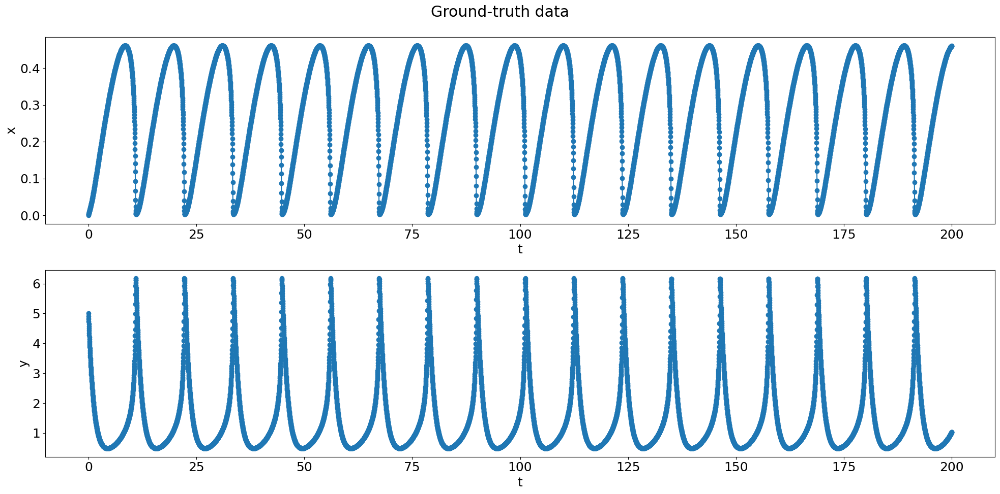

In [2]:
k  = 0.07
mu = 0.1
a  = 1.015
b  = 1.025

def oscillator_deriv(x_y, t0, a =a, b =b,  k=k, mu =mu):
    x, y = x_y
    dxdt = -k*x*np.exp(a*y) + mu
    dydt = x*np.exp(b*y) - y
    return [dxdt, dydt]

np.random.seed(123)
x0 = (0.0,5.0)

# Time points
t = np.linspace(0, 200, 10000)

x_t = integrate.odeint(oscillator_deriv, x0, t, rtol=10**(-12),atol=10**(-12)*np.ones_like(x0))
x, y = x_t.T

fig, ax = plt.subplots(nrows = 2, ncols = 1, figsize =(20, 10))
fig.suptitle('Ground-truth data')

ax[0].plot(t, x, '-o')
#ax[0].set_title('$x$')
ax[0].set(xlabel="t",ylabel="x")

ax[1].plot(t, y, '-o')
#ax[1].set_title('$y$')
ax[1].set(xlabel="t",ylabel="y")

fig.tight_layout()
plt.show()

In [3]:
# COMPUTING THE COMBINATIONS AMONG THE THREE CHOSEN TEMPORAL MODES

def POOL_DATA(yin, nVars, polyorder):
    n = yin.shape[0]
    yout = torch.zeros((n, 1)).to(processor)

    # poly order 0
    yout[:, 0] = torch.ones(n)

    # poly order 1
    for i in range(nVars):
        yout = torch.cat((yout, yin[:, i].reshape((yin.shape[0], 1))), dim=1).to(processor)

    # poly order 2
    if polyorder >= 2:
        for i in range(nVars):
            for j in range(i, nVars):
                yout = torch.cat((yout, (yin[:, i] * yin[:, j]).reshape((yin.shape[0], 1))), dim=1).to(processor)

    # poly order 3
    #if polyorder >= 3:
        #for i in range(nVars):
            #for j in range(i, nVars):
                #for k in range(j, nVars):
                    #yout = torch.cat((yout, (yin[:, i] * yin[:, j] * yin[:, k]).reshape((yin.shape[0], 1))), dim=1).to(processor)

    return yout

def DERIVATIVE(x, y, k, a, b, mu):
    dxdt = -k*torch.mul(x,torch.exp(a*y)) + mu
    dydt = torch.mul(x, torch.exp(b*y)) - y
    return torch.vstack((dxdt, dydt)).T


AVAILABLE PROCESSOR: cuda 



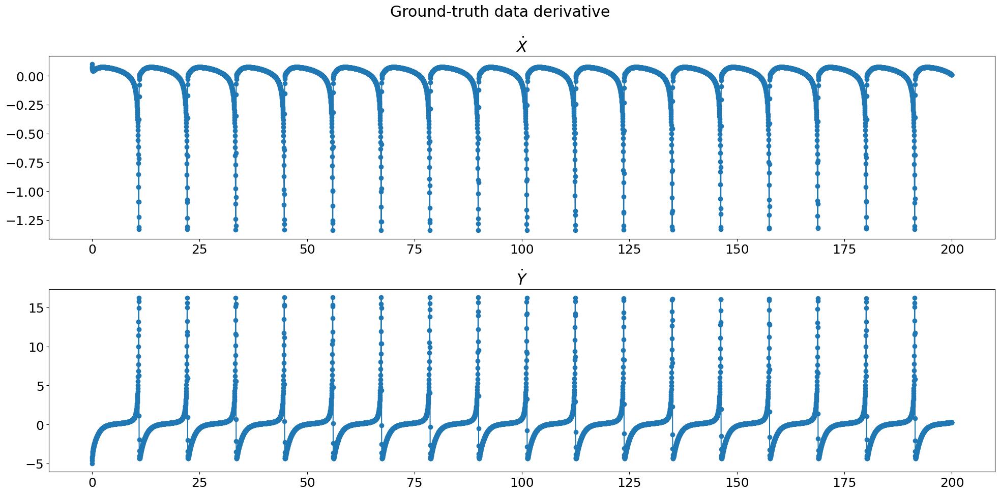

In [4]:
processor = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("AVAILABLE PROCESSOR:", processor, '\n')

N_modes  = 2
x_t      = torch.Tensor(x_t).to(processor)
x        = torch.Tensor(x).to(processor)
y        = torch.Tensor(y).to(processor)
t        = torch.Tensor(t).to(processor)

A_candidates = POOL_DATA (x_t, 2, 1).to(processor)
A1A2_time_deriv = DERIVATIVE (x, y, k, a, b, mu).to(processor)

# HYPERPARAMETERS FOR THE SINDy POD METHODOLOGY
Epochs        = 50000
learning_rate = 1e-2
step_epoch    = 5000
decay_rate    = 0.50


fig, ax = plt.subplots(nrows = 2, ncols = 1, figsize =(20, 10))
fig.suptitle('Ground-truth data derivative')

ax[0].plot(t.detach().cpu().numpy(), A1A2_time_deriv[:, 0].detach().cpu().numpy(), '-o')
ax[0].set_title(r"$\dot{X}$")

ax[1].plot(t.detach().cpu().numpy(), A1A2_time_deriv[:, 1].detach().cpu().numpy(), '-o')
ax[1].set_title(r"$\dot{Y}$")

fig.tight_layout()
plt.show()

In [5]:
class SINE_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b

    def forward(self, x):
        output = torch.sin(self.b*x)
        return output

class COSINE_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b

    def forward(self, x):
        output = torch.cos(self.b*x)
        return output

class POWER_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b

    def forward(self, x):
        output = torch.sign(x) * torch.pow(torch.abs(x), self.b)
        return output

class EXP_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b

    def forward(self, x):
        output = torch.exp(self.b*x)
        return output


In [6]:
class ADAPTIVE_SINDy_MODEL(nn.Module):
    def __init__(self, a, aexp, axexp):
        super().__init__()
        self.a       = a
        self.aexp    = aexp
        self.axexp   = axexp
    
        self.exp     = EXP_TERM  (self.aexp)
        self.axexp   = EXP_TERM  (self.axexp)

    def forward(self, x):
        x1           = x [:, 1:]
        output_exp   = self.exp   (x1)
        output_xexp  = self.axexp (x1)

        output_xexp  = (output_xexp  [:,None] * x1[...,None]).reshape(x1.shape[0], -1)
        output       = torch.hstack((x, output_exp, output_xexp )) @ self.a

        return output


In [7]:
# AMPLITUDE COEFFICIENTS OF SINDy MODEL
COEFF_ADT  = torch.ones(9, N_modes, requires_grad= True, device= processor)

EXP_ADT    = torch.full((A_candidates.shape[1]-1, N_modes), 2.0, requires_grad= True, device= processor)
XEXP_ADT   = torch.full((A_candidates.shape[1]-1, N_modes), 2.0, requires_grad= True, device= processor)

In [8]:
# COEFFICIENTS OF SINDy MODEL
optim_COEFF_ADT = optim.Adam([COEFF_ADT, EXP_ADT, XEXP_ADT], lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)


# WEIGHT FUNCTION OF SINDy MODEL
WEIGHTS  = Parameter(torch.ones_like(COEFF_ADT), requires_grad= True)
Lambda   = Parameter(torch.tensor(1.0), requires_grad= True)

optim_weights = optim.Adam([WEIGHTS], lr = learning_rate, betas = (0.9,0.99),eps = 10**-15)
optim_Lambda  = optim.Adam([Lambda],  lr = learning_rate, betas = (0.9,0.99),eps = 10**-15)


# STEP DECAY DYNAMIC LEARNING RATE
scheduler_ADT     = torch.optim.lr_scheduler.StepLR(optim_COEFF_ADT, step_size=step_epoch, gamma=decay_rate)
scheduler_weights = torch.optim.lr_scheduler.StepLR(optim_weights,   step_size=step_epoch, gamma=decay_rate)
scheduler_LAMBDA  = torch.optim.lr_scheduler.StepLR(optim_Lambda,    step_size=step_epoch, gamma=decay_rate)



**Adaptive SINDy training**

In [9]:
# TEMPORAL MODE 1
A1_DT = ADAPTIVE_SINDy_MODEL(COEFF_ADT [:, 0], EXP_ADT[:, 0] , XEXP_ADT[:, 0]).to(processor)

# TEMPORAL MODE 2
A2_DT = ADAPTIVE_SINDy_MODEL(COEFF_ADT [:, 1], EXP_ADT[:, 1] , XEXP_ADT[:, 1]).to(processor)

Loss_data     = torch.empty(size=(Epochs, 1))
loss_function = nn.MSELoss()

for epoch in range(Epochs):
    A1_out, A2_out  = A1_DT (A_candidates), A2_DT (A_candidates)
    output_data  = torch.stack((A1_out , A2_out), dim = 1)
    loss_epoch   = loss_function (A1A2_time_deriv, output_data) + torch.linalg.matrix_norm(torch.abs(WEIGHTS)*COEFF_ADT, ord =1)

    optim_COEFF_ADT.zero_grad()
    optim_Lambda.zero_grad()
    optim_weights.zero_grad()
    loss_epoch.backward()

    with torch.no_grad():
        optim_COEFF_ADT.step()
        optim_Lambda.step()
        optim_weights.step()
        Loss_data [epoch] = loss_epoch.detach()
        COEFF_ADT [torch.abs(COEFF_ADT) <= 1e-3] = 0.0

    print('LOSS DATA, [EPOCH =', epoch,  ']:',  Loss_data [epoch].item())
    print('LEARNING RATE:', optim_COEFF_ADT.param_groups[0]['lr'])
    print ("*"*85)

    scheduler_ADT.step()
    scheduler_LAMBDA.step()
    scheduler_weights.step()

LOSS DATA, [EPOCH = 0 ]: 26416760832.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1 ]: 22955888640.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2 ]: 19960752128.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3 ]: 17376018432.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4 ]: 15150406656.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 5 ]: 13237092352.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 6 ]: 11593873408.0
LEARNING RATE: 0.01
***********************************************************************

LOSS DATA, [EPOCH = 69 ]: 457613984.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 70 ]: 450043136.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 71 ]: 442694304.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 72 ]: 435555968.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 73 ]: 428617376.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 74 ]: 421868864.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 75 ]: 415301280.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 136 ]: 191124880.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 137 ]: 189054336.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 138 ]: 187014048.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 139 ]: 185003328.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 140 ]: 183021648.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 141 ]: 181068464.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 142 ]: 179143408.0
LEARNING RATE: 0.01
***********************************************************************

LOSS DATA, [EPOCH = 203 ]: 99218720.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 204 ]: 98342192.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 205 ]: 97475480.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 206 ]: 96618448.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 207 ]: 95770976.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 208 ]: 94932928.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 209 ]: 94104080.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 266 ]: 58728468.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 267 ]: 58268880.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 268 ]: 57813596.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 269 ]: 57362532.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 270 ]: 56915660.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 271 ]: 56472952.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 272 ]: 56034348.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 330 ]: 36236592.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 331 ]: 35973624.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 332 ]: 35712812.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 333 ]: 35454104.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 334 ]: 35197476.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 335 ]: 34942948.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 336 ]: 34690464.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 401 ]: 21872902.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 402 ]: 21720756.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 403 ]: 21569710.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 404 ]: 21419754.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 405 ]: 21270890.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 406 ]: 21123108.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 407 ]: 20976406.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 467 ]: 13837580.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 468 ]: 13742075.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 469 ]: 13647216.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 470 ]: 13553016.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 471 ]: 13459454.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 472 ]: 13366524.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 473 ]: 13274223.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 536 ]: 8548848.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 537 ]: 8488614.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 538 ]: 8428775.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 539 ]: 8369325.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 540 ]: 8310265.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 541 ]: 8251590.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 542 ]: 8193300.5
LEARNING RATE: 0.01
*************************************************************************************

LOSS DATA, [EPOCH = 604 ]: 5229221.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 605 ]: 5190508.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 606 ]: 5152043.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 607 ]: 5113827.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 608 ]: 5075858.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 609 ]: 5038133.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 610 ]: 5000652.5
LEARNING RATE: 0.01
*************************************************************************************

LOSS DATA, [EPOCH = 673 ]: 3068781.75
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 674 ]: 3044076.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 675 ]: 3019531.75
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 676 ]: 2995148.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 677 ]: 2970927.75
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 678 ]: 2946866.25
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 679 ]: 2922962.0
LEARNING RATE: 0.01
*********************************************************************************

LOSS DATA, [EPOCH = 740 ]: 1730268.75
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 741 ]: 1714564.25
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 742 ]: 1698971.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 743 ]: 1683485.25
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 744 ]: 1668109.25
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 745 ]: 1652839.75
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 746 ]: 1637676.625
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 858 ]: 493269.4375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 859 ]: 487058.78125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 860 ]: 480904.5625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 861 ]: 474807.25
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 862 ]: 468765.78125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 863 ]: 462780.40625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 864 ]: 456850.375
LEARNING RATE: 0.01
***********************************************************************

LOSS DATA, [EPOCH = 977 ]: 71657.328125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 978 ]: 70173.171875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 979 ]: 68712.734375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 980 ]: 67275.703125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 981 ]: 65861.921875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 982 ]: 64471.08203125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 983 ]: 63102.9921875
LEARNING RATE: 0.01
*************************************************************

LOSS DATA, [EPOCH = 1047 ]: 12443.419921875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1048 ]: 12078.7744140625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1049 ]: 11723.125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1050 ]: 11376.28125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1051 ]: 11038.10546875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1052 ]: 10708.4169921875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1053 ]: 10387.064453125
LEARNING RATE: 0.01
*********************************************

LOSS DATA, [EPOCH = 1116 ]: 1227.6708984375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1117 ]: 1186.58056640625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1118 ]: 1147.113037109375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1119 ]: 1109.1785888671875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1120 ]: 1072.720703125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1121 ]: 1037.7220458984375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1122 ]: 1004.1027221679688
LEARNING RATE: 0.01
*************************

LOSS DATA, [EPOCH = 1181 ]: 328.722412109375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1182 ]: 326.2740173339844
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1183 ]: 323.92578125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1184 ]: 321.65777587890625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1185 ]: 319.4677429199219
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1186 ]: 317.35394287109375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1187 ]: 315.3189697265625
LEARNING RATE: 0.01
**************************

LOSS DATA, [EPOCH = 1246 ]: 258.4285583496094
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1247 ]: 257.86785888671875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1248 ]: 257.2928466796875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1249 ]: 256.7261657714844
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1250 ]: 256.1622619628906
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1251 ]: 255.5928955078125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1252 ]: 255.04344177246094
LEARNING RATE: 0.01
********************

LOSS DATA, [EPOCH = 1310 ]: 225.3988494873047
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1311 ]: 224.9286651611328
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1312 ]: 224.4407958984375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1313 ]: 223.95721435546875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1314 ]: 223.4801025390625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1315 ]: 223.00125122070312
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1316 ]: 222.52255249023438
LEARNING RATE: 0.01
*******************

LOSS DATA, [EPOCH = 1373 ]: 196.4485626220703
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1374 ]: 196.00401306152344
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1375 ]: 195.5461883544922
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1376 ]: 195.11717224121094
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1377 ]: 194.71372985839844
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1378 ]: 194.26486206054688
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1379 ]: 193.8063201904297
LEARNING RATE: 0.01
******************

LOSS DATA, [EPOCH = 1439 ]: 168.1588897705078
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1440 ]: 167.7470703125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1441 ]: 167.35000610351562
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1442 ]: 166.927734375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1443 ]: 166.52085876464844
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1444 ]: 166.09469604492188
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1445 ]: 165.71441650390625
LEARNING RATE: 0.01
*************************

LOSS DATA, [EPOCH = 1505 ]: 141.34852600097656
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1506 ]: 140.94760131835938
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1507 ]: 140.53956604003906
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1508 ]: 140.150390625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1509 ]: 139.7517547607422
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1510 ]: 139.36013793945312
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1511 ]: 138.97581481933594
LEARNING RATE: 0.01
*********************

LOSS DATA, [EPOCH = 1570 ]: 116.26121520996094
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1571 ]: 115.90900421142578
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1572 ]: 115.56768035888672
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1573 ]: 115.18598937988281
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1574 ]: 114.8237075805664
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1575 ]: 114.45567321777344
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1576 ]: 114.06362915039062
LEARNING RATE: 0.01
****************

LOSS DATA, [EPOCH = 1635 ]: 92.8619613647461
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1636 ]: 92.54376220703125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1637 ]: 92.19401550292969
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1638 ]: 91.82170104980469
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1639 ]: 91.47464752197266
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1640 ]: 91.1385726928711
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1641 ]: 90.79708099365234
LEARNING RATE: 0.01
************************

LOSS DATA, [EPOCH = 1698 ]: 72.29351806640625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1699 ]: 71.97673797607422
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1700 ]: 71.6691665649414
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1701 ]: 71.35990142822266
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1702 ]: 71.0375747680664
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1703 ]: 70.7473373413086
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1704 ]: 70.44766998291016
LEARNING RATE: 0.01
*************************

LOSS DATA, [EPOCH = 1754 ]: 56.17487335205078
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1755 ]: 55.916015625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1756 ]: 55.66817855834961
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1757 ]: 55.40944290161133
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1758 ]: 55.130287170410156
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1759 ]: 54.845733642578125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1760 ]: 54.591331481933594
LEARNING RATE: 0.01
************************

LOSS DATA, [EPOCH = 1815 ]: 68.27144622802734
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1816 ]: 67.80931854248047
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1817 ]: 67.3403549194336
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1818 ]: 66.87895202636719
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1819 ]: 66.41557312011719
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1820 ]: 65.97199249267578
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1821 ]: 65.50474548339844
LEARNING RATE: 0.01
***********************

LOSS DATA, [EPOCH = 1879 ]: 37.03899383544922
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1880 ]: 36.655853271484375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1881 ]: 36.28195571899414
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1882 ]: 35.9224853515625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1883 ]: 35.56827926635742
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1884 ]: 35.21235275268555
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1885 ]: 34.87762451171875
LEARNING RATE: 0.01
**********************

LOSS DATA, [EPOCH = 1939 ]: 20.77838134765625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1940 ]: 20.5989990234375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1941 ]: 20.42733383178711
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1942 ]: 20.238069534301758
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1943 ]: 20.044898986816406
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1944 ]: 19.860076904296875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1945 ]: 19.688955307006836
LEARNING RATE: 0.01
*******************

LOSS DATA, [EPOCH = 2000 ]: 12.428065299987793
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2001 ]: 12.320146560668945
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2002 ]: 12.201687812805176
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2003 ]: 12.115219116210938
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2004 ]: 12.02571964263916
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2005 ]: 11.949843406677246
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2006 ]: 11.85245132446289
LEARNING RATE: 0.01
*****************

LOSS DATA, [EPOCH = 2058 ]: 7.981076240539551
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2059 ]: 7.931126117706299
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2060 ]: 7.879374027252197
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2061 ]: 7.811730861663818
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2062 ]: 7.745357513427734
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2063 ]: 7.692759990692139
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2064 ]: 7.635106086730957
LEARNING RATE: 0.01
**********************

LOSS DATA, [EPOCH = 2121 ]: 4.916961669921875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2122 ]: 4.880918502807617
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2123 ]: 4.8443169593811035
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2124 ]: 4.803009986877441
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2125 ]: 4.764157295227051
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2126 ]: 4.726489543914795
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2127 ]: 4.701355934143066
LEARNING RATE: 0.01
*********************

LOSS DATA, [EPOCH = 2186 ]: 2.832437515258789
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2187 ]: 2.801971912384033
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2188 ]: 2.7593696117401123
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2189 ]: 2.7314765453338623
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2190 ]: 2.6971652507781982
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2191 ]: 2.6733860969543457
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2192 ]: 2.652956247329712
LEARNING RATE: 0.01
******************

LOSS DATA, [EPOCH = 2251 ]: 1.4521838426589966
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2252 ]: 1.4417668581008911
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2253 ]: 1.421338438987732
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2254 ]: 1.4071904420852661
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2255 ]: 1.389248013496399
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2256 ]: 1.3793927431106567
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2257 ]: 1.36318039894104
LEARNING RATE: 0.01
*******************

LOSS DATA, [EPOCH = 2315 ]: 0.7444575428962708
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2316 ]: 0.7357311844825745
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2317 ]: 0.7163092494010925
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2318 ]: 0.6992543935775757
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2319 ]: 0.6968825459480286
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2320 ]: 0.6953029632568359
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2321 ]: 0.6934474110603333
LEARNING RATE: 0.01
***************

LOSS DATA, [EPOCH = 2380 ]: 0.4050685167312622
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2381 ]: 0.4054669737815857
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2382 ]: 0.3955402076244354
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2383 ]: 0.38604801893234253
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2384 ]: 0.3890862762928009
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2385 ]: 0.3896027207374573
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2386 ]: 0.3941170871257782
LEARNING RATE: 0.01
**************

LOSS DATA, [EPOCH = 2438 ]: 0.2947688102722168
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2439 ]: 0.2972826361656189
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2440 ]: 0.29644790291786194
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2441 ]: 0.29138168692588806
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2442 ]: 0.2907373011112213
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2443 ]: 0.2950676381587982
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2444 ]: 0.2922050356864929
LEARNING RATE: 0.01
*************

LOSS DATA, [EPOCH = 2501 ]: 0.2730537950992584
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2502 ]: 0.2643734812736511
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2503 ]: 0.2556975185871124
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2504 ]: 0.26214003562927246
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2505 ]: 0.2640041410923004
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2506 ]: 0.2671884000301361
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2507 ]: 0.2648017704486847
LEARNING RATE: 0.01
**************

LOSS DATA, [EPOCH = 2565 ]: 0.26911690831184387
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2566 ]: 29.298534393310547
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2567 ]: 0.2686240077018738
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2568 ]: 61.26829147338867
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2569 ]: 0.2723834216594696
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2570 ]: 80.08004760742188
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2571 ]: 0.27567148208618164
LEARNING RATE: 0.01
***************

LOSS DATA, [EPOCH = 2630 ]: 0.21839256584644318
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2631 ]: 0.2246134877204895
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2632 ]: 0.22455063462257385
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2633 ]: 0.23028624057769775
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2634 ]: 0.22398965060710907
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2635 ]: 0.21993646025657654
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2636 ]: 0.2345634400844574
LEARNING RATE: 0.01
**********

LOSS DATA, [EPOCH = 2691 ]: 0.22871482372283936
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2692 ]: 0.2295580804347992
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2693 ]: 0.22158658504486084
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2694 ]: 0.21616488695144653
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2695 ]: 0.21494336426258087
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2696 ]: 0.2221679985523224
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2697 ]: 0.22231417894363403
LEARNING RATE: 0.01
**********

LOSS DATA, [EPOCH = 2751 ]: 0.25887203216552734
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2752 ]: 51.990657806396484
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2753 ]: 0.24562124907970428
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2754 ]: 63.32246398925781
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2755 ]: 0.25612539052963257
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2756 ]: 83.00381469726562
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2757 ]: 0.2716270089149475
LEARNING RATE: 0.01
**************

LOSS DATA, [EPOCH = 2812 ]: 0.20941221714019775
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2813 ]: 0.20842798054218292
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2814 ]: 0.20950178802013397
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2815 ]: 0.20423944294452667
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2816 ]: 0.21006442606449127
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2817 ]: 0.21453247964382172
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2818 ]: 0.21544763445854187
LEARNING RATE: 0.01
********

LOSS DATA, [EPOCH = 2875 ]: 0.2123233526945114
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2876 ]: 0.21932077407836914
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2877 ]: 0.2137153148651123
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2878 ]: 0.19696885347366333
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2879 ]: 0.20396175980567932
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2880 ]: 0.21702325344085693
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2881 ]: 0.21784456074237823
LEARNING RATE: 0.01
**********

LOSS DATA, [EPOCH = 2939 ]: 18.024478912353516
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2940 ]: 0.21720539033412933
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2941 ]: 26.14597511291504
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2942 ]: 0.21652241051197052
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2943 ]: 51.70487976074219
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2944 ]: 0.21797648072242737
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2945 ]: 65.00667572021484
LEARNING RATE: 0.01
***************

LOSS DATA, [EPOCH = 3004 ]: 0.18355213105678558
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3005 ]: 0.17862650752067566
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3006 ]: 0.1825290322303772
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3007 ]: 0.1873740255832672
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3008 ]: 0.1822289228439331
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3009 ]: 0.181102454662323
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3010 ]: 0.18554653227329254
LEARNING RATE: 0.01
*************

LOSS DATA, [EPOCH = 3068 ]: 0.19158877432346344
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3069 ]: 0.18718348443508148
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3070 ]: 0.1811009645462036
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3071 ]: 0.18194778263568878
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3072 ]: 0.1832999289035797
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3073 ]: 0.17687223851680756
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3074 ]: 0.1845882534980774
LEARNING RATE: 0.01
***********

LOSS DATA, [EPOCH = 3130 ]: 0.16116133332252502
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3131 ]: 0.16015352308750153
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3132 ]: 0.16296294331550598
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3133 ]: 0.16071327030658722
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3134 ]: 0.16609172523021698
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3135 ]: 0.16685955226421356
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3136 ]: 0.16960446536540985
LEARNING RATE: 0.01
********

LOSS DATA, [EPOCH = 3194 ]: 117.65509796142578
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3195 ]: 277.8265686035156
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3196 ]: 291.578369140625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3197 ]: 177.5681915283203
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3198 ]: 53.71551513671875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3199 ]: 0.1705140918493271
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3200 ]: 29.3092041015625
LEARNING RATE: 0.01
**********************

LOSS DATA, [EPOCH = 3258 ]: 0.1456826627254486
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3259 ]: 0.14798933267593384
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3260 ]: 0.15209239721298218
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3261 ]: 0.15724432468414307
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3262 ]: 0.15201804041862488
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3263 ]: 0.15067657828330994
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3264 ]: 0.14339663088321686
LEARNING RATE: 0.01
*********

LOSS DATA, [EPOCH = 3320 ]: 9.065009117126465
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3321 ]: 0.7281326055526733
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3322 ]: 1.206268072128296
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3323 ]: 0.9288606643676758
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3324 ]: 0.16420094668865204
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3325 ]: 0.15703222155570984
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3326 ]: 0.15866625308990479
LEARNING RATE: 0.01
**************

LOSS DATA, [EPOCH = 3381 ]: 0.13944168388843536
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3382 ]: 0.13709832727909088
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3383 ]: 8.483292579650879
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3384 ]: 0.6644389629364014
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3385 ]: 1.0924469232559204
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3386 ]: 0.845788300037384
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3387 ]: 0.1384589523077011
LEARNING RATE: 0.01
***************

LOSS DATA, [EPOCH = 3441 ]: 0.9326314926147461
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3442 ]: 0.7297886610031128
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3443 ]: 0.1319049894809723
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3444 ]: 0.13587182760238647
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3445 ]: 0.1309347152709961
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3446 ]: 7.251053333282471
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3447 ]: 0.5707148909568787
LEARNING RATE: 0.01
***************

LOSS DATA, [EPOCH = 3504 ]: 0.10724332183599472
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3505 ]: 0.1085028126835823
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3506 ]: 0.10001985728740692
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3507 ]: 0.10496188700199127
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3508 ]: 0.10269127041101456
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3509 ]: 0.10272346436977386
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3510 ]: 0.10349837690591812
LEARNING RATE: 0.01
*********

LOSS DATA, [EPOCH = 3568 ]: 0.10500859469175339
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3569 ]: 0.10762767493724823
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3570 ]: 0.11534301936626434
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3571 ]: 0.11136488616466522
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3572 ]: 0.11471894383430481
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3573 ]: 0.11657150834798813
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3574 ]: 0.11795917898416519
LEARNING RATE: 0.01
********

LOSS DATA, [EPOCH = 3627 ]: 0.08968985080718994
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3628 ]: 17.011016845703125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3629 ]: 0.09912915527820587
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3630 ]: 18.932918548583984
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3631 ]: 0.09026996791362762
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3632 ]: 21.584476470947266
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3633 ]: 0.09215453267097473
LEARNING RATE: 0.01
***********

LOSS DATA, [EPOCH = 3691 ]: 0.0833681970834732
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3692 ]: 0.08601623773574829
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3693 ]: 0.0795038640499115
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3694 ]: 0.08300695568323135
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3695 ]: 0.07855959981679916
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3696 ]: 0.08473896980285645
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3697 ]: 0.08568644523620605
LEARNING RATE: 0.01
**********

LOSS DATA, [EPOCH = 3754 ]: 0.08341177552938461
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3755 ]: 0.0755670890212059
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3756 ]: 0.07089126855134964
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3757 ]: 0.08303549140691757
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3758 ]: 0.09112002700567245
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3759 ]: 0.08685671538114548
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3760 ]: 0.08004439622163773
LEARNING RATE: 0.01
*********

LOSS DATA, [EPOCH = 3812 ]: 0.2271767407655716
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3813 ]: 0.3813006281852722
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3814 ]: 0.3163130283355713
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3815 ]: 0.0608084611594677
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3816 ]: 0.05920972302556038
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3817 ]: 0.06836754083633423
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3818 ]: 0.07184361666440964
LEARNING RATE: 0.01
************

LOSS DATA, [EPOCH = 3877 ]: 0.056317586451768875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3878 ]: 0.05589284375309944
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3879 ]: 0.06105883792042732
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3880 ]: 0.054318636655807495
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3881 ]: 0.06202705204486847
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3882 ]: 0.06566669046878815
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3883 ]: 0.06766555458307266
LEARNING RATE: 0.01
******

LOSS DATA, [EPOCH = 3943 ]: 0.05015487223863602
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3944 ]: 0.054388243705034256
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3945 ]: 0.05300145223736763
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3946 ]: 0.05259117856621742
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3947 ]: 0.04892565310001373
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3948 ]: 0.04934398829936981
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3949 ]: 0.04785842448472977
LEARNING RATE: 0.01
*******

LOSS DATA, [EPOCH = 4005 ]: 0.041540276259183884
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4006 ]: 0.03864511102437973
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4007 ]: 0.04860297590494156
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4008 ]: 0.05080508440732956
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4009 ]: 0.05137047916650772
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4010 ]: 0.051979828625917435
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4011 ]: 0.046229518949985504
LEARNING RATE: 0.01
*****

LOSS DATA, [EPOCH = 4071 ]: 0.14686410129070282
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4072 ]: 0.11062836647033691
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4073 ]: 0.04158753156661987
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4074 ]: 0.0479116216301918
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4075 ]: 0.04640352725982666
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4076 ]: 0.04818139225244522
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4077 ]: 0.04495123028755188
LEARNING RATE: 0.01
*********

LOSS DATA, [EPOCH = 4135 ]: 0.02742246352136135
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4136 ]: 0.035508811473846436
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4137 ]: 0.03487664833664894
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4138 ]: 0.029359867796301842
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4139 ]: 0.03140491992235184
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4140 ]: 0.031122025102376938
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4141 ]: 0.031861111521720886
LEARNING RATE: 0.01
****

LOSS DATA, [EPOCH = 4199 ]: 0.02902093157172203
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4200 ]: 0.026321258395910263
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4201 ]: 0.02831396833062172
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4202 ]: 0.026256952434778214
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4203 ]: 0.0250751581043005
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4204 ]: 0.02543909102678299
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4205 ]: 0.023843925446271896
LEARNING RATE: 0.01
******

LOSS DATA, [EPOCH = 4263 ]: 0.024172868579626083
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4264 ]: 0.02963392622768879
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4265 ]: 0.027749404311180115
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4266 ]: 0.02521612122654915
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4267 ]: 0.028427932411432266
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4268 ]: 0.028879066929221153
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4269 ]: 0.02474270388484001
LEARNING RATE: 0.01
****

LOSS DATA, [EPOCH = 4327 ]: 1.8417444229125977
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4328 ]: 0.12784041464328766
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4329 ]: 2.341221570968628
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4330 ]: 2.1265220642089844
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4331 ]: 0.18959620594978333
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4332 ]: 0.9454467296600342
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4333 ]: 1.382331132888794
LEARNING RATE: 0.01
***************

LOSS DATA, [EPOCH = 4385 ]: 7.256600379943848
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4386 ]: 3.2919435501098633
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4387 ]: 0.7991125583648682
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4388 ]: 0.05443842336535454
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4389 ]: 0.6271277666091919
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4390 ]: 1.6399935483932495
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4391 ]: 2.5830259323120117
LEARNING RATE: 0.01
***************

LOSS DATA, [EPOCH = 4448 ]: 0.04105757176876068
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4449 ]: 0.04609007388353348
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4450 ]: 0.044309988617897034
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4451 ]: 0.037642862647771835
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4452 ]: 0.03734538331627846
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4453 ]: 0.04075058549642563
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4454 ]: 0.039490409195423126
LEARNING RATE: 0.01
*****

LOSS DATA, [EPOCH = 4510 ]: 0.030096545815467834
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4511 ]: 0.027819298207759857
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4512 ]: 0.03299702703952789
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4513 ]: 0.033311933279037476
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4514 ]: 0.02685713768005371
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4515 ]: 0.030607543885707855
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4516 ]: 0.032913461327552795
LEARNING RATE: 0.01
***

LOSS DATA, [EPOCH = 4574 ]: 0.020437218248844147
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4575 ]: 0.0192410945892334
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4576 ]: 0.021705133840441704
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4577 ]: 0.021223507821559906
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4578 ]: 0.020623955875635147
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4579 ]: 0.022887803614139557
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4580 ]: 0.02144305408000946
LEARNING RATE: 0.01
****

LOSS DATA, [EPOCH = 4637 ]: 0.02269257791340351
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4638 ]: 0.021884357556700706
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4639 ]: 0.01739606261253357
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4640 ]: 0.017194945365190506
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4641 ]: 0.019443072378635406
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4642 ]: 0.018016604706645012
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4643 ]: 0.014509730041027069
LEARNING RATE: 0.01
***

LOSS DATA, [EPOCH = 4703 ]: 0.017282232642173767
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4704 ]: 0.019703123718500137
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4705 ]: 0.01832941547036171
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4706 ]: 0.015886377543210983
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4707 ]: 0.014054343104362488
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4708 ]: 0.01617795042693615
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4709 ]: 0.015933942049741745
LEARNING RATE: 0.01
***

LOSS DATA, [EPOCH = 4768 ]: 0.00952559057623148
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4769 ]: 0.01217360608279705
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4770 ]: 0.011379895731806755
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4771 ]: 0.012047206982970238
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4772 ]: 0.015501486137509346
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4773 ]: 0.014585847035050392
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4774 ]: 0.013140231370925903
LEARNING RATE: 0.01
***

LOSS DATA, [EPOCH = 4835 ]: 0.3534616231918335
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4836 ]: 8.316649436950684
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4837 ]: 4.390144348144531
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4838 ]: 5.377713680267334
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4839 ]: 0.05695059150457382
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4840 ]: 3.928997278213501
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4841 ]: 3.5180835723876953
LEARNING RATE: 0.01
******************

LOSS DATA, [EPOCH = 4900 ]: 0.08632935583591461
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4901 ]: 0.08038629591464996
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4902 ]: 0.07093747705221176
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4903 ]: 0.0689152330160141
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4904 ]: 0.06754139810800552
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4905 ]: 0.06517578661441803
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4906 ]: 0.06211168318986893
LEARNING RATE: 0.01
*********

LOSS DATA, [EPOCH = 4963 ]: 0.04436907917261124
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4964 ]: 0.0418410524725914
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4965 ]: 0.038756996393203735
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4966 ]: 0.03789396584033966
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4967 ]: 0.040696196258068085
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4968 ]: 0.03873796761035919
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4969 ]: 0.042234454303979874
LEARNING RATE: 0.01
******

LOSS DATA, [EPOCH = 5024 ]: 0.02678079716861248
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5025 ]: 0.025630313903093338
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5026 ]: 0.02742115594446659
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5027 ]: 0.028451411053538322
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5028 ]: 0.02840355783700943
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5029 ]: 0.0258120559155941
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5030 ]: 0.02635849080979824
LEARNING RATE: 0.005


LOSS DATA, [EPOCH = 5086 ]: 0.020635318011045456
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5087 ]: 0.01933320052921772
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5088 ]: 0.0186005812138319
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5089 ]: 0.01939546689391136
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5090 ]: 0.01971024088561535
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5091 ]: 0.01954171061515808
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5092 ]: 0.019218923524022102
LEARNING RATE: 0.005


LOSS DATA, [EPOCH = 5149 ]: 0.014401685446500778
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5150 ]: 0.01382057648152113
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5151 ]: 0.014067159965634346
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5152 ]: 0.014576263725757599
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5153 ]: 0.01338095311075449
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5154 ]: 0.01330478023737669
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5155 ]: 0.014840073883533478
LEARNING RATE: 0.0

LOSS DATA, [EPOCH = 5214 ]: 0.011095421388745308
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5215 ]: 0.009897641837596893
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5216 ]: 0.009034010581672192
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5217 ]: 0.009779823012650013
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5218 ]: 0.009810706600546837
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5219 ]: 0.008879520930349827
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5220 ]: 0.008809889666736126
LEARNING RATE: 

LOSS DATA, [EPOCH = 5277 ]: 0.006996608804911375
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5278 ]: 0.006915498990565538
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5279 ]: 0.007647009566426277
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5280 ]: 0.007085696794092655
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5281 ]: 0.006443258374929428
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5282 ]: 0.006822459399700165
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5283 ]: 0.006455609574913979
LEARNING RATE: 

LOSS DATA, [EPOCH = 5338 ]: 0.005193757824599743
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5339 ]: 0.0047233677469193935
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5340 ]: 0.004963904153555632
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5341 ]: 0.005990349687635899
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5342 ]: 0.005684544797986746
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5343 ]: 0.005498988553881645
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5344 ]: 0.0053176735527813435
LEARNING RATE

LOSS DATA, [EPOCH = 5401 ]: 0.00456212367862463
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5402 ]: 0.005606903228908777
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5403 ]: 0.00596746476367116
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5404 ]: 0.006043990608304739
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5405 ]: 0.005377914756536484
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5406 ]: 0.005595192313194275
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5407 ]: 0.006014945916831493
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 5465 ]: 0.007535031531006098
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5466 ]: 0.006655707024037838
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5467 ]: 0.005791023373603821
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5468 ]: 0.0066426764242351055
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5469 ]: 0.006273617036640644
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5470 ]: 0.00603990675881505
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5471 ]: 0.006119075231254101
LEARNING RATE: 

LOSS DATA, [EPOCH = 5530 ]: 0.005266294814646244
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5531 ]: 0.0047400277107954025
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5532 ]: 0.005378165282309055
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5533 ]: 0.005349134095013142
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5534 ]: 0.0050730230286717415
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5535 ]: 0.004367562010884285
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5536 ]: 0.0038977572694420815
LEARNING RAT

LOSS DATA, [EPOCH = 5596 ]: 0.0032383850775659084
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5597 ]: 0.003380856476724148
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5598 ]: 0.004354025237262249
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5599 ]: 0.003936203196644783
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5600 ]: 0.0032944807317107916
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5601 ]: 0.003929445520043373
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5602 ]: 0.003662175964564085
LEARNING RATE

LOSS DATA, [EPOCH = 5663 ]: 0.002995280548930168
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5664 ]: 0.0032686733175069094
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5665 ]: 0.003173630451783538
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5666 ]: 0.0032681873999536037
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5667 ]: 0.0031211841851472855
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5668 ]: 0.0027044392190873623
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5669 ]: 0.0028735343366861343
LEARNING R

LOSS DATA, [EPOCH = 5726 ]: 0.0032821784261614084
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5727 ]: 0.0035813560243695974
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5728 ]: 0.0033373883925378323
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5729 ]: 0.0032990779727697372
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5730 ]: 0.0030022133141756058
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5731 ]: 0.00310505460947752
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5732 ]: 0.0030393649358302355
LEARNING R

LOSS DATA, [EPOCH = 5791 ]: 0.0029672333039343357
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5792 ]: 0.0025971136055886745
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5793 ]: 0.002692537847906351
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5794 ]: 0.002141556702554226
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5795 ]: 0.0021862152498215437
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5796 ]: 0.0025852941907942295
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5797 ]: 0.002437533577904105
LEARNING RA

LOSS DATA, [EPOCH = 5851 ]: 0.0026549347676336765
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5852 ]: 0.002001967281103134
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5853 ]: 0.0024390877224504948
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5854 ]: 0.0027949227951467037
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5855 ]: 0.0027530612424016
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5856 ]: 0.0022903080098330975
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5857 ]: 0.002550927922129631
LEARNING RATE

LOSS DATA, [EPOCH = 5909 ]: 0.015288673341274261
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5910 ]: 0.8998637199401855
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5911 ]: 1.085003137588501
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5912 ]: 0.2263243943452835
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5913 ]: 0.07069093734025955
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5914 ]: 0.5540250539779663
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5915 ]: 0.7477644085884094
LEARNING RATE: 0.005
******

LOSS DATA, [EPOCH = 5970 ]: 0.008354609832167625
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5971 ]: 0.007310406304895878
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5972 ]: 0.008542848750948906
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5973 ]: 0.008898276835680008
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5974 ]: 0.00797430519014597
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5975 ]: 0.007021427154541016
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5976 ]: 0.00717418547719717
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 6027 ]: 0.005272937938570976
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6028 ]: 0.005654597654938698
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6029 ]: 0.004968596156686544
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6030 ]: 0.0051576122641563416
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6031 ]: 0.004538464359939098
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6032 ]: 0.004386993125081062
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6033 ]: 0.00455960538238287
LEARNING RATE: 

LOSS DATA, [EPOCH = 6089 ]: 0.0035236652474850416
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6090 ]: 0.004461915232241154
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6091 ]: 0.004697731696069241
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6092 ]: 0.004181412514299154
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6093 ]: 0.0035017631016671658
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6094 ]: 0.004008706659078598
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6095 ]: 0.004305187612771988
LEARNING RATE

LOSS DATA, [EPOCH = 6154 ]: 0.003358691232278943
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6155 ]: 0.003073556814342737
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6156 ]: 0.0031424802727997303
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6157 ]: 0.0035311514511704445
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6158 ]: 0.0034278198145329952
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6159 ]: 0.0032643380109220743
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6160 ]: 0.0027746926061809063
LEARNING R

LOSS DATA, [EPOCH = 6214 ]: 0.002048826776444912
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6215 ]: 0.00250311940908432
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6216 ]: 0.0021624015644192696
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6217 ]: 0.001996612176299095
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6218 ]: 0.0026123353745788336
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6219 ]: 0.0026427104603499174
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6220 ]: 0.002729292493313551
LEARNING RATE

LOSS DATA, [EPOCH = 6267 ]: 0.0025786892510950565
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6268 ]: 0.002545521594583988
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6269 ]: 0.0024205127265304327
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6270 ]: 0.0022209039889276028
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6271 ]: 0.0020565080922096968
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6272 ]: 0.002115939510986209
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6273 ]: 0.0016616551438346505
LEARNING R

LOSS DATA, [EPOCH = 6330 ]: 0.003304440760985017
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6331 ]: 0.0032217642292380333
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6332 ]: 0.002762874588370323
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6333 ]: 0.0027873171493411064
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6334 ]: 0.0025996488984674215
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6335 ]: 0.002123147714883089
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6336 ]: 0.002434913534671068
LEARNING RAT

LOSS DATA, [EPOCH = 6395 ]: 0.0014023438561707735
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6396 ]: 0.0017436749767512083
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6397 ]: 0.0222549457103014
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6398 ]: 0.054050710052251816
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6399 ]: 0.0015627768589183688
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6400 ]: 0.08777718245983124
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6401 ]: 0.002191937528550625
LEARNING RATE: 

LOSS DATA, [EPOCH = 6461 ]: 0.0018941581947728992
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6462 ]: 0.0020425671245902777
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6463 ]: 0.0023514609783887863
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6464 ]: 0.002052653580904007
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6465 ]: 0.0020171566866338253
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6466 ]: 0.0024846242740750313
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6467 ]: 0.0024173823185265064
LEARNING 

LOSS DATA, [EPOCH = 6526 ]: 0.0026767710223793983
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6527 ]: 0.0022812564857304096
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6528 ]: 0.0020535197108983994
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6529 ]: 0.0019200034439563751
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6530 ]: 0.0014585643075406551
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6531 ]: 0.0017204841133207083
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6532 ]: 0.0020490209572017193
LEARNING

LOSS DATA, [EPOCH = 6589 ]: 1.4759148359298706
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6590 ]: 0.8286044001579285
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6591 ]: 0.013208328746259212
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6592 ]: 0.6840344667434692
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6593 ]: 0.9174913167953491
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6594 ]: 0.24642102420330048
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6595 ]: 0.06612629443407059
LEARNING RATE: 0.005
****

LOSS DATA, [EPOCH = 6652 ]: 0.006653087213635445
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6653 ]: 0.006430130917578936
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6654 ]: 0.005779292434453964
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6655 ]: 0.005774528719484806
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6656 ]: 0.006191836670041084
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6657 ]: 0.005964789539575577
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6658 ]: 0.005888029001653194
LEARNING RATE: 

LOSS DATA, [EPOCH = 6716 ]: 0.010259290225803852
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6717 ]: 0.004910171497613192
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6718 ]: 0.004878242965787649
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6719 ]: 0.004290483891963959
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6720 ]: 0.005333093460649252
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6721 ]: 0.005242201499640942
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6722 ]: 0.0039267586544156075
LEARNING RATE:

LOSS DATA, [EPOCH = 6779 ]: 0.004230733495205641
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6780 ]: 0.0031171326991170645
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6781 ]: 0.006109560839831829
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6782 ]: 0.009815560653805733
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6783 ]: 0.0052495794370770454
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6784 ]: 0.0031678115483373404
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6785 ]: 0.003262670710682869
LEARNING RAT

LOSS DATA, [EPOCH = 6840 ]: 0.00547385448589921
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6841 ]: 0.004068794660270214
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6842 ]: 0.004385918378829956
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6843 ]: 0.010755788534879684
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6844 ]: 0.010208860971033573
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6845 ]: 0.005057305097579956
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6846 ]: 0.005756258033216
LEARNING RATE: 0.00

LOSS DATA, [EPOCH = 6904 ]: 0.004868112504482269
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6905 ]: 0.0038644173182547092
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6906 ]: 0.004831136669963598
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6907 ]: 0.004466536920517683
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6908 ]: 0.006439852528274059
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6909 ]: 0.00788903795182705
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6910 ]: 0.00623613316565752
LEARNING RATE: 0

LOSS DATA, [EPOCH = 6970 ]: 0.006173287518322468
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6971 ]: 0.005180120002478361
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6972 ]: 0.00498438673093915
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6973 ]: 0.005702334456145763
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6974 ]: 0.004826675169169903
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6975 ]: 0.006004921160638332
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6976 ]: 0.007258218713104725
LEARNING RATE: 0

LOSS DATA, [EPOCH = 7035 ]: 0.004468837287276983
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7036 ]: 0.005786980967968702
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7037 ]: 0.006989782676100731
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7038 ]: 0.0058851949870586395
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7039 ]: 0.004076100420206785
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7040 ]: 0.004021332133561373
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7041 ]: 0.006445955950766802
LEARNING RATE:

LOSS DATA, [EPOCH = 7097 ]: 0.0072916364297270775
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7098 ]: 0.005952832289040089
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7099 ]: 0.004067584872245789
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7100 ]: 0.003428533673286438
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7101 ]: 0.004109110217541456
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7102 ]: 0.0066180662252008915
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7103 ]: 0.006847348064184189
LEARNING RATE

LOSS DATA, [EPOCH = 7159 ]: 0.007233235519379377
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7160 ]: 0.006882957648485899
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7161 ]: 0.005044985096901655
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7162 ]: 0.0033997262362390757
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7163 ]: 0.0031418483704328537
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7164 ]: 0.004797282628715038
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7165 ]: 0.00728549063205719
LEARNING RATE:

LOSS DATA, [EPOCH = 7221 ]: 0.004970883950591087
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7222 ]: 0.006301691755652428
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7223 ]: 0.007518378086388111
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7224 ]: 0.00697695929557085
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7225 ]: 0.004746383521705866
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7226 ]: 0.004566171206533909
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7227 ]: 0.004763402044773102
LEARNING RATE: 0

LOSS DATA, [EPOCH = 7284 ]: 0.0035300287418067455
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7285 ]: 0.003446048591285944
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7286 ]: 0.002894437173381448
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7287 ]: 0.002490940038114786
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7288 ]: 0.002706828061491251
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7289 ]: 0.0033558798022568226
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7290 ]: 0.0041907778941094875
LEARNING RAT

LOSS DATA, [EPOCH = 7348 ]: 0.10834234207868576
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7349 ]: 0.10257821530103683
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7350 ]: 0.093175508081913
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7351 ]: 0.08365350216627121
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7352 ]: 0.07423027604818344
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7353 ]: 0.06351535767316818
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7354 ]: 0.05194844305515289
LEARNING RATE: 0.005
***

LOSS DATA, [EPOCH = 7406 ]: 0.005284483544528484
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7407 ]: 0.005259269382804632
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7408 ]: 0.004723898135125637
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7409 ]: 0.004516379442065954
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7410 ]: 0.007299849763512611
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7411 ]: 0.009866700507700443
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7412 ]: 0.005263503175228834
LEARNING RATE: 

LOSS DATA, [EPOCH = 7474 ]: 0.007763471454381943
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7475 ]: 0.00482348445802927
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7476 ]: 0.003990264609456062
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7477 ]: 0.0068042222410440445
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7478 ]: 0.007607079576700926
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7479 ]: 0.007682941388338804
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7480 ]: 0.004768562037497759
LEARNING RATE: 

LOSS DATA, [EPOCH = 7538 ]: 0.008151618763804436
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7539 ]: 0.008054019883275032
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7540 ]: 0.006996482610702515
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7541 ]: 0.0033460576087236404
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7542 ]: 0.0037043611519038677
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7543 ]: 0.006575681269168854
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7544 ]: 0.008669158443808556
LEARNING RATE

LOSS DATA, [EPOCH = 7603 ]: 0.00318232923746109
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7604 ]: 0.0033148908987641335
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7605 ]: 0.0030270221177488565
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7606 ]: 0.002592761069536209
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7607 ]: 0.0026905634440481663
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7608 ]: 0.002928114030510187
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7609 ]: 0.0029797996394336224
LEARNING RAT

LOSS DATA, [EPOCH = 7667 ]: 0.0023976746015250683
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7668 ]: 0.0026732448022812605
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7669 ]: 0.0021908662747591734
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7670 ]: 0.002832947298884392
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7671 ]: 0.0034986594691872597
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7672 ]: 0.0033945622853934765
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7673 ]: 0.003293409012258053
LEARNING R

LOSS DATA, [EPOCH = 7730 ]: 0.004699344746768475
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7731 ]: 0.002730318810790777
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7732 ]: 0.004975189920514822
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7733 ]: 0.0025973219890147448
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7734 ]: 0.0048726447857916355
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7735 ]: 0.00486895814538002
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7736 ]: 0.002787449862807989
LEARNING RATE:

LOSS DATA, [EPOCH = 7792 ]: 0.0021323172841221094
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7793 ]: 0.0031922301277518272
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7794 ]: 0.0061441101133823395
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7795 ]: 0.005692525766789913
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7796 ]: 0.0034843934699892998
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7797 ]: 0.0025987562257796526
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7798 ]: 0.005847600754350424
LEARNING R

LOSS DATA, [EPOCH = 7854 ]: 0.0029743644408881664
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7855 ]: 0.006241681054234505
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7856 ]: 0.008179900236427784
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7857 ]: 0.00669584795832634
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7858 ]: 0.004730138927698135
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7859 ]: 0.003137317020446062
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7860 ]: 0.0038673500530421734
LEARNING RATE:

LOSS DATA, [EPOCH = 7913 ]: 0.0033184064086526632
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7914 ]: 0.003311759326606989
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7915 ]: 0.0034271792974323034
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7916 ]: 0.0029497193172574043
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7917 ]: 0.003320682793855667
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7918 ]: 0.003339893650263548
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7919 ]: 0.0034085712395608425
LEARNING RA

LOSS DATA, [EPOCH = 7975 ]: 0.0023933639749884605
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7976 ]: 0.002689166460186243
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7977 ]: 0.0026710228994488716
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7978 ]: 0.0026479363441467285
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7979 ]: 0.002462571021169424
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7980 ]: 0.0031051086261868477
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7981 ]: 0.0025522690266370773
LEARNING R

LOSS DATA, [EPOCH = 8039 ]: 0.0014021687675267458
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8040 ]: 0.0013896382879465818
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8041 ]: 0.0022734850645065308
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8042 ]: 0.0027428839821368456
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8043 ]: 0.002392904134467244
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8044 ]: 0.0022324176970869303
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8045 ]: 0.0022348070051521063
LEARNING 

LOSS DATA, [EPOCH = 8104 ]: 0.004213488195091486
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8105 ]: 0.004461759701371193
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8106 ]: 0.0023875050246715546
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8107 ]: 0.00488586351275444
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8108 ]: 0.0043934970162808895
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8109 ]: 0.0020661549642682076
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8110 ]: 0.004769351799041033
LEARNING RATE

LOSS DATA, [EPOCH = 8168 ]: 0.006599356420338154
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8169 ]: 0.005390847101807594
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8170 ]: 0.0027851187624037266
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8171 ]: 0.10192246735095978
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8172 ]: 1.5746707916259766
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8173 ]: 0.006554522085934877
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8174 ]: 1.1519768238067627
LEARNING RATE: 0.00

LOSS DATA, [EPOCH = 8231 ]: 0.0066410843282938
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8232 ]: 0.006400473415851593
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8233 ]: 0.007181938737630844
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8234 ]: 0.0066627576015889645
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8235 ]: 0.006300631910562515
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8236 ]: 0.005759486462920904
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8237 ]: 0.007253781892359257
LEARNING RATE: 0

LOSS DATA, [EPOCH = 8293 ]: 0.00421957578510046
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8294 ]: 0.00466920668259263
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8295 ]: 0.004567961674183607
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8296 ]: 0.003622970078140497
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8297 ]: 0.002825277391821146
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8298 ]: 0.0034944131039083004
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8299 ]: 0.003162405686452985
LEARNING RATE: 0

LOSS DATA, [EPOCH = 8358 ]: 0.003150476608425379
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8359 ]: 0.002168096834793687
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8360 ]: 0.003330768784508109
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8361 ]: 0.003577698487788439
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8362 ]: 0.00411037914454937
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8363 ]: 0.0038376799784600735
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8364 ]: 0.003215664066374302
LEARNING RATE: 

LOSS DATA, [EPOCH = 8423 ]: 0.00495914975181222
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8424 ]: 0.006115354597568512
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8425 ]: 0.0035404106602072716
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8426 ]: 0.0037327809259295464
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8427 ]: 0.004701083991676569
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8428 ]: 0.0035848869010806084
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8429 ]: 0.005340450443327427
LEARNING RATE

LOSS DATA, [EPOCH = 8482 ]: 0.004406524822115898
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8483 ]: 0.007749059237539768
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8484 ]: 0.007490315940231085
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8485 ]: 0.007905162870883942
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8486 ]: 0.004023040644824505
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8487 ]: 0.0032738528680056334
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8488 ]: 0.006472907494753599
LEARNING RATE:

LOSS DATA, [EPOCH = 8545 ]: 0.002899742918089032
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8546 ]: 0.005075128749012947
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8547 ]: 0.006079372018575668
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8548 ]: 0.005684254691004753
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8549 ]: 0.004112662747502327
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8550 ]: 0.004666372202336788
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8551 ]: 0.004029766656458378
LEARNING RATE: 

LOSS DATA, [EPOCH = 8611 ]: 0.00168358173687011
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8612 ]: 0.002042506355792284
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8613 ]: 0.0017668920336291194
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8614 ]: 0.0017968700267374516
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8615 ]: 0.0025313240475952625
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8616 ]: 0.0025602623354643583
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8617 ]: 0.0030353672336786985
LEARNING RA

LOSS DATA, [EPOCH = 8673 ]: 0.0017781128408387303
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8674 ]: 0.0018063144525513053
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8675 ]: 0.0022722850553691387
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8676 ]: 0.0021931235678493977
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8677 ]: 0.001984282163903117
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8678 ]: 0.002031195443123579
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8679 ]: 0.0014678584411740303
LEARNING R

LOSS DATA, [EPOCH = 8731 ]: 0.005882980767637491
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8732 ]: 0.005426866002380848
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8733 ]: 0.005820730701088905
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8734 ]: 0.003470487892627716
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8735 ]: 0.008761338889598846
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8736 ]: 0.008262011222541332
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8737 ]: 0.0032024614047259092
LEARNING RATE:

LOSS DATA, [EPOCH = 8797 ]: 0.006721228361129761
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8798 ]: 0.0028539716731756926
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8799 ]: 0.0029061483219265938
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8800 ]: 0.0068933311849832535
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8801 ]: 0.008489906787872314
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8802 ]: 0.006942604202777147
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8803 ]: 0.004556376487016678
LEARNING RAT

LOSS DATA, [EPOCH = 8861 ]: 0.004390182439237833
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8862 ]: 0.0040292395278811455
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8863 ]: 0.0038981069810688496
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8864 ]: 0.003529878333210945
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8865 ]: 0.0036657508462667465
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8866 ]: 0.003209727583453059
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8867 ]: 0.0029970468021929264
LEARNING RA

LOSS DATA, [EPOCH = 8919 ]: 0.0038461685180664062
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8920 ]: 0.003444043919444084
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8921 ]: 0.0025088624097406864
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8922 ]: 0.0021392428316175938
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8923 ]: 0.0033817137591540813
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8924 ]: 0.0032784133218228817
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8925 ]: 0.003078051609918475
LEARNING R

LOSS DATA, [EPOCH = 8981 ]: 0.0027582859620451927
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8982 ]: 0.003158112056553364
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8983 ]: 0.002625767607241869
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8984 ]: 0.0019508394179865718
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8985 ]: 0.0024580536410212517
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8986 ]: 0.002595393219962716
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8987 ]: 0.002350366674363613
LEARNING RAT

LOSS DATA, [EPOCH = 9038 ]: 0.004121433477848768
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9039 ]: 0.0021648979745805264
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9040 ]: 0.00540948985144496
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9041 ]: 0.005439971573650837
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9042 ]: 0.002332469215616584
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9043 ]: 0.0049508423544466496
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9044 ]: 0.0035479178186506033
LEARNING RATE

LOSS DATA, [EPOCH = 9097 ]: 0.0064217569306492805
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9098 ]: 0.005426486488431692
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9099 ]: 0.0027493806555867195
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9100 ]: 0.003570347558706999
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9101 ]: 0.005719704087823629
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9102 ]: 0.006011391058564186
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9103 ]: 0.0038782483898103237
LEARNING RAT

LOSS DATA, [EPOCH = 9156 ]: 0.32881054282188416
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9157 ]: 0.43216586112976074
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9158 ]: 0.23055118322372437
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9159 ]: 0.09230474382638931
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9160 ]: 0.12097969651222229
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9161 ]: 0.29717084765434265
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9162 ]: 0.3050414025783539
LEARNING RATE: 0.005
**

LOSS DATA, [EPOCH = 9216 ]: 0.005933836568146944
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9217 ]: 0.00495268264785409
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9218 ]: 0.004473936278373003
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9219 ]: 0.005404097493737936
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9220 ]: 0.005102831870317459
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9221 ]: 0.004830667749047279
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9222 ]: 0.0042464411817491055
LEARNING RATE: 

LOSS DATA, [EPOCH = 9270 ]: 0.0036356295458972454
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9271 ]: 0.0038241278380155563
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9272 ]: 0.0028502019122242928
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9273 ]: 0.002823839895427227
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9274 ]: 0.0032146135345101357
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9275 ]: 0.0029449365101754665
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9276 ]: 0.0029796860180795193
LEARNING 

LOSS DATA, [EPOCH = 9329 ]: 0.0033293352462351322
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9330 ]: 0.00300500076264143
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9331 ]: 0.0039003631100058556
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9332 ]: 0.0037791328504681587
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9333 ]: 0.002607425907626748
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9334 ]: 0.002577663166448474
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9335 ]: 0.0029991779010742903
LEARNING RAT

LOSS DATA, [EPOCH = 9388 ]: 0.005694113671779633
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9389 ]: 0.003702038899064064
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9390 ]: 0.0046174670569598675
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9391 ]: 0.004321834072470665
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9392 ]: 0.002444890094920993
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9393 ]: 0.005609097890555859
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9394 ]: 0.0055707115679979324
LEARNING RATE

LOSS DATA, [EPOCH = 9445 ]: 0.006626191083341837
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9446 ]: 0.007235206663608551
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9447 ]: 0.006458140444010496
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9448 ]: 0.0027090776711702347
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9449 ]: 0.003043986391276121
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9450 ]: 0.005936603061854839
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9451 ]: 0.0069066365249454975
LEARNING RATE

LOSS DATA, [EPOCH = 9501 ]: 0.002974316943436861
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9502 ]: 0.004411907866597176
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9503 ]: 0.00525892898440361
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9504 ]: 0.005690205842256546
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9505 ]: 0.0056792963296175
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9506 ]: 0.0046053859405219555
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9507 ]: 0.004632570315152407
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 9606 ]: 0.0021167176309973
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9607 ]: 0.002027323469519615
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9608 ]: 0.002564641647040844
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9609 ]: 0.002152116969227791
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9610 ]: 0.0025119385682046413
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9611 ]: 0.0023961374536156654
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9612 ]: 0.0018928288482129574
LEARNING RATE:

LOSS DATA, [EPOCH = 9659 ]: 0.00232135783880949
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9660 ]: 0.00271888030692935
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9661 ]: 0.0033551210071891546
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9662 ]: 0.0031912121921777725
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9663 ]: 0.0031129978597164154
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9664 ]: 0.0025953706353902817
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9665 ]: 0.0021779374219477177
LEARNING RAT

LOSS DATA, [EPOCH = 9719 ]: 0.004935302305966616
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9720 ]: 0.0025667913723737
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9721 ]: 0.0061211418360471725
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9722 ]: 0.006633058190345764
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9723 ]: 0.0038195429369807243
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9724 ]: 0.00505309971049428
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9725 ]: 0.004726392216980457
LEARNING RATE: 0

LOSS DATA, [EPOCH = 9778 ]: 0.005762244109064341
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9779 ]: 0.006310488097369671
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9780 ]: 0.00419573113322258
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9781 ]: 0.002651791088283062
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9782 ]: 0.0029810802079737186
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9783 ]: 0.006377366371452808
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9784 ]: 0.006118483375757933
LEARNING RATE: 

LOSS DATA, [EPOCH = 9831 ]: 0.007602563593536615
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9832 ]: 0.004444818012416363
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9833 ]: 0.004213826265186071
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9834 ]: 0.005697293672710657
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9835 ]: 0.007495383266359568
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9836 ]: 0.007172442506998777
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9837 ]: 0.005527634639292955
LEARNING RATE: 

LOSS DATA, [EPOCH = 9931 ]: 0.002664111787453294
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9932 ]: 0.003502695821225643
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9933 ]: 0.003547635395079851
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9934 ]: 0.002520010806620121
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9935 ]: 0.0017455918714404106
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9936 ]: 0.0020353812724351883
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9937 ]: 0.0028507262468338013
LEARNING RAT

LOSS DATA, [EPOCH = 10045 ]: 0.004278973676264286
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10046 ]: 0.0049519846215844154
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10047 ]: 0.004872046876698732
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10048 ]: 0.004115804564207792
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10049 ]: 0.003719508182257414
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10050 ]: 0.004144258797168732
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10051 ]: 0.0038929982110857964


LOSS DATA, [EPOCH = 10108 ]: 0.005255228374153376
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10109 ]: 0.005016799084842205
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10110 ]: 0.00457413773983717
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10111 ]: 0.0027922354638576508
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10112 ]: 0.006468596868216991
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10113 ]: 0.008400527760386467
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10114 ]: 0.0059965369291603565
L

LOSS DATA, [EPOCH = 10174 ]: 0.008211035281419754
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10175 ]: 0.0067008789628744125
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10176 ]: 0.004386393819004297
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10177 ]: 0.003113117069005966
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10178 ]: 0.0028475727885961533
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10179 ]: 0.0052138990722596645
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10180 ]: 0.005374879110604525

LOSS DATA, [EPOCH = 10236 ]: 0.006039639003574848
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10237 ]: 0.006447095889598131
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10238 ]: 0.005649620201438665
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10239 ]: 0.0037437942810356617
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10240 ]: 0.0024607940576970577
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10241 ]: 0.002392647322267294
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10242 ]: 0.0043801539577543736

LOSS DATA, [EPOCH = 10298 ]: 0.004448828287422657
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10299 ]: 0.004090547561645508
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10300 ]: 0.001998767489567399
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10301 ]: 0.0025303743313997984
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10302 ]: 0.004279117099940777
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10303 ]: 0.005806767847388983
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10304 ]: 0.006353340111672878
L

LOSS DATA, [EPOCH = 10358 ]: 0.004517935682088137
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10359 ]: 0.003367898752912879
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10360 ]: 0.0028275344520807266
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10361 ]: 0.0027066804468631744
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10362 ]: 0.004709640052169561
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10363 ]: 0.0046431152150034904
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10364 ]: 0.005194265861064196

LOSS DATA, [EPOCH = 10416 ]: 0.004980762023478746
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10417 ]: 0.005418638698756695
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10418 ]: 0.0053655593656003475
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10419 ]: 0.005236569792032242
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10420 ]: 0.004815974272787571
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10421 ]: 0.004656335338950157
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10422 ]: 0.004898582119494677
L

LOSS DATA, [EPOCH = 10476 ]: 0.005238312296569347
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10477 ]: 0.003370203310623765
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10478 ]: 0.002344422275200486
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10479 ]: 0.0030769789591431618
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10480 ]: 0.004889676347374916
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10481 ]: 0.005624763201922178
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10482 ]: 0.00539023382589221
LE

LOSS DATA, [EPOCH = 10538 ]: 0.004319606348872185
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10539 ]: 0.0034113540314137936
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10540 ]: 0.0022639231756329536
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10541 ]: 0.002460628282278776
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10542 ]: 0.0033713988959789276
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10543 ]: 0.0035661468282341957
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10544 ]: 0.00519378995522856

LOSS DATA, [EPOCH = 10593 ]: 0.002340741455554962
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10594 ]: 0.0020599684212356806
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10595 ]: 0.00201217457652092
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10596 ]: 0.0023836656473577023
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10597 ]: 0.002303797286003828
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10598 ]: 0.0023773799184709787
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10599 ]: 0.0017102834535762668

LOSS DATA, [EPOCH = 10648 ]: 0.0022987923584878445
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10649 ]: 0.002606794470921159
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10650 ]: 0.002485286444425583
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10651 ]: 0.002252803184092045
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10652 ]: 0.001851594541221857
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10653 ]: 0.0015965171623975039
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10654 ]: 0.0018295003101229668

LOSS DATA, [EPOCH = 10706 ]: 0.0027075018733739853
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10707 ]: 0.002547289477661252
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10708 ]: 0.003413123544305563
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10709 ]: 0.0036711907014250755
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10710 ]: 0.0032183825969696045
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10711 ]: 0.002297251019626856
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10712 ]: 0.00215429300442338


LOSS DATA, [EPOCH = 10764 ]: 0.0013313140952959657
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10765 ]: 0.0015282954555004835
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10766 ]: 0.0016039916081354022
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10767 ]: 0.0018638774054124951
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10768 ]: 0.0015745369018986821
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10769 ]: 0.0018235775642096996
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10770 ]: 0.001893431646749

LOSS DATA, [EPOCH = 10825 ]: 0.002984411083161831
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10826 ]: 0.0011485818540677428
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10827 ]: 0.003306637518107891
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10828 ]: 0.004627280868589878
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10829 ]: 0.0031721671111881733
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10830 ]: 0.0015786122530698776
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10831 ]: 0.002754643093794584

LOSS DATA, [EPOCH = 10885 ]: 0.002328279195353389
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10886 ]: 0.0015430143103003502
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10887 ]: 0.003701341338455677
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10888 ]: 0.003997304011136293
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10889 ]: 0.003928807098418474
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10890 ]: 0.0033577599097043276
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10891 ]: 0.0033196755684912205

LOSS DATA, [EPOCH = 10947 ]: 0.0037606386467814445
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10948 ]: 0.003634218592196703
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10949 ]: 0.0039064292795956135
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10950 ]: 0.003412990365177393
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10951 ]: 0.0022855615243315697
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10952 ]: 0.002966715022921562
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10953 ]: 0.00480713602155447


LOSS DATA, [EPOCH = 11010 ]: 0.003117460059002042
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11011 ]: 0.0033444776199758053
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11012 ]: 0.0019620240200310946
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11013 ]: 0.002412834670394659
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11014 ]: 0.003610620740801096
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11015 ]: 0.005421790294349194
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11016 ]: 0.005593596026301384


LOSS DATA, [EPOCH = 11072 ]: 0.003747799899429083
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11073 ]: 0.0036467229947447777
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11074 ]: 0.003605141304433346
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11075 ]: 0.0035970851313322783
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11076 ]: 0.0026687190402299166
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11077 ]: 0.002559985499829054
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11078 ]: 0.003641535295173526

LOSS DATA, [EPOCH = 11137 ]: 0.003915741574019194
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11138 ]: 0.003949715755879879
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11139 ]: 0.0037120578344911337
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11140 ]: 0.0019114373717457056
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11141 ]: 0.0025102109648287296
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11142 ]: 0.004062786232680082
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11143 ]: 0.005137973465025425

LOSS DATA, [EPOCH = 11201 ]: 0.004425775725394487
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11202 ]: 0.004095427226275206
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11203 ]: 0.00439512450248003
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11204 ]: 0.0026398594491183758
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11205 ]: 0.0020365859381854534
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11206 ]: 0.003598538925871253
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11207 ]: 0.004898492246866226
L

LOSS DATA, [EPOCH = 11263 ]: 0.00403242465108633
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11264 ]: 0.004135761875659227
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11265 ]: 0.003965961281210184
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11266 ]: 0.0033637755550444126
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11267 ]: 0.003537786426022649
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11268 ]: 0.0023657632991671562
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11269 ]: 0.002357685239985585
L

LOSS DATA, [EPOCH = 11328 ]: 0.003805391490459442
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11329 ]: 0.0035914250183850527
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11330 ]: 0.003563257399946451
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11331 ]: 0.0037262255791574717
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11332 ]: 0.0022959583438932896
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11333 ]: 0.0026837254408746958
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11334 ]: 0.00339008169248700

LOSS DATA, [EPOCH = 11393 ]: 0.003492320654913783
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11394 ]: 0.003668293822556734
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11395 ]: 0.003655711654573679
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11396 ]: 0.0018858399707823992
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11397 ]: 0.0019956647884100676
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11398 ]: 0.003416174091398716
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11399 ]: 0.004181330092251301


LOSS DATA, [EPOCH = 11460 ]: 0.0022780548315495253
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11461 ]: 0.0021422882564365864
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11462 ]: 0.002672456903383136
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11463 ]: 0.003917116671800613
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11464 ]: 0.0042905607260763645
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11465 ]: 0.0041737025603652
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11466 ]: 0.003367650555446744
L

LOSS DATA, [EPOCH = 11519 ]: 0.003735828446224332
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11520 ]: 0.0038757938891649246
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11521 ]: 0.003590943058952689
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11522 ]: 0.003498879261314869
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11523 ]: 0.003259980119764805
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11524 ]: 0.001851259614340961
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11525 ]: 0.001982948277145624
L

LOSS DATA, [EPOCH = 11577 ]: 0.00410030223429203
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11578 ]: 0.003393682651221752
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11579 ]: 0.0024068013299256563
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11580 ]: 0.0022371825762093067
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11581 ]: 0.0022397858556360006
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11582 ]: 0.0038479238282889128
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11583 ]: 0.004363767802715301

LOSS DATA, [EPOCH = 11638 ]: 0.0030431945342570543
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11639 ]: 0.003971062134951353
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11640 ]: 0.004522562958300114
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11641 ]: 0.004075423814356327
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11642 ]: 0.00315720122307539
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11643 ]: 0.0023609257768839598
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11644 ]: 0.002033667638897896
L

LOSS DATA, [EPOCH = 11702 ]: 0.002741103060543537
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11703 ]: 0.004114803392440081
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11704 ]: 0.00468742148950696
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11705 ]: 0.0042184339836239815
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11706 ]: 0.0028751350473612547
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11707 ]: 0.002134985290467739
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11708 ]: 0.0020750579424202442


LOSS DATA, [EPOCH = 11766 ]: 0.002703623380511999
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11767 ]: 0.003760501742362976
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11768 ]: 0.004294565878808498
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11769 ]: 0.004250841680914164
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11770 ]: 0.00331231951713562
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11771 ]: 0.0023290636017918587
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11772 ]: 0.001577851944603026
LE

LOSS DATA, [EPOCH = 11832 ]: 0.004851977340877056
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11833 ]: 0.004367135465145111
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11834 ]: 0.002915317192673683
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11835 ]: 0.0025534415617585182
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11836 ]: 0.0024761827662587166
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11837 ]: 0.0026359877083450556
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11838 ]: 0.003893105778843164

LOSS DATA, [EPOCH = 11888 ]: 0.005019357893615961
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11889 ]: 0.004714712500572205
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11890 ]: 0.004469112027436495
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11891 ]: 0.0041578602977097034
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11892 ]: 0.0029818438924849033
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11893 ]: 0.0022018200252205133
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11894 ]: 0.003558067372068762

LOSS DATA, [EPOCH = 11954 ]: 0.004998190328478813
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11955 ]: 0.004943715408444405
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11956 ]: 0.0034236707724630833
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11957 ]: 0.0027254342567175627
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11958 ]: 0.0030230272095650434
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11959 ]: 0.004657726734876633
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11960 ]: 0.005478003527969122

LOSS DATA, [EPOCH = 12016 ]: 0.004243514966219664
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12017 ]: 0.004109428264200687
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12018 ]: 0.0041381907649338245
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12019 ]: 0.0038060126826167107
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12020 ]: 0.0024714875034987926
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12021 ]: 0.0022565468680113554
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12022 ]: 0.00304578687064349

LOSS DATA, [EPOCH = 12075 ]: 0.002673883456736803
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12076 ]: 0.0027716937474906445
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12077 ]: 0.0037212343886494637
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12078 ]: 0.0052958144806325436
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12079 ]: 0.004792185965925455
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12080 ]: 0.004580074921250343
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12081 ]: 0.003999572247266769

LOSS DATA, [EPOCH = 12127 ]: 0.004163589794188738
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12128 ]: 0.004644854459911585
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12129 ]: 0.004616258665919304
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12130 ]: 0.004033105447888374
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12131 ]: 0.0037232660688459873
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12132 ]: 0.0030629634857177734
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12133 ]: 0.003217604011297226


LOSS DATA, [EPOCH = 12183 ]: 0.00417347950860858
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12184 ]: 0.004787451587617397
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12185 ]: 0.0042805722914636135
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12186 ]: 0.00333885895088315
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12187 ]: 0.002166955964639783
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12188 ]: 0.0019116797484457493
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12189 ]: 0.002055405406281352
LE

LOSS DATA, [EPOCH = 12241 ]: 0.0038363831117749214
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12242 ]: 0.0034394883550703526
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12243 ]: 0.004246709402650595
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12244 ]: 0.003112517297267914
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12245 ]: 0.0028434600681066513
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12246 ]: 0.0035854317247867584
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12247 ]: 0.00392475910484790

LOSS DATA, [EPOCH = 12341 ]: 0.0018630723934620619
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12342 ]: 0.0029254492837935686
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12343 ]: 0.0037983315996825695
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12344 ]: 0.004061359446495771
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12345 ]: 0.0039450316689908504
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12346 ]: 0.003298600669950247
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12347 ]: 0.00227605644613504

LOSS DATA, [EPOCH = 12405 ]: 0.002896280959248543
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12406 ]: 0.0037526043597608805
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12407 ]: 0.003955679014325142
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12408 ]: 0.0044459393247962
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12409 ]: 0.005316915921866894
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12410 ]: 0.004890662617981434
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12411 ]: 0.003677402390167117
LEA

LOSS DATA, [EPOCH = 12470 ]: 0.0035070928279310465
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12471 ]: 0.00452327448874712
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12472 ]: 0.004279088228940964
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12473 ]: 0.003577509429305792
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12474 ]: 0.0029992046765983105
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12475 ]: 0.002577583771198988
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12476 ]: 0.0024131624959409237


LOSS DATA, [EPOCH = 12533 ]: 0.002950956579297781
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12534 ]: 0.004166586324572563
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12535 ]: 0.004879696294665337
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12536 ]: 0.004464237950742245
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12537 ]: 0.00375988706946373
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12538 ]: 0.0032539949752390385
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12539 ]: 0.0025417557917535305
L

LOSS DATA, [EPOCH = 12597 ]: 0.0025298655964434147
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12598 ]: 0.0033230604603886604
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12599 ]: 0.0042378585785627365
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12600 ]: 0.004331598989665508
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12601 ]: 0.0035161483101546764
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12602 ]: 0.002691619796678424
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12603 ]: 0.00207091751508414

LOSS DATA, [EPOCH = 12659 ]: 0.003248861525207758
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12660 ]: 0.0023519336245954037
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12661 ]: 0.0027032173238694668
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12662 ]: 0.003461799118667841
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12663 ]: 0.004361615050584078
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12664 ]: 0.004267642740160227
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12665 ]: 0.004040621221065521


LOSS DATA, [EPOCH = 12725 ]: 0.0024705606047064066
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12726 ]: 0.003287696745246649
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12727 ]: 0.004023056477308273
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12728 ]: 0.1438329666852951
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12729 ]: 0.15191633999347687
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12730 ]: 0.0032664709724485874
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12731 ]: 0.0027903520967811346
LE

LOSS DATA, [EPOCH = 12790 ]: 0.003204937558621168
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12791 ]: 0.004566051531583071
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12792 ]: 0.00434539932757616
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12793 ]: 0.004238777793943882
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12794 ]: 0.0034320438280701637
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12795 ]: 0.002928362227976322
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12796 ]: 0.0022276761010289192
L

LOSS DATA, [EPOCH = 12853 ]: 0.002353010233491659
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12854 ]: 0.002735111163929105
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12855 ]: 0.003984125796705484
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12856 ]: 0.004446274600923061
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12857 ]: 0.003605361795052886
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12858 ]: 0.0023936021607369184
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12859 ]: 0.0021909773349761963


LOSS DATA, [EPOCH = 12912 ]: 0.0034552961587905884
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12913 ]: 0.003233739174902439
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12914 ]: 0.0030343143735080957
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12915 ]: 0.002942145336419344
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12916 ]: 0.002227283548563719
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12917 ]: 0.002399880439043045
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12918 ]: 0.0027844661381095648

LOSS DATA, [EPOCH = 12973 ]: 0.0037864255718886852
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12974 ]: 0.004153283312916756
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12975 ]: 0.0038075868505984545
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12976 ]: 0.0042127943597733974
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12977 ]: 0.004036033060401678
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12978 ]: 0.0041578239761292934
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12979 ]: 0.00405064737424254

LOSS DATA, [EPOCH = 13035 ]: 0.002894829958677292
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13036 ]: 0.0025817337445914745
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13037 ]: 0.0030628833919763565
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13038 ]: 0.0032896592747420073
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13039 ]: 0.003693481907248497
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13040 ]: 0.0034856689162552357
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13041 ]: 0.00341397593729198

LOSS DATA, [EPOCH = 13096 ]: 0.003970225341618061
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13097 ]: 0.0036944332532584667
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13098 ]: 0.0028788349591195583
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13099 ]: 0.002280749147757888
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13100 ]: 0.0016801324672996998
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13101 ]: 0.003436470404267311
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13102 ]: 0.003990472294390202

LOSS DATA, [EPOCH = 13159 ]: 0.00402871984988451
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13160 ]: 0.0030772099271416664
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13161 ]: 0.00199867389164865
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13162 ]: 0.001764325425028801
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13163 ]: 0.002830423414707184
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13164 ]: 0.003022502874955535
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13165 ]: 0.0030946386978030205
LE

LOSS DATA, [EPOCH = 13218 ]: 0.0023961951956152916
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13219 ]: 0.0034943867940455675
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13220 ]: 0.004124571569263935
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13221 ]: 0.0038140236865729094
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13222 ]: 0.0028454866260290146
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13223 ]: 0.002395905554294586
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13224 ]: 0.00216024694964289

LOSS DATA, [EPOCH = 13278 ]: 0.002352561103180051
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13279 ]: 0.0030624428763985634
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13280 ]: 0.003699080552905798
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13281 ]: 0.004164521582424641
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13282 ]: 0.0033688866533339024
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13283 ]: 0.0024659305345267057
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13284 ]: 0.001666163792833685

LOSS DATA, [EPOCH = 13345 ]: 0.0032519008964300156
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13346 ]: 0.0036769246216863394
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13347 ]: 0.0038104583509266376
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13348 ]: 0.003048141486942768
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13349 ]: 0.0025707436725497246
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13350 ]: 0.002767409896478057
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13351 ]: 0.00259647192433476

LOSS DATA, [EPOCH = 13408 ]: 0.00306601170450449
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13409 ]: 0.0028937128372490406
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13410 ]: 0.0036567281931638718
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13411 ]: 0.0036352635361254215
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13412 ]: 0.0021991548128426075
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13413 ]: 0.0023137235548347235
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13414 ]: 0.00308444653637707

LOSS DATA, [EPOCH = 13468 ]: 0.003817435819655657
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13469 ]: 0.0030426676385104656
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13470 ]: 0.0025054130237549543
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13471 ]: 0.002956690965220332
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13472 ]: 0.002617801772430539
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13473 ]: 0.002886713482439518
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13474 ]: 0.0031749489717185497

LOSS DATA, [EPOCH = 13529 ]: 0.0031663915142416954
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13530 ]: 0.0025905154179781675
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13531 ]: 0.0025264155119657516
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13532 ]: 0.002087987493723631
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13533 ]: 0.0024373559281229973
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13534 ]: 0.0033549508079886436
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13535 ]: 0.0038260768633335

LOSS DATA, [EPOCH = 13593 ]: 0.002636904129758477
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13594 ]: 0.003547545289620757
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13595 ]: 0.004020305350422859
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13596 ]: 0.0037568039260804653
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13597 ]: 0.0032084642443805933
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13598 ]: 0.0021334318444132805
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13599 ]: 0.002119850600138306

LOSS DATA, [EPOCH = 13657 ]: 0.003042589407414198
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13658 ]: 0.0028015747666358948
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13659 ]: 0.003018726594746113
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13660 ]: 0.0034838737919926643
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13661 ]: 0.003447857452556491
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13662 ]: 0.003283012192696333
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13663 ]: 0.004268196411430836


LOSS DATA, [EPOCH = 13717 ]: 0.00293281814083457
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13718 ]: 0.0027033761143684387
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13719 ]: 0.0024317363277077675
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13720 ]: 0.0031767585314810276
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13721 ]: 0.00355660542845726
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13722 ]: 0.003652092069387436
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13723 ]: 0.003204738488420844
L

LOSS DATA, [EPOCH = 13777 ]: 0.002800624119117856
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13778 ]: 0.002281102817505598
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13779 ]: 0.0032332604750990868
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13780 ]: 0.003310487838461995
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13781 ]: 0.002843499416485429
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13782 ]: 0.00329778459854424
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13783 ]: 0.003484000451862812
LE

LOSS DATA, [EPOCH = 13842 ]: 0.0031413056422024965
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13843 ]: 0.0035281414166092873
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13844 ]: 0.0037573976442217827
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13845 ]: 0.003431027289479971
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13846 ]: 0.0026773232966661453
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13847 ]: 0.0016313331434503198
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13848 ]: 0.0027144369669258

LOSS DATA, [EPOCH = 13905 ]: 0.0020532170310616493
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13906 ]: 0.0025255668442696333
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13907 ]: 0.0023220472503453493
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13908 ]: 0.003143918700516224
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13909 ]: 0.0037331897765398026
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13910 ]: 0.0038731617387384176
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13911 ]: 0.0036971606314182

LOSS DATA, [EPOCH = 13966 ]: 0.002536039100959897
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13967 ]: 0.001839846489019692
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13968 ]: 0.00280692707747221
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13969 ]: 0.0040490045212209225
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13970 ]: 0.0043564895167946815
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13971 ]: 0.0037023904733359814
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13972 ]: 0.0025464692153036594

LOSS DATA, [EPOCH = 14026 ]: 0.0020690099336206913
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14027 ]: 0.0020349379628896713
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14028 ]: 0.003203256521373987
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14029 ]: 0.003771243616938591
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14030 ]: 0.003940236754715443
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14031 ]: 0.0036508673802018166
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14032 ]: 0.002886853413656354

LOSS DATA, [EPOCH = 14087 ]: 0.0015033651143312454
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14088 ]: 0.0024525278713554144
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14089 ]: 0.003925181459635496
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14090 ]: 0.004439196083694696
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14091 ]: 0.00367033202201128
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14092 ]: 0.002163287717849016
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14093 ]: 0.00153322983533144
LE

LOSS DATA, [EPOCH = 14145 ]: 0.0017406903207302094
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14146 ]: 0.00235076155513525
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14147 ]: 0.0021624616347253323
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14148 ]: 0.0024890596978366375
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14149 ]: 0.0034247618168592453
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14150 ]: 0.003940945956856012
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14151 ]: 0.002813730388879776

LOSS DATA, [EPOCH = 14202 ]: 0.0027018925175070763
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14203 ]: 0.0025888197124004364
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14204 ]: 0.0024001600686460733
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14205 ]: 0.0020940694957971573
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14206 ]: 0.0019651553593575954
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14207 ]: 0.0021556769497692585
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14208 ]: 0.002636088291183

LOSS DATA, [EPOCH = 14259 ]: 0.0026408121921122074
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14260 ]: 0.002996104536578059
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14261 ]: 0.003097266424447298
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14262 ]: 0.0024236009921878576
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14263 ]: 0.002038808073848486
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14264 ]: 0.002106036990880966
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14265 ]: 0.002480968600139022


LOSS DATA, [EPOCH = 14324 ]: 0.0026373942382633686
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14325 ]: 0.0021544829942286015
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14326 ]: 0.0015818641986697912
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14327 ]: 0.0016984865069389343
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14328 ]: 0.0029373341239988804
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14329 ]: 0.0038553192280232906
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14330 ]: 0.003673015162348

LOSS DATA, [EPOCH = 14387 ]: 0.0020748749375343323
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14388 ]: 0.0029292195104062557
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14389 ]: 0.003586017293855548
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14390 ]: 0.003080165944993496
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14391 ]: 0.0027567970100790262
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14392 ]: 0.0022385036572813988
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14393 ]: 0.00256360927596688

LOSS DATA, [EPOCH = 14450 ]: 0.003560661571100354
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14451 ]: 0.0024225416127592325
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14452 ]: 0.0013392787659540772
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14453 ]: 0.0022126156836748123
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14454 ]: 0.0026691900566220284
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14455 ]: 0.0027351370081305504
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14456 ]: 0.0025395920965820

LOSS DATA, [EPOCH = 14514 ]: 0.0019116231705993414
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14515 ]: 0.0016499233897775412
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14516 ]: 0.001948572346009314
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14517 ]: 0.0019262443529441953
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14518 ]: 0.001811530441045761
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14519 ]: 0.0017506025033071637
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14520 ]: 0.00196954887360334

LOSS DATA, [EPOCH = 14577 ]: 0.0023877760395407677
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14578 ]: 0.002507084049284458
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14579 ]: 0.0024773404002189636
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14580 ]: 0.0022069639526307583
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14581 ]: 0.0018617835594341159
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14582 ]: 0.0020772460848093033
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14583 ]: 0.0022212686017155

LOSS DATA, [EPOCH = 14636 ]: 0.0018096363637596369
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14637 ]: 0.0021337189245969057
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14638 ]: 0.0038046324625611305
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14639 ]: 0.004529822617769241
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14640 ]: 0.003628271399065852
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14641 ]: 0.0025550792925059795
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14642 ]: 0.00214586826041340

LOSS DATA, [EPOCH = 14698 ]: 0.0015321356477215886
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14699 ]: 0.0017776999156922102
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14700 ]: 0.0020914548076689243
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14701 ]: 0.002198155503720045
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14702 ]: 0.0028701198752969503
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14703 ]: 0.003807045053690672
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14704 ]: 0.00340852793306112

LOSS DATA, [EPOCH = 14757 ]: 0.0015436098910868168
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14758 ]: 0.0015264579560607672
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14759 ]: 0.0015040877042338252
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14760 ]: 0.001738835358992219
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14761 ]: 0.001995323458686471
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14762 ]: 0.0016404625494033098
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14763 ]: 0.00158343906514346

LOSS DATA, [EPOCH = 14818 ]: 0.0015696667833253741
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14819 ]: 0.0012563695199787617
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14820 ]: 0.001168599585071206
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14821 ]: 0.0013063752558082342
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14822 ]: 0.0012505910126492381
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14823 ]: 0.001256909454241395
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14824 ]: 0.00118640216533094

LOSS DATA, [EPOCH = 14877 ]: 0.0012549757957458496
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14878 ]: 0.0009384599979966879
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14879 ]: 0.001269517233595252
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14880 ]: 0.0014323524665087461
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14881 ]: 0.001811708090826869
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14882 ]: 0.0016283197328448296
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14883 ]: 0.00152358482591807

LOSS DATA, [EPOCH = 14934 ]: 0.001663771690800786
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14935 ]: 0.0017259109299629927
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14936 ]: 0.0014984940644353628
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14937 ]: 0.002319446299225092
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14938 ]: 0.002417401410639286
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14939 ]: 0.0012850036146119237
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14940 ]: 0.002146021462976932

LOSS DATA, [EPOCH = 14990 ]: 0.0009799108374863863
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14991 ]: 0.0018448240589350462
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14992 ]: 0.0019175074994564056
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14993 ]: 0.0015231806319206953
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14994 ]: 0.0014216089621186256
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14995 ]: 0.0008940643165260553
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14996 ]: 0.001304854871705

LOSS DATA, [EPOCH = 15093 ]: 0.001205993932671845
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15094 ]: 0.0009817692916840315
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15095 ]: 0.0005916900699958205
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15096 ]: 0.0008513753418810666
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15097 ]: 0.0009284882107749581
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15098 ]: 0.0008167247870005667
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15099 ]: 0.0008155705

LOSS DATA, [EPOCH = 15153 ]: 0.0006228846032172441
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15154 ]: 0.0006848896155133843
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15155 ]: 0.0006129444227553904
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15156 ]: 0.0005084213917143643
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15157 ]: 0.0005121217109262943
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15158 ]: 0.0007160711102187634
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15159 ]: 0.000761362

LOSS DATA, [EPOCH = 15214 ]: 0.0006533323903568089
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15215 ]: 0.00047112954780459404
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15216 ]: 0.0007204838329926133
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15217 ]: 0.0007078198832459748
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15218 ]: 0.0008086184971034527
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15219 ]: 0.0007134478073567152
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15220 ]: 0.00051906

LOSS DATA, [EPOCH = 15278 ]: 0.0005104822921566665
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15279 ]: 0.0006086312350817025
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15280 ]: 0.0006736316718161106
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15281 ]: 0.0004903700319118798
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15282 ]: 0.0005086325691081583
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15283 ]: 0.0006564760114997625
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15284 ]: 0.000529799

LOSS DATA, [EPOCH = 15344 ]: 0.00038955043419264257
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15345 ]: 0.0004345811321400106
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15346 ]: 0.00036845915019512177
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15347 ]: 0.0003261430829297751
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15348 ]: 0.0003848837804980576
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15349 ]: 0.0004369441303424537
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15350 ]: 0.0004645

LOSS DATA, [EPOCH = 15408 ]: 0.00042577681597322226
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15409 ]: 0.0003529009991325438
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15410 ]: 0.0002984991588164121
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15411 ]: 0.00025214662309736013
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15412 ]: 0.00031405413756147027
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15413 ]: 0.0003816779353655875
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15414 ]: 0.000543

LOSS DATA, [EPOCH = 15472 ]: 0.00047084796824492514
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15473 ]: 0.00047876377357169986
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15474 ]: 0.0007201810949482024
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15475 ]: 0.000541126646567136
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15476 ]: 0.00032687984639778733
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15477 ]: 0.0007508802809752524
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15478 ]: 0.0007982

LOSS DATA, [EPOCH = 15534 ]: 0.00020305297221057117
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15535 ]: 0.00020987428433727473
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15536 ]: 0.0003036436974070966
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15537 ]: 0.0003923145413864404
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15538 ]: 0.0004476030298974365
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15539 ]: 0.00034377124393358827
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15540 ]: 0.000282

LOSS DATA, [EPOCH = 15589 ]: 0.0003900298324879259
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15590 ]: 0.0003399479319341481
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15591 ]: 0.0004239809059072286
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15592 ]: 0.00031387980561703444
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15593 ]: 0.0003062207833863795
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15594 ]: 0.00032181822462007403
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15595 ]: 0.0002110

LOSS DATA, [EPOCH = 15646 ]: 0.00035046625998802483
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15647 ]: 0.0004697111726272851
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15648 ]: 0.0005213959375396371
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15649 ]: 0.0003015045658685267
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15650 ]: 0.0003203237138222903
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15651 ]: 0.0004420827317517251
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15652 ]: 0.00029953

LOSS DATA, [EPOCH = 15704 ]: 0.0007296924013644457
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15705 ]: 0.0007714320672675967
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15706 ]: 0.00045904231956228614
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15707 ]: 0.0005586111219599843
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15708 ]: 0.0008900092798285186
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15709 ]: 0.0010500764474272728
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15710 ]: 0.00084695

LOSS DATA, [EPOCH = 15764 ]: 0.0010937685146927834
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15765 ]: 0.0008852146565914154
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15766 ]: 0.0003495514683891088
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15767 ]: 0.0006287485011853278
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15768 ]: 0.0010234732180833817
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15769 ]: 0.0010334516409784555
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15770 ]: 0.000700250

LOSS DATA, [EPOCH = 15830 ]: 0.00016199357924051583
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15831 ]: 0.0003963171620853245
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15832 ]: 0.0002935536322183907
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15833 ]: 0.00025035644648596644
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15834 ]: 0.00019159115618094802
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15835 ]: 0.0002321494248462841
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15836 ]: 0.000234

LOSS DATA, [EPOCH = 15892 ]: 0.00026246957713738084
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15893 ]: 0.00040387120679952204
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15894 ]: 0.00038055318873375654
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15895 ]: 0.0003273278125561774
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15896 ]: 0.00022451742552220821
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15897 ]: 0.00022555064060725272
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15898 ]: 0.0003

LOSS DATA, [EPOCH = 15960 ]: 0.0005873984191566706
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15961 ]: 0.0007186842849478126
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15962 ]: 0.0005492481868714094
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15963 ]: 0.00036105181789025664
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15964 ]: 0.00042155341361649334
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15965 ]: 0.00026864593382924795
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15966 ]: 0.000343

LOSS DATA, [EPOCH = 16024 ]: 0.0008615597616881132
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16025 ]: 0.0010232320055365562
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16026 ]: 0.0008170082583092153
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16027 ]: 0.0005819940706714988
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16028 ]: 0.0005248079542070627
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16029 ]: 0.0007368566002696753
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16030 ]: 0.000776816

LOSS DATA, [EPOCH = 16088 ]: 0.0004330116498749703
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16089 ]: 0.000501602771691978
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16090 ]: 0.00021812906197737902
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16091 ]: 0.00045788276474922895
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16092 ]: 0.0006509498343802989
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16093 ]: 0.0004836732114199549
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16094 ]: 0.00031306

LOSS DATA, [EPOCH = 16153 ]: 0.0002511036873329431
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16154 ]: 0.0005837655044160783
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16155 ]: 0.0009443814633414149
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16156 ]: 0.0009523251792415977
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16157 ]: 0.0006446991465054452
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16158 ]: 0.00046147810644470155
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16159 ]: 0.00055983

LOSS DATA, [EPOCH = 16218 ]: 0.0003942865296266973
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16219 ]: 0.0003065161290578544
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16220 ]: 0.00030110866646282375
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16221 ]: 0.00020302634220570326
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16222 ]: 0.00017244514310732484
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16223 ]: 0.0002478827955201268
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16224 ]: 0.000389

LOSS DATA, [EPOCH = 16280 ]: 0.00022084469674155116
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16281 ]: 0.00030449562473222613
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16282 ]: 0.00028514646692201495
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16283 ]: 0.0002989016938954592
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16284 ]: 0.00026956942747347057
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16285 ]: 0.0002544571179896593
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16286 ]: 0.00029

LOSS DATA, [EPOCH = 16345 ]: 0.00025270518381148577
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16346 ]: 0.0001619693503016606
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16347 ]: 0.00021776861103717238
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16348 ]: 0.0001250994682777673
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16349 ]: 0.0003639562055468559
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16350 ]: 0.0002207347279181704
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16351 ]: 0.0002460

LOSS DATA, [EPOCH = 16408 ]: 0.00026332991546951234
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16409 ]: 0.00033598850131966174
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16410 ]: 0.0003400729619897902
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16411 ]: 0.00034773809602484107
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16412 ]: 0.0002638750593177974
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16413 ]: 0.00021670031128451228
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16414 ]: 0.00022

LOSS DATA, [EPOCH = 16471 ]: 0.0004180262621957809
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16472 ]: 0.0002691707341000438
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16473 ]: 0.00025915310834534466
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16474 ]: 0.00034402127494104207
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16475 ]: 0.00021367636509239674
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16476 ]: 0.00021180370822548866
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16477 ]: 0.00019

LOSS DATA, [EPOCH = 16537 ]: 0.00011772169091273099
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16538 ]: 0.00019820315355900675
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16539 ]: 0.00014547108730766922
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16540 ]: 0.00034162041265517473
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16541 ]: 0.00019732209329959005
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16542 ]: 0.000328721507685259
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16543 ]: 0.00040

LOSS DATA, [EPOCH = 16601 ]: 0.00037357202381826937
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16602 ]: 0.00011813887977041304
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16603 ]: 0.0001895473396871239
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16604 ]: 0.00020647795463446528
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16605 ]: 0.00022858314332552254
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16606 ]: 0.00020248581131454557
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16607 ]: 0.0001

LOSS DATA, [EPOCH = 16667 ]: 0.00015602716302964836
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16668 ]: 0.00013884546933695674
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16669 ]: 0.0001512795133749023
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16670 ]: 0.00021193412248976529
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16671 ]: 0.00013049424160271883
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16672 ]: 0.00030291586881503463
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16673 ]: 0.0001

LOSS DATA, [EPOCH = 16732 ]: 0.00036040155100636184
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16733 ]: 0.00037846656050533056
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16734 ]: 0.00037839761353097856
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16735 ]: 0.0003772964410018176
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16736 ]: 0.00023679334844928235
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16737 ]: 0.00025567898410372436
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16738 ]: 0.0003

LOSS DATA, [EPOCH = 16788 ]: 0.00018719295621849597
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16789 ]: 0.0001715497055556625
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16790 ]: 0.0001562988618388772
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16791 ]: 0.00012213845911901444
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16792 ]: 0.0003084900672547519
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16793 ]: 0.00022014886781107634
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16794 ]: 0.000175

LOSS DATA, [EPOCH = 16894 ]: 0.00023304733622353524
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16895 ]: 0.00037589416024275124
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16896 ]: 0.00022919666662346572
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16897 ]: 0.0002791397855617106
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16898 ]: 0.00036246987292543054
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16899 ]: 0.000278304738458246
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16900 ]: 0.000251

LOSS DATA, [EPOCH = 16946 ]: 0.00024270873109344393
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16947 ]: 0.0002507952740415931
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16948 ]: 0.0003624193777795881
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16949 ]: 0.0002189066435676068
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16950 ]: 0.00027819981914944947
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16951 ]: 0.00035966711584478617
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16952 ]: 9.684429

LOSS DATA, [EPOCH = 17001 ]: 0.0002106398605974391
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17002 ]: 0.00015581566549371928
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17003 ]: 0.00011561339488252997
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17004 ]: 0.00013494786981027573
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17005 ]: 0.00016316950495820493
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17006 ]: 0.0003122923371847719
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17007 ]: 0.00018

LOSS DATA, [EPOCH = 17053 ]: 0.0002501028939150274
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17054 ]: 0.00023945828434079885
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17055 ]: 0.00019729248015210032
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17056 ]: 0.00017615196702536196
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17057 ]: 0.00026035303017124534
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17058 ]: 0.00015866717149037868
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17059 ]: 0.0002

LOSS DATA, [EPOCH = 17106 ]: 0.00022597376664634794
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17107 ]: 0.0001960446243174374
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17108 ]: 0.00017884245608001947
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17109 ]: 0.00011158615234307945
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17110 ]: 0.00015287274436559528
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17111 ]: 0.00016835740825627
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17112 ]: 0.0002533

LOSS DATA, [EPOCH = 17205 ]: 0.00013800529995933175
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17206 ]: 0.0001442632346879691
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17207 ]: 0.00020344674703665078
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17208 ]: 0.00018870602070819587
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17209 ]: 0.00023082050029188395
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17210 ]: 0.00015586268273182213
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17211 ]: 0.0002

LOSS DATA, [EPOCH = 17261 ]: 0.0002680109173525125
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17262 ]: 0.00028181547531858087
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17263 ]: 0.000262349407421425
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17264 ]: 0.0001680464338278398
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17265 ]: 0.0002452624903526157
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17266 ]: 0.00020374127780087292
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17267 ]: 0.00027996

LOSS DATA, [EPOCH = 17315 ]: 0.00015758413064759225
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17316 ]: 0.00010550783190410584
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17317 ]: 0.00010747439955594018
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17318 ]: 0.0001911195577122271
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17319 ]: 0.000369897490600124
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17320 ]: 0.00023199028510134667
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17321 ]: 0.000171

LOSS DATA, [EPOCH = 17370 ]: 0.00035527333966456354
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17371 ]: 0.000436752918176353
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17372 ]: 0.00015348047600127757
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17373 ]: 0.0004763228353112936
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17374 ]: 0.0006672219606116414
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17375 ]: 0.000487479759613052
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17376 ]: 0.000235703

LOSS DATA, [EPOCH = 17427 ]: 0.00014242998440749943
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17428 ]: 0.00013101533113513142
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17429 ]: 0.0001143300614785403
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17430 ]: 0.00014737475430592895
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17431 ]: 7.933876622701064e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17432 ]: 0.0001097445929190144
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17433 ]: 0.000150

LOSS DATA, [EPOCH = 17485 ]: 0.00025418083532713354
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17486 ]: 0.00022993350285105407
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17487 ]: 0.0003012602392118424
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17488 ]: 0.000470819475594908
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17489 ]: 0.00032144595752470195
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17490 ]: 0.00027544362819753587
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17491 ]: 0.000169

LOSS DATA, [EPOCH = 17541 ]: 0.00012413990043569356
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17542 ]: 0.00016056018648669124
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17543 ]: 0.00016126761329360306
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17544 ]: 0.00014796326286159456
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17545 ]: 0.00020670892263296992
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17546 ]: 0.00011930961773032323
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17547 ]: 0.000

LOSS DATA, [EPOCH = 17597 ]: 0.00010003635543398559
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17598 ]: 0.0001506954722572118
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17599 ]: 0.00011198083666386083
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17600 ]: 9.851630602497607e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17601 ]: 0.0001481708459323272
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17602 ]: 0.00016191371832974255
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17603 ]: 0.000127

LOSS DATA, [EPOCH = 17652 ]: 0.00016619791858829558
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17653 ]: 0.00015652774891350418
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17654 ]: 0.0003314469940960407
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17655 ]: 0.00022766549955122173
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17656 ]: 0.0002239425084553659
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17657 ]: 0.00016125912952702492
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17658 ]: 0.00019

LOSS DATA, [EPOCH = 17705 ]: 0.0003514224081300199
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17706 ]: 0.00017235518316738307
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17707 ]: 0.0005875462084077299
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17708 ]: 0.0006314048077911139
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17709 ]: 0.0003623706288635731
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17710 ]: 0.00027169508393853903
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17711 ]: 0.0004578

LOSS DATA, [EPOCH = 17765 ]: 0.00016296442481689155
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17766 ]: 0.00022560660727322102
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17767 ]: 0.0002975264796987176
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17768 ]: 0.0002812354941852391
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17769 ]: 0.000264375819824636
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17770 ]: 0.00021213384752627462
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17771 ]: 0.0001887

LOSS DATA, [EPOCH = 17819 ]: 0.0003509610251057893
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17820 ]: 0.00022272704518400133
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17821 ]: 0.00040902328328229487
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17822 ]: 0.00026678977883420885
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17823 ]: 0.00026067899307236075
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17824 ]: 0.0005838778452016413
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17825 ]: 0.00062

LOSS DATA, [EPOCH = 17877 ]: 0.0001718156854622066
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17878 ]: 0.00013786596537102014
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17879 ]: 0.00014347306569106877
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17880 ]: 0.00015407918544951826
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17881 ]: 0.00015209754928946495
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17882 ]: 0.0002689232933335006
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17883 ]: 0.00015

LOSS DATA, [EPOCH = 17932 ]: 0.0002675909490790218
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17933 ]: 0.00013873566058464348
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17934 ]: 0.00013278034748509526
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17935 ]: 0.000113404166768305
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17936 ]: 0.00013177581422496587
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17937 ]: 8.622001769253984e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17938 ]: 0.0001149

LOSS DATA, [EPOCH = 17984 ]: 0.0003701240639202297
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17985 ]: 0.0003024307079613209
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17986 ]: 0.0002759183698799461
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17987 ]: 0.00024293907335959375
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17988 ]: 0.0003363439464010298
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17989 ]: 0.0003982403432019055
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17990 ]: 0.00036533

LOSS DATA, [EPOCH = 18038 ]: 0.000760250142775476
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18039 ]: 0.0005884086131118238
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18040 ]: 0.00022069060651119798
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18041 ]: 0.0002724830701481551
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18042 ]: 0.0003426440816838294
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18043 ]: 0.00015570488176308572
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18044 ]: 0.00012601

LOSS DATA, [EPOCH = 18093 ]: 0.00016113781020976603
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18094 ]: 0.00022302221623249352
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18095 ]: 7.809203088982031e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18096 ]: 0.00024406143347732723
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18097 ]: 0.00011256799916736782
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18098 ]: 0.0003448878414928913
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18099 ]: 0.00041

LOSS DATA, [EPOCH = 18187 ]: 0.00029437264311127365
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18188 ]: 0.00036672057467512786
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18189 ]: 0.0001962774695130065
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18190 ]: 0.00018232068396173418
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18191 ]: 0.0002917707897722721
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18192 ]: 0.0001615643996046856
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18193 ]: 0.000271

LOSS DATA, [EPOCH = 18290 ]: 0.0001299144933000207
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18291 ]: 0.00025473578716628253
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18292 ]: 0.0002514464722480625
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18293 ]: 0.00024540958111174405
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18294 ]: 0.0001778714795364067
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18295 ]: 0.00020572240464389324
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18296 ]: 0.000175

LOSS DATA, [EPOCH = 18345 ]: 0.00023729914391878992
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18346 ]: 0.0004205992154311389
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18347 ]: 0.00027470977511256933
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18348 ]: 0.00017403103993274271
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18349 ]: 0.00026063251425512135
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18350 ]: 0.00018415416707284749
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18351 ]: 0.0001

LOSS DATA, [EPOCH = 18399 ]: 0.00010763679165393114
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18400 ]: 7.168868614826351e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18401 ]: 0.00012021593283861876
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18402 ]: 0.00010697262041503564
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18403 ]: 0.00012738286750391126
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18404 ]: 0.00012037192209390923
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18405 ]: 0.0001

LOSS DATA, [EPOCH = 18451 ]: 0.00020021561067551374
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18452 ]: 0.0002802668313961476
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18453 ]: 0.00016642473929096013
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18454 ]: 0.00015208241529762745
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18455 ]: 7.484438538085669e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18456 ]: 8.199042349588126e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18457 ]: 0.000166

LOSS DATA, [EPOCH = 18508 ]: 0.0003010186192113906
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18509 ]: 0.00048671054537408054
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18510 ]: 0.000540403591003269
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18511 ]: 0.0006238914211280644
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18512 ]: 0.0005702991038560867
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18513 ]: 0.0002411759051028639
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18514 ]: 0.000344212

LOSS DATA, [EPOCH = 18563 ]: 0.0004867805982939899
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18564 ]: 0.0004329952353145927
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18565 ]: 0.00047386501682922244
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18566 ]: 0.00039583418401889503
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18567 ]: 0.0004997510113753378
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18568 ]: 0.00045620123273693025
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18569 ]: 0.000329

LOSS DATA, [EPOCH = 18617 ]: 0.00028675716021098197
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18618 ]: 0.0004923481610603631
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18619 ]: 0.000541962159331888
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18620 ]: 0.0005760139902122319
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18621 ]: 0.0005139506538398564
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18622 ]: 0.0001693795493338257
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18623 ]: 0.000314773

LOSS DATA, [EPOCH = 18671 ]: 0.000620002974756062
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18672 ]: 0.0005632304819300771
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18673 ]: 0.00022996267944108695
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18674 ]: 0.000362795137334615
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18675 ]: 0.0006036401609890163
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18676 ]: 0.0006096467259339988
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18677 ]: 0.0004798120

LOSS DATA, [EPOCH = 18727 ]: 0.00014253998233471066
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18728 ]: 0.00020422904344741255
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18729 ]: 0.0001056940745911561
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18730 ]: 0.00022288561740424484
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18731 ]: 0.00010614065831759945
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18732 ]: 0.00013265464804135263
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18733 ]: 0.0001

LOSS DATA, [EPOCH = 18781 ]: 0.00021506790653802454
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18782 ]: 0.00020546320592984557
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18783 ]: 0.00013605778804048896
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18784 ]: 0.00022049061954021454
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18785 ]: 0.00011831546726170927
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18786 ]: 0.00010893446597037837
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18787 ]: 0.000

LOSS DATA, [EPOCH = 18835 ]: 0.0001675561215961352
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18836 ]: 0.0001605603174539283
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18837 ]: 0.00012451744987629354
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18838 ]: 0.00016122816305141896
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18839 ]: 6.667683192063123e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18840 ]: 0.0002542629081290215
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18841 ]: 0.0005117

LOSS DATA, [EPOCH = 18888 ]: 0.0002918982645496726
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18889 ]: 0.00031510164262726903
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18890 ]: 0.0002776535984594375
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18891 ]: 0.00031107559334486723
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18892 ]: 0.0003421102010179311
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18893 ]: 0.00031434567063115537
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18894 ]: 0.000296

LOSS DATA, [EPOCH = 18943 ]: 9.368373866891488e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18944 ]: 0.000290436641080305
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18945 ]: 0.00015425747551489621
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18946 ]: 0.00028860601014457643
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18947 ]: 0.0003668408317025751
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18948 ]: 0.00015153821732383221
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18949 ]: 0.0001189

LOSS DATA, [EPOCH = 18996 ]: 0.0005054361536167562
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18997 ]: 0.00025704686413519084
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18998 ]: 0.0002718020405154675
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18999 ]: 0.0004421620978973806
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19000 ]: 0.0002968007465824485
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19001 ]: 0.00023026960843708366
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19002 ]: 0.0005245

LOSS DATA, [EPOCH = 19051 ]: 0.0002725332451518625
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19052 ]: 0.0002056961675407365
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19053 ]: 0.00032086294959299266
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19054 ]: 0.00028329037013463676
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19055 ]: 0.0002744874218478799
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19056 ]: 0.00033473456278443336
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19057 ]: 0.000307

LOSS DATA, [EPOCH = 19104 ]: 0.00040080741746351123
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19105 ]: 0.00013262216816656291
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19106 ]: 0.00019954366143792868
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19107 ]: 0.00020345317898318172
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19108 ]: 0.00015073627582751215
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19109 ]: 0.00019041777704842389
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19110 ]: 0.000

LOSS DATA, [EPOCH = 19163 ]: 0.0002667844237294048
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19164 ]: 0.0004322785825934261
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19165 ]: 0.0002906726731453091
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19166 ]: 0.00020213799143675715
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19167 ]: 0.0005072475178167224
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19168 ]: 0.000555486767552793
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19169 ]: 0.000308402

LOSS DATA, [EPOCH = 19221 ]: 0.0006023130263201892
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19222 ]: 0.00014434820332098752
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19223 ]: 0.0004124789556954056
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19224 ]: 0.0005592824891209602
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19225 ]: 0.0004068981797900051
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19226 ]: 0.00011627047206275165
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19227 ]: 0.0003980

LOSS DATA, [EPOCH = 19280 ]: 0.00019031570991501212
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19281 ]: 0.00024694603052921593
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19282 ]: 0.00038989746826700866
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19283 ]: 0.0003574949805624783
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19284 ]: 0.00031981567735783756
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19285 ]: 0.0002289308322360739
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19286 ]: 0.00022

LOSS DATA, [EPOCH = 19336 ]: 0.00024255432072095573
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19337 ]: 0.00025396421551704407
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19338 ]: 0.00022293892106972635
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19339 ]: 0.00012967456132173538
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19340 ]: 0.00039074517553672194
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19341 ]: 0.0003590701671782881
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19342 ]: 0.0003

LOSS DATA, [EPOCH = 19389 ]: 0.00023909217270556837
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19390 ]: 0.0001161133186542429
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19391 ]: 0.00030524932662956417
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19392 ]: 0.00037516947486437857
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19393 ]: 0.00014733982970938087
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19394 ]: 0.000367446307791397
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19395 ]: 0.000522

LOSS DATA, [EPOCH = 19446 ]: 0.0001875339075922966
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19447 ]: 0.00026779499603435397
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19448 ]: 0.0001437622995581478
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19449 ]: 0.00015768929733894765
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19450 ]: 0.0001335245033260435
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19451 ]: 0.00010920792556134984
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19452 ]: 0.000165

LOSS DATA, [EPOCH = 19500 ]: 0.0002447051228955388
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19501 ]: 0.0004932956071570516
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19502 ]: 0.0004380362224765122
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19503 ]: 0.0002709271793719381
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19504 ]: 0.0002563143498264253
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19505 ]: 0.0004929916467517614
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19506 ]: 0.000450516

LOSS DATA, [EPOCH = 19557 ]: 0.0006285437266342342
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19558 ]: 0.0006056177080608904
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19559 ]: 0.00036229970282875
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19560 ]: 0.0002900071849580854
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19561 ]: 0.0005981572903692722
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19562 ]: 0.0007233314099721611
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19563 ]: 0.00055731437

LOSS DATA, [EPOCH = 19610 ]: 0.0004021515778731555
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19611 ]: 0.00021322564862202853
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19612 ]: 0.00044439249904826283
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19613 ]: 0.0005022104014642537
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19614 ]: 0.00025965721579268575
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19615 ]: 0.0002845008857548237
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19616 ]: 0.000448

LOSS DATA, [EPOCH = 19662 ]: 0.0004390405665617436
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19663 ]: 0.000297061400488019
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19664 ]: 0.00016845531354192644
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19665 ]: 0.0005056992522440851
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19666 ]: 0.0005539050907827914
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19667 ]: 0.00030659083859063685
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19668 ]: 0.00021235

LOSS DATA, [EPOCH = 19714 ]: 0.00021213396394159645
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19715 ]: 0.00038223652518354356
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19716 ]: 0.00024676552857272327
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19717 ]: 0.00016648236487526447
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19718 ]: 0.00024707376724109054
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19719 ]: 0.00012111273099435493
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19720 ]: 0.000

LOSS DATA, [EPOCH = 19766 ]: 0.00017069029854610562
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19767 ]: 0.00026919200900010765
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19768 ]: 0.00014451415336225182
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19769 ]: 0.0002603862667456269
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19770 ]: 0.0003321327385492623
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19771 ]: 0.00010801281314343214
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19772 ]: 0.00038

LOSS DATA, [EPOCH = 19818 ]: 0.00013868146925233305
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19819 ]: 0.000493121100589633
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19820 ]: 0.0005402280366979539
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19821 ]: 0.0002976931573357433
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19822 ]: 0.0002075182128464803
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19823 ]: 0.00037491487455554307
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19824 ]: 0.00024178

LOSS DATA, [EPOCH = 19915 ]: 0.00023460621014237404
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19916 ]: 0.000222602320718579
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19917 ]: 0.0002231970865977928
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19918 ]: 0.00022897592862136662
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19919 ]: 0.0003520580648910254
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19920 ]: 0.00022016855655238032
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19921 ]: 0.0001864

LOSS DATA, [EPOCH = 19973 ]: 0.000284525885945186
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19974 ]: 0.0003595399030018598
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19975 ]: 0.00032926429412327707
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19976 ]: 0.0002903678105212748
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19977 ]: 0.00024863131693564355
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19978 ]: 0.00021835359802935272
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19979 ]: 0.0002086

LOSS DATA, [EPOCH = 20028 ]: 7.585360435768962e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20029 ]: 9.169901022687554e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20030 ]: 9.122471237787977e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20031 ]: 0.00010895796731347218
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20032 ]: 0.00011134739179397002
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20033 ]: 0.0001051504077622667
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20034 ]: 7.1

LOSS DATA, [EPOCH = 20081 ]: 0.00026392602012492716
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20082 ]: 0.00010007547098211944
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20083 ]: 0.00018948175420518965
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20084 ]: 0.0003076796419918537
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20085 ]: 0.0002727729734033346
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20086 ]: 0.0001740125590004027
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20087 ]: 8.

LOSS DATA, [EPOCH = 20178 ]: 0.0002531124046072364
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20179 ]: 0.000304283486912027
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20180 ]: 0.00021448449115268886
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20181 ]: 0.00012903683818876743
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20182 ]: 0.0001984357222681865
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20183 ]: 0.00023822658113203943
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20184 ]: 0.0

LOSS DATA, [EPOCH = 20235 ]: 0.00014968345931265503
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20236 ]: 8.330029231728986e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20237 ]: 0.00015326833818107843
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20238 ]: 0.00011420618102420121
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20239 ]: 0.00010688677139114588
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20240 ]: 7.782461034366861e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20241 ]: 0

LOSS DATA, [EPOCH = 20294 ]: 0.00011189682118128985
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20295 ]: 0.0001062873998307623
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20296 ]: 7.91745915194042e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20297 ]: 0.00011485256254673004
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20298 ]: 5.6317952839890495e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20299 ]: 6.313792255241424e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20300 ]: 8.3

LOSS DATA, [EPOCH = 20347 ]: 0.00024169401149265468
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20348 ]: 0.00021404263679869473
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20349 ]: 0.00012277610949240625
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20350 ]: 0.0001026014651870355
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20351 ]: 9.579686593497172e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20352 ]: 7.853985152905807e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20353 ]: 0.

LOSS DATA, [EPOCH = 20404 ]: 2.8568705602083355e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20405 ]: 0.0001739690051181242
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20406 ]: 0.00021726448903791606
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20407 ]: 0.00011790398275479674
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20408 ]: 0.00012546268408186734
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20409 ]: 0.0003156625898554921
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20410 ]: 0

LOSS DATA, [EPOCH = 20458 ]: 0.0002714007277972996
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20459 ]: 0.0002477777888998389
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20460 ]: 0.00014426482084672898
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20461 ]: 0.00011607409396674484
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20462 ]: 0.00018633666331879795
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20463 ]: 0.00019156928465235978
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20464 ]: 0

LOSS DATA, [EPOCH = 20514 ]: 9.569519170327112e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20515 ]: 0.00014808392734266818
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20516 ]: 0.0001736289559630677
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20517 ]: 0.00012681582302320749
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20518 ]: 5.324684752849862e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20519 ]: 0.00015361447003670037
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20520 ]: 0.

LOSS DATA, [EPOCH = 20571 ]: 0.00018441288557369262
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20572 ]: 0.00016951488214544952
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20573 ]: 0.0001532142487121746
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20574 ]: 0.00011580447608139366
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20575 ]: 0.00011789581913035363
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20576 ]: 0.00010009994002757594
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20577 ]: 

LOSS DATA, [EPOCH = 20628 ]: 0.0001081085647456348
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20629 ]: 0.00022921817435417324
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20630 ]: 0.0002100903366226703
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20631 ]: 0.00013312174996826798
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20632 ]: 8.717734453966841e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20633 ]: 7.46576624806039e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20634 ]: 7.54

LOSS DATA, [EPOCH = 20683 ]: 7.334975816775113e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20684 ]: 6.686601409455761e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20685 ]: 0.00011652327521005645
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20686 ]: 4.7292942326748744e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20687 ]: 9.723662515170872e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20688 ]: 0.00012195722229080275
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20689 ]: 8.

LOSS DATA, [EPOCH = 20745 ]: 2.453883644193411e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20746 ]: 0.00014842253585811704
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20747 ]: 0.00015616595919709653
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20748 ]: 0.00011333894508425146
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20749 ]: 5.429486191133037e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20750 ]: 0.00017726080841384828
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20751 ]: 0

LOSS DATA, [EPOCH = 20811 ]: 0.00011967367754550651
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20812 ]: 0.00011472233018139377
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20813 ]: 0.0001038460322888568
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20814 ]: 5.213768599787727e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20815 ]: 0.00016680793487466872
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20816 ]: 0.00014653820835519582
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20817 ]: 0

LOSS DATA, [EPOCH = 20877 ]: 6.631582073168829e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20878 ]: 0.00011289562098681927
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20879 ]: 0.000196897512068972
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20880 ]: 0.0001736198755679652
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20881 ]: 0.00012367071758490056
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20882 ]: 0.0001227842876687646
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20883 ]: 0.00

LOSS DATA, [EPOCH = 20935 ]: 5.252363553154282e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20936 ]: 9.806244634091854e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20937 ]: 4.0593055018689483e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20938 ]: 6.493189721368253e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20939 ]: 2.7135329219163395e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20940 ]: 6.0296704759821296e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20941 ]: 2.

LOSS DATA, [EPOCH = 20998 ]: 0.00014102751447353512
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20999 ]: 6.786846643080935e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21000 ]: 0.0001329163060290739
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21001 ]: 0.00017856400518212467
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21002 ]: 8.488706953357905e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21003 ]: 0.00013408025552053005
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21004 ]: 0.

LOSS DATA, [EPOCH = 21061 ]: 5.550861533265561e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21062 ]: 3.4945496736327186e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21063 ]: 8.624011388747022e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21064 ]: 4.714151145890355e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21065 ]: 7.810960960341617e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21066 ]: 6.560637120855972e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21067 ]: 5.19

LOSS DATA, [EPOCH = 21125 ]: 8.848901052260771e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21126 ]: 2.963090992125217e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21127 ]: 8.037778025027364e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21128 ]: 9.515624697087333e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21129 ]: 0.00011902839469257742
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21130 ]: 0.00011695700231939554
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21131 ]: 0.0

LOSS DATA, [EPOCH = 21182 ]: 0.00010992894385708496
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21183 ]: 0.0001966069539776072
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21184 ]: 0.0002401844394626096
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21185 ]: 0.0001659111730987206
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21186 ]: 7.595548231620342e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21187 ]: 0.00013951720029581338
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21188 ]: 0.0

LOSS DATA, [EPOCH = 21244 ]: 0.00010643224231898785
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21245 ]: 0.00015698639617767185
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21246 ]: 6.300710083451122e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21247 ]: 0.0001625469303689897
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21248 ]: 0.0002244347269879654
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21249 ]: 0.00014135021774563938
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21250 ]: 7.

LOSS DATA, [EPOCH = 21305 ]: 0.0002510902122594416
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21306 ]: 0.00022937062021810561
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21307 ]: 0.00011550869385246187
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21308 ]: 0.00017409985593985766
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21309 ]: 0.00020253441471140832
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21310 ]: 0.00017889260197989643
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21311 ]: 

LOSS DATA, [EPOCH = 21369 ]: 8.744554361328483e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21370 ]: 8.191014785552397e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21371 ]: 0.00019851623801514506
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21372 ]: 0.00019658597011584789
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21373 ]: 0.00016741793660912663
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21374 ]: 4.507569610723294e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21375 ]: 0.

LOSS DATA, [EPOCH = 21433 ]: 8.747417450649664e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21434 ]: 2.9981065381434746e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21435 ]: 7.619577809236944e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21436 ]: 4.364634514786303e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21437 ]: 5.314599548000842e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21438 ]: 5.3162792028160766e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21439 ]: 0.0

LOSS DATA, [EPOCH = 21499 ]: 0.00010924532398348674
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21500 ]: 0.00012236375187058002
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21501 ]: 0.0001893962180474773
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21502 ]: 0.00010894185106735677
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21503 ]: 0.00010439199104439467
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21504 ]: 0.0001553535257698968
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21505 ]: 6

LOSS DATA, [EPOCH = 21567 ]: 4.522256858763285e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21568 ]: 7.116720371413976e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21569 ]: 7.167802687035874e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21570 ]: 7.757869752822444e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21571 ]: 0.00011535642261151224
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21572 ]: 8.556011744076386e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21573 ]: 7.74

LOSS DATA, [EPOCH = 21631 ]: 0.0001754875702317804
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21632 ]: 0.00020257454889360815
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21633 ]: 0.00024176709121093154
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21634 ]: 0.00027909703203476965
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21635 ]: 0.00017270250828005373
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21636 ]: 0.0001446967653464526
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21637 ]: 0

LOSS DATA, [EPOCH = 21701 ]: 0.00011050955072278157
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21702 ]: 8.863660332281142e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21703 ]: 5.516890450962819e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21704 ]: 0.0001792700932128355
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21705 ]: 0.00015796840307302773
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21706 ]: 0.00012081846944056451
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21707 ]: 0.

LOSS DATA, [EPOCH = 21767 ]: 0.00016040245827753097
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21768 ]: 0.000150659354403615
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21769 ]: 0.00013909261906519532
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21770 ]: 8.113627700367942e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21771 ]: 0.000140743053634651
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21772 ]: 0.00015060040459502488
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21773 ]: 0.00

LOSS DATA, [EPOCH = 21834 ]: 0.00012035942199872807
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21835 ]: 0.00013705255696550012
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21836 ]: 6.308113370323554e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21837 ]: 0.0001412069541402161
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21838 ]: 0.0001872480643214658
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21839 ]: 9.143916395260021e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21840 ]: 0.0

LOSS DATA, [EPOCH = 21901 ]: 0.000311249285005033
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21902 ]: 0.0003439666179474443
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21903 ]: 0.00022815255215391517
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21904 ]: 7.065207319101319e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21905 ]: 0.0002464931458234787
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21906 ]: 0.0003033819084521383
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21907 ]: 0.000

LOSS DATA, [EPOCH = 21969 ]: 0.00011004026600858197
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21970 ]: 0.00010248785110889003
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21971 ]: 0.00014742097118869424
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21972 ]: 0.00018293343600817025
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21973 ]: 0.0001611165062058717
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21974 ]: 0.00011005607666447759
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21975 ]: 

LOSS DATA, [EPOCH = 22034 ]: 0.00013518515333998948
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22035 ]: 0.00018118502339348197
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22036 ]: 8.714579598745331e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22037 ]: 0.00013361660239752382
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22038 ]: 0.00019604284898377955
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22039 ]: 0.00011709058890119195
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22040 ]: 

LOSS DATA, [EPOCH = 22103 ]: 0.0001198674799525179
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22104 ]: 0.00024664835655130446
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22105 ]: 0.00021862283756490797
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22106 ]: 0.0001302800519624725
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22107 ]: 9.995018626796082e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22108 ]: 9.330682223662734e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22109 ]: 7.3

LOSS DATA, [EPOCH = 22172 ]: 4.9331982154399157e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22173 ]: 0.00013642247358802706
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22174 ]: 0.00014228398504201323
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22175 ]: 0.00010449692490510643
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22176 ]: 4.5162280002841726e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22177 ]: 0.00010392151307314634
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22178 ]:

LOSS DATA, [EPOCH = 22240 ]: 0.00010136501077795401
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22241 ]: 8.484243153361604e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22242 ]: 0.0001181012557935901
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22243 ]: 4.3726573494495824e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22244 ]: 0.00010754234244814143
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22245 ]: 0.00013261070125736296
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22246 ]: 9

LOSS DATA, [EPOCH = 22300 ]: 0.00012886749755125493
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22301 ]: 8.306118979817256e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22302 ]: 6.587011012015864e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22303 ]: 6.855280662421137e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22304 ]: 5.960091220913455e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22305 ]: 9.10981761990115e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22306 ]: 0.000

LOSS DATA, [EPOCH = 22358 ]: 0.00019481402705423534
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22359 ]: 6.161736382637173e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22360 ]: 8.915415673982352e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22361 ]: 9.262509411200881e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22362 ]: 8.746729145059362e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22363 ]: 7.136654312489554e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22364 ]: 9.07

LOSS DATA, [EPOCH = 22427 ]: 0.00011947323946515098
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22428 ]: 0.00010435321019031107
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22429 ]: 0.00014087086310610175
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22430 ]: 0.00017470598686486483
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22431 ]: 0.00016043389041442424
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22432 ]: 7.567041757283732e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22433 ]: 

LOSS DATA, [EPOCH = 22496 ]: 5.3749976359540597e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22497 ]: 0.00015119605814106762
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22498 ]: 0.00025159629876725376
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22499 ]: 0.00023543146380688995
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22500 ]: 0.0001981218229047954
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22501 ]: 5.188144132262096e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22502 ]: 0

LOSS DATA, [EPOCH = 22565 ]: 0.00013825541827827692
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22566 ]: 6.539066089317203e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22567 ]: 0.0001362033508485183
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22568 ]: 0.00018161439220421016
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22569 ]: 8.73260578373447e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22570 ]: 0.0001331971143372357
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22571 ]: 0.00

LOSS DATA, [EPOCH = 22627 ]: 0.00018122083565685898
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22628 ]: 0.00013603991828858852
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22629 ]: 0.00012775349023286253
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22630 ]: 9.53838971327059e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22631 ]: 8.93085598363541e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22632 ]: 2.4971242964966223e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22633 ]: 0.0

LOSS DATA, [EPOCH = 22693 ]: 0.0002785872493404895
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22694 ]: 0.00019187368161510676
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22695 ]: 0.00012408748443704098
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22696 ]: 0.00021271780133247375
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22697 ]: 0.00025021261535584927
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22698 ]: 0.00014944872236810625
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22699 ]: 

LOSS DATA, [EPOCH = 22760 ]: 4.6388162445509806e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22761 ]: 0.00016612786566838622
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22762 ]: 0.0002242609771201387
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22763 ]: 0.00014410419680643827
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22764 ]: 6.093229239922948e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22765 ]: 0.00011254654236836359
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22766 ]: 4

LOSS DATA, [EPOCH = 22819 ]: 7.679456030018628e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22820 ]: 0.0001479436905356124
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22821 ]: 7.180670945672318e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22822 ]: 0.00013718221453018486
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22823 ]: 0.00018469539645593613
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22824 ]: 8.765653183218092e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22825 ]: 0.0

LOSS DATA, [EPOCH = 22873 ]: 7.007757812971249e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22874 ]: 0.00010383985500084236
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22875 ]: 0.0001927882112795487
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22876 ]: 0.00017034194024745375
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22877 ]: 0.0001295527908951044
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22878 ]: 0.0001230039051733911
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22879 ]: 0.0

LOSS DATA, [EPOCH = 22925 ]: 0.00026400526985526085
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22926 ]: 0.00013522013614419848
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22927 ]: 0.00015147472731769085
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22928 ]: 0.00019460056500975043
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22929 ]: 0.0002723063516896218
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22930 ]: 0.0002481960691511631
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22931 ]: 9

LOSS DATA, [EPOCH = 22983 ]: 0.00016300537390634418
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22984 ]: 9.695183689473197e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22985 ]: 0.00011135880049550906
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22986 ]: 9.723127004690468e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22987 ]: 0.00012984957720618695
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22988 ]: 0.00017562121502123773
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22989 ]: 0

LOSS DATA, [EPOCH = 23047 ]: 0.00014689630188513547
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23048 ]: 7.137543434510008e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23049 ]: 0.00013928367116022855
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23050 ]: 0.00012845962191931903
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23051 ]: 0.00015102176985237747
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23052 ]: 0.0001418654283042997
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23053 ]: 0

LOSS DATA, [EPOCH = 23112 ]: 4.544357580016367e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23113 ]: 4.33425884693861e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23114 ]: 9.352865890832618e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23115 ]: 2.4595978175057098e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23116 ]: 0.00010787486826302484
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23117 ]: 0.00013544854300562292
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23118 ]: 9.1

LOSS DATA, [EPOCH = 23170 ]: 0.00015866925241425633
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23171 ]: 0.00014590000500902534
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23172 ]: 3.020531585207209e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23173 ]: 0.0001240262354258448
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23174 ]: 0.00011575753887882456
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23175 ]: 9.45655774557963e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23176 ]: 4.8

LOSS DATA, [EPOCH = 23230 ]: 3.381028363946825e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23231 ]: 7.945072138682008e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23232 ]: 3.3043004805222154e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23233 ]: 9.528052760288119e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23234 ]: 0.00013840767496731132
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23235 ]: 7.148147415136918e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23236 ]: 6.6

LOSS DATA, [EPOCH = 23288 ]: 0.00012652405712287873
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23289 ]: 8.060222171479836e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23290 ]: 5.702553971786983e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23291 ]: 5.6722255976637825e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23292 ]: 5.176486592972651e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23293 ]: 9.017111733555794e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23294 ]: 0.0

LOSS DATA, [EPOCH = 23390 ]: 0.00013244205911178142
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23391 ]: 0.00011631142842816189
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23392 ]: 3.439055581111461e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23393 ]: 0.00014985838788561523
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23394 ]: 0.00013776372361462563
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23395 ]: 0.00016752444207668304
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23396 ]: 

LOSS DATA, [EPOCH = 23449 ]: 0.0001777689321897924
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23450 ]: 0.00023091782350093126
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23451 ]: 0.0001534386829007417
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23452 ]: 4.160995376878418e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23453 ]: 9.18316436582245e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23454 ]: 1.8705348338698968e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23455 ]: 0.00

LOSS DATA, [EPOCH = 23507 ]: 0.00013862714695278555
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23508 ]: 2.7933470846619457e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23509 ]: 0.00012013354717055336
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23510 ]: 0.00011196724517503753
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23511 ]: 9.190414129989222e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23512 ]: 4.53184729849454e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23513 ]: 6.

LOSS DATA, [EPOCH = 23570 ]: 0.00013526630937121809
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23571 ]: 7.063943485263735e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23572 ]: 6.441075674956664e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23573 ]: 6.0805970861110836e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23574 ]: 9.808241884456947e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23575 ]: 0.00018303243268746883
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23576 ]: 0.

LOSS DATA, [EPOCH = 23629 ]: 8.86788620846346e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23630 ]: 0.00019122469529975206
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23631 ]: 0.00016926524403970689
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23632 ]: 8.263120253104717e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23633 ]: 0.00010592730541247874
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23634 ]: 9.82020646915771e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23635 ]: 0.00

LOSS DATA, [EPOCH = 23691 ]: 0.00011769094271585345
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23692 ]: 7.352296233875677e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23693 ]: 0.00012052199599565938
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23694 ]: 3.780650513363071e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23695 ]: 0.0001619785325601697
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23696 ]: 0.00021649766131304204
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23697 ]: 0.

LOSS DATA, [EPOCH = 23742 ]: 9.866685286397114e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23743 ]: 0.00018317576905246824
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23744 ]: 0.00016196415526792407
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23745 ]: 0.00011964995792368427
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23746 ]: 0.00011178272688994184
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23747 ]: 0.00010348697105655447
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23748 ]: 

LOSS DATA, [EPOCH = 23794 ]: 5.562951628235169e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23795 ]: 5.7234963605878875e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23796 ]: 5.065673394710757e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23797 ]: 8.843748946674168e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23798 ]: 0.00019182929827366024
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23799 ]: 0.0001695933606242761
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23800 ]: 8.3

LOSS DATA, [EPOCH = 23883 ]: 0.0001695530372671783
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23884 ]: 8.37522602523677e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23885 ]: 0.00010614557686494663
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23886 ]: 9.796590165933594e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23887 ]: 0.00013053743168711662
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23888 ]: 0.00015334236377384514
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23889 ]: 0.0

LOSS DATA, [EPOCH = 23983 ]: 0.0001650890480959788
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23984 ]: 0.00012168674584245309
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23985 ]: 0.00010675701923901215
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23986 ]: 3.1928339012665674e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23987 ]: 7.913239824119955e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23988 ]: 3.150486372760497e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23989 ]: 9.

LOSS DATA, [EPOCH = 24075 ]: 7.119275687728077e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24076 ]: 6.381186540238559e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24077 ]: 6.029567157384008e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24078 ]: 9.995385335059837e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24079 ]: 0.0001834387076087296
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24080 ]: 0.00016228487947955728
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24081 ]: 0.00

LOSS DATA, [EPOCH = 24129 ]: 8.061928383540362e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24130 ]: 5.524869266082533e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24131 ]: 5.826404958497733e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24132 ]: 5.005822458770126e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24133 ]: 8.680656173964962e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24134 ]: 0.00019166535639669746
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24135 ]: 0.00

LOSS DATA, [EPOCH = 24183 ]: 9.250413131667301e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24184 ]: 4.452556822798215e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24185 ]: 6.792602653149515e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24186 ]: 4.133876063860953e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24187 ]: 8.505210280418396e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24188 ]: 0.0001415485457982868
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24189 ]: 7.290

LOSS DATA, [EPOCH = 24242 ]: 0.00013295789540279657
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24243 ]: 7.142119284253567e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24244 ]: 6.393626244971529e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24245 ]: 6.0320122429402545e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24246 ]: 0.00010041373752756044
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24247 ]: 0.0001835293078329414
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24248 ]: 0.

LOSS DATA, [EPOCH = 24296 ]: 0.00012227722618263215
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24297 ]: 8.074184734141454e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24298 ]: 5.5237611377378926e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24299 ]: 5.876920113223605e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24300 ]: 5.023126141168177e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24301 ]: 8.681598410475999e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24302 ]: 0.0

LOSS DATA, [EPOCH = 24351 ]: 9.249392314814031e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24352 ]: 4.4537882786244154e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24353 ]: 6.81955207255669e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24354 ]: 4.135304698138498e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24355 ]: 8.501863339915872e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24356 ]: 0.0001412710698787123
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24357 ]: 7.261

LOSS DATA, [EPOCH = 24402 ]: 0.00013622462574858218
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24403 ]: 0.00016386892821174115
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24404 ]: 0.00012187861284473911
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24405 ]: 0.00010692010982893407
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24406 ]: 3.157055107294582e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24407 ]: 8.005475683603436e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24408 ]: 3

LOSS DATA, [EPOCH = 24457 ]: 0.00017444549303036183
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24458 ]: 0.00022744432499166578
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24459 ]: 0.00015019471175037324
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24460 ]: 4.44222787336912e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24461 ]: 9.449676872463897e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24462 ]: 1.791268186934758e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24463 ]: 0.0

LOSS DATA, [EPOCH = 24522 ]: 4.157531293458305e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24523 ]: 8.479793177684769e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24524 ]: 0.00014112863573245704
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24525 ]: 7.248083420563489e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24526 ]: 0.00011438160436227918
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24527 ]: 0.0001574684720253572
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24528 ]: 7.1

LOSS DATA, [EPOCH = 24576 ]: 3.120212204521522e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24577 ]: 9.461806621402502e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24578 ]: 0.00013251748168841004
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24579 ]: 7.104793621692806e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24580 ]: 6.405299791367725e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24581 ]: 6.050099909771234e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24582 ]: 0.00

LOSS DATA, [EPOCH = 24633 ]: 8.050060569075868e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24634 ]: 5.535757736652158e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24635 ]: 5.917654561926611e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24636 ]: 5.016488648834638e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24637 ]: 8.587335469201207e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24638 ]: 0.00019154090841766447
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24639 ]: 0.00

LOSS DATA, [EPOCH = 24684 ]: 3.1007235520519316e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24685 ]: 0.00012038654676871374
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24686 ]: 0.00010872355051105842
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24687 ]: 9.219538333127275e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24688 ]: 4.486732359509915e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24689 ]: 6.864582246635109e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24690 ]: 4.

LOSS DATA, [EPOCH = 24737 ]: 0.00014846267004031688
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24738 ]: 0.0001364241325063631
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24739 ]: 0.00016355006664525717
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24740 ]: 0.00012180482008261606
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24741 ]: 0.00010676948295440525
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24742 ]: 3.173345612594858e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24743 ]: 8

LOSS DATA, [EPOCH = 24790 ]: 5.593360765487887e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24791 ]: 0.0001049515267368406
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24792 ]: 2.4055976609815843e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24793 ]: 0.0001738374267006293
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24794 ]: 0.0002269194374093786
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24795 ]: 0.00014973283396102488
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24796 ]: 4.5

LOSS DATA, [EPOCH = 24842 ]: 0.00013101329386699945
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24843 ]: 0.00014499780081678182
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24844 ]: 0.00013669978943653405
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24845 ]: 0.00012583239004015923
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24846 ]: 4.2295727325836197e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24847 ]: 0.00013024589861743152
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24848 ]:

LOSS DATA, [EPOCH = 24899 ]: 0.0001334061089437455
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24900 ]: 0.00012285608681850135
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24901 ]: 0.00015091546811163425
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24902 ]: 0.00013274034427013248
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24903 ]: 0.00011669553350657225
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24904 ]: 3.810827911365777e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24905 ]: 0

LOSS DATA, [EPOCH = 24956 ]: 0.00021287311392370611
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24957 ]: 0.00013688711624126881
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24958 ]: 5.6466211390215904e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24959 ]: 0.00010549915168667212
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24960 ]: 2.4657776521053165e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24961 ]: 0.0001732898672344163
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24962 ]: 

LOSS DATA, [EPOCH = 25012 ]: 4.3730473407777026e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25013 ]: 4.390450339997187e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25014 ]: 6.590685370611027e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25015 ]: 7.45304423617199e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25016 ]: 6.25260072411038e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25017 ]: 4.7568628360750154e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25018 ]:

LOSS DATA, [EPOCH = 25066 ]: 4.808765879715793e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25067 ]: 4.7838369937380776e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25068 ]: 6.234885222511366e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25069 ]: 7.133724284358323e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25070 ]: 5.964301817584783e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25071 ]: 5.014404086978175e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25072 ]

LOSS DATA, [EPOCH = 25124 ]: 5.965058153378777e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25125 ]: 5.014130147174001e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25126 ]: 7.909340638434514e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25127 ]: 7.574367191409692e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25128 ]: 3.722732071764767e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25129 ]: 4.873397483606823e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25130 ]:

LOSS DATA, [EPOCH = 25180 ]: 7.908770203357562e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25181 ]: 7.575599738629535e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25182 ]: 3.7275553040672094e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25183 ]: 4.8752430302556604e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25184 ]: 3.931662649847567e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25185 ]: 6.844813469797373e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25186 

LOSS DATA, [EPOCH = 25231 ]: 7.143164839362726e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25232 ]: 5.972278813715093e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25233 ]: 5.012846668250859e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25234 ]: 7.906916289357468e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25235 ]: 7.574085611850023e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25236 ]: 3.73209040844813e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25237 ]: 

LOSS DATA, [EPOCH = 25283 ]: 4.7753095714142546e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25284 ]: 6.24161766609177e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25285 ]: 7.142907998058945e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25286 ]: 5.9737689298344776e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25287 ]: 5.008329389966093e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25288 ]: 7.902162178652361e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25289 ]

LOSS DATA, [EPOCH = 25341 ]: 5.0092243327526376e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25342 ]: 7.903097139205784e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25343 ]: 7.568931323476136e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25344 ]: 3.729782474692911e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25345 ]: 4.8818739742273465e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25346 ]: 3.937807196052745e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25347 

LOSS DATA, [EPOCH = 25403 ]: 9.04879198060371e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25404 ]: 2.391060297668446e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25405 ]: 3.682711030705832e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25406 ]: 4.7661207645433024e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25407 ]: 2.1182231648708694e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25408 ]: 4.7988203732529655e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25409 

LOSS DATA, [EPOCH = 25463 ]: 4.77505054732319e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25464 ]: 6.238972855499014e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25465 ]: 7.144597475416958e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25466 ]: 5.9752375818789005e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25467 ]: 5.01204704050906e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25468 ]: 7.901267235865816e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25469 ]: 

LOSS DATA, [EPOCH = 25522 ]: 7.902827201178297e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25523 ]: 7.567185821244493e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25524 ]: 3.728441151906736e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25525 ]: 4.881257700617425e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25526 ]: 3.937905785278417e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25527 ]: 6.841228605480865e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25528 ]:

LOSS DATA, [EPOCH = 25579 ]: 4.8824105761013925e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25580 ]: 3.940374153899029e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25581 ]: 6.846689939266071e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25582 ]: 9.557451994623989e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25583 ]: 9.057446732185781e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25584 ]: 2.3962613340700045e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25585 

LOSS DATA, [EPOCH = 25638 ]: 2.396675517957192e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25639 ]: 3.6888985050609335e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25640 ]: 4.767725840792991e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25641 ]: 2.125335595337674e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25642 ]: 4.7980283852666616e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25643 ]: 4.770901796291582e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25644 

LOSS DATA, [EPOCH = 25691 ]: 9.04614498722367e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25692 ]: 2.3934244381962344e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25693 ]: 3.688385186251253e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25694 ]: 4.765025369124487e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25695 ]: 2.12731883948436e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25696 ]: 4.795382483280264e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25697 ]: 

LOSS DATA, [EPOCH = 25749 ]: 2.13535731745651e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25750 ]: 4.799570524482988e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25751 ]: 4.771388921653852e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25752 ]: 6.243055395316333e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25753 ]: 7.153738260967657e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25754 ]: 5.987609620206058e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25755 ]: 

LOSS DATA, [EPOCH = 25804 ]: 4.7859750338830054e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25805 ]: 4.760624869959429e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25806 ]: 6.246138946153224e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25807 ]: 7.157813524827361e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25808 ]: 5.988228440401144e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25809 ]: 5.003080877941102e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25810 ]

LOSS DATA, [EPOCH = 25865 ]: 7.551658200100064e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25866 ]: 3.7298392271623015e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25867 ]: 4.896081372862682e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25868 ]: 3.952780753024854e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25869 ]: 6.838968693045899e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25870 ]: 9.535290882922709e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25871 ]

LOSS DATA, [EPOCH = 25925 ]: 9.036555275088176e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25926 ]: 2.396625313849654e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25927 ]: 3.6951816582586616e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25928 ]: 4.7611258196411654e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25929 ]: 2.131774635927286e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25930 ]: 4.787324360222556e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25931 

LOSS DATA, [EPOCH = 25981 ]: 3.695123814395629e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25982 ]: 4.759233706863597e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25983 ]: 2.1313711840775795e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25984 ]: 4.785288547282107e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25985 ]: 4.760114097734913e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25986 ]: 6.244220276130363e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25987 ]

LOSS DATA, [EPOCH = 26040 ]: 6.242968083824962e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26041 ]: 7.160317909438163e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26042 ]: 5.9911213611485437e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26043 ]: 5.006844730814919e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26044 ]: 7.884822844062e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26045 ]: 7.550453301519156e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26046 ]: 3

LOSS DATA, [EPOCH = 26099 ]: 7.55357978050597e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26100 ]: 3.7317444366635755e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26101 ]: 4.897185499430634e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26102 ]: 3.9531463698949665e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26103 ]: 6.838764966232702e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26104 ]: 9.535274148220196e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26105 ]

LOSS DATA, [EPOCH = 26162 ]: 4.758133218274452e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26163 ]: 2.1337129510357045e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26164 ]: 4.783823897014372e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26165 ]: 4.758479190059006e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26166 ]: 6.245391705306247e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26167 ]: 7.159512460930273e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26168 ]

LOSS DATA, [EPOCH = 26225 ]: 7.551039743702859e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26226 ]: 3.734584970516153e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26227 ]: 4.8970236093737185e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26228 ]: 3.9538881537737325e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26229 ]: 6.834144733147696e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26230 ]: 9.534272976452485e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26231 

LOSS DATA, [EPOCH = 26288 ]: 4.758243085234426e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26289 ]: 2.1359817765187472e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26290 ]: 4.7855806769803166e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26291 ]: 4.7579746023984626e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26292 ]: 6.246707926038653e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26293 ]: 7.160948007367551e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26294

LOSS DATA, [EPOCH = 26352 ]: 3.7318444810807705e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26353 ]: 4.899008126812987e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26354 ]: 3.955815191147849e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26355 ]: 6.836746615590528e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26356 ]: 9.53211056184955e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26357 ]: 9.031927766045555e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26358 ]:

LOSS DATA, [EPOCH = 26413 ]: 3.7015925045125186e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26414 ]: 4.759287185152061e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26415 ]: 2.1378349629230797e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26416 ]: 4.7789024392841384e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26417 ]: 4.754046312882565e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26418 ]: 6.245049007702619e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26419

LOSS DATA, [EPOCH = 26478 ]: 3.7350106140365824e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26479 ]: 4.9121106712846085e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26480 ]: 3.9678143366472796e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26481 ]: 6.833888619439676e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26482 ]: 9.524584311293438e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26483 ]: 9.023937309393659e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26484

LOSS DATA, [EPOCH = 26539 ]: 3.709327575052157e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26540 ]: 4.755219924845733e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26541 ]: 2.145751568605192e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26542 ]: 4.770895975525491e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26543 ]: 4.745765545521863e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26544 ]: 6.247796409297734e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26545 ]:

LOSS DATA, [EPOCH = 26596 ]: 4.77256799058523e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26597 ]: 4.747592902276665e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26598 ]: 6.248357385629788e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26599 ]: 7.170562457758933e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26600 ]: 6.0011276218574494e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26601 ]: 5.001011231797747e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26602 ]:

LOSS DATA, [EPOCH = 26660 ]: 3.966072472394444e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26661 ]: 6.83196194586344e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26662 ]: 9.522845357423648e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26663 ]: 9.022390440804884e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26664 ]: 2.4021996068768203e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26665 ]: 3.707888754433952e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26666 ]:

LOSS DATA, [EPOCH = 26723 ]: 4.7416193410754204e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26724 ]: 6.251834565773606e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26725 ]: 7.176678627729416e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26726 ]: 6.006818512105383e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26727 ]: 4.9976097216131166e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26728 ]: 7.868056854931638e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26729 

LOSS DATA, [EPOCH = 26788 ]: 9.513165423413739e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26789 ]: 9.012652299134061e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26790 ]: 2.4043618395808153e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26791 ]: 3.717778963618912e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26792 ]: 4.751465894514695e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26793 ]: 2.1547108190134168e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26794 

LOSS DATA, [EPOCH = 26850 ]: 6.251419836189598e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26851 ]: 7.183144043665379e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26852 ]: 6.0138590924907476e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26853 ]: 4.99802190461196e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26854 ]: 7.861010817578062e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26855 ]: 7.525908586103469e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26856 ]:

LOSS DATA, [EPOCH = 26914 ]: 9.506270725978538e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26915 ]: 9.006400796351954e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26916 ]: 2.405394843663089e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26917 ]: 3.7250669265631586e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26918 ]: 4.751293454319239e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26919 ]: 2.161674819944892e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26920 ]

LOSS DATA, [EPOCH = 26972 ]: 4.749986692331731e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26973 ]: 2.16395146708237e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26974 ]: 4.754434121423401e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26975 ]: 4.729529609903693e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26976 ]: 6.255164043977857e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26977 ]: 7.191878103185445e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26978 ]: 

LOSS DATA, [EPOCH = 27024 ]: 2.4051900254562497e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27025 ]: 3.730387834366411e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27026 ]: 4.7520203224848956e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27027 ]: 2.168133323721122e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27028 ]: 4.753498069476336e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27029 ]: 4.729885040433146e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27030 

LOSS DATA, [EPOCH = 27086 ]: 6.0286049119895324e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27087 ]: 5.00271562486887e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27088 ]: 7.850734982639551e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27089 ]: 7.514112803619355e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27090 ]: 3.737611405085772e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27091 ]: 4.935190372634679e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27092 ]:

LOSS DATA, [EPOCH = 27146 ]: 3.992544952780008e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27147 ]: 6.833594670752063e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27148 ]: 9.500692249275744e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27149 ]: 9.000098361866549e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27150 ]: 2.403534745099023e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27151 ]: 3.7314017390599474e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27152 ]

LOSS DATA, [EPOCH = 27201 ]: 6.83151520206593e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27202 ]: 9.500403393758461e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27203 ]: 9.000305726658553e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27204 ]: 2.4025794118642807e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27205 ]: 3.7300655094441026e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27206 ]: 4.754246037919074e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27207 ]

LOSS DATA, [EPOCH = 27262 ]: 4.752302629640326e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27263 ]: 4.727664781967178e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27264 ]: 6.251121521927416e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27265 ]: 7.193252531578764e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27266 ]: 6.023683454259299e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27267 ]: 5.000845339964144e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27268 ]:

LOSS DATA, [EPOCH = 27318 ]: 6.250913429539651e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27319 ]: 7.19314266461879e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27320 ]: 6.024050526320934e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27321 ]: 5.002897887607105e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27322 ]: 7.855153671698645e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27323 ]: 7.519222708651796e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27324 ]: 

LOSS DATA, [EPOCH = 27379 ]: 4.9315724027110264e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27380 ]: 3.987826858065091e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27381 ]: 6.833627412561327e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27382 ]: 9.500970190856606e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27383 ]: 9.000937279779464e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27384 ]: 2.40034751186613e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27385 ]:

LOSS DATA, [EPOCH = 27442 ]: 4.750367224914953e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27443 ]: 4.725427788798697e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27444 ]: 6.250325532164425e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27445 ]: 7.195021316874772e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27446 ]: 6.026820119586773e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27447 ]: 5.004201011615805e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27448 ]:

LOSS DATA, [EPOCH = 27498 ]: 6.252283492358401e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27499 ]: 7.194720819825307e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27500 ]: 6.025020047673024e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27501 ]: 4.999821976525709e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27502 ]: 7.851167902117595e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27503 ]: 7.515785546274856e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27504 ]:

LOSS DATA, [EPOCH = 27561 ]: 6.832788494648412e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27562 ]: 9.499981388216838e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27563 ]: 8.999647980090231e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27564 ]: 2.401861456746701e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27565 ]: 3.7312038330128416e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27566 ]: 4.754276596941054e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27567 ]

LOSS DATA, [EPOCH = 27621 ]: 2.1661760911229067e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27622 ]: 4.752855602419004e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27623 ]: 4.727239138446748e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27624 ]: 6.247448618523777e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27625 ]: 7.190967880887911e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27626 ]: 6.021588706062175e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27627 ]

LOSS DATA, [EPOCH = 27682 ]: 7.851787086110562e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27683 ]: 7.516884215874597e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27684 ]: 3.7355835956986994e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27685 ]: 4.930771319777705e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27686 ]: 3.9874335925560445e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27687 ]: 6.833440420450643e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27688 

LOSS DATA, [EPOCH = 27735 ]: 4.9971455155173317e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27736 ]: 7.85001611802727e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27737 ]: 7.514925528084859e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27738 ]: 3.7399353459477425e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27739 ]: 4.93290790473111e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27740 ]: 3.989692413597368e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27741 ]:

LOSS DATA, [EPOCH = 27795 ]: 6.826553726568818e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27796 ]: 9.497629071120173e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27797 ]: 8.997670374810696e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27798 ]: 2.4077056878013536e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27799 ]: 3.732835466507822e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27800 ]: 4.748481296701357e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27801 ]

LOSS DATA, [EPOCH = 27854 ]: 4.748613355332054e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27855 ]: 2.1687821572413668e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27856 ]: 4.749184881802648e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27857 ]: 4.723792153527029e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27858 ]: 6.255389598663896e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27859 ]: 7.194423233158886e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27860 ]

LOSS DATA, [EPOCH = 27916 ]: 7.849233224987984e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27917 ]: 7.514297612942755e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27918 ]: 3.742179978871718e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27919 ]: 4.934153548674658e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27920 ]: 3.990770346717909e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27921 ]: 6.82693425915204e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27922 ]: 

LOSS DATA, [EPOCH = 27977 ]: 8.993013761937618e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27978 ]: 2.406784005870577e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27979 ]: 3.736919825314544e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27980 ]: 4.748822175315581e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27981 ]: 2.1734496840508655e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27982 ]: 4.743375757243484e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27983 ]

LOSS DATA, [EPOCH = 28042 ]: 7.843338244128972e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28043 ]: 7.508929411415011e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28044 ]: 3.7447789509315044e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28045 ]: 4.944562169839628e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28046 ]: 4.0008020732784644e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28047 ]: 6.828687764937058e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28048 

LOSS DATA, [EPOCH = 28101 ]: 6.827243487350643e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28102 ]: 9.48796296142973e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28103 ]: 8.988016634248197e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28104 ]: 2.4068720449577086e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28105 ]: 3.7427249480970204e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28106 ]: 4.750213702209294e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28107 ]

LOSS DATA, [EPOCH = 28162 ]: 4.7425823140656576e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28163 ]: 4.7176406951621175e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28164 ]: 6.254114850889891e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28165 ]: 7.201628613984212e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28166 ]: 6.0318383475532755e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28167 ]: 4.995670315111056e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28168

LOSS DATA, [EPOCH = 28222 ]: 7.842245395295322e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28223 ]: 7.50775434426032e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28224 ]: 3.7434827390825376e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28225 ]: 4.940903454553336e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28226 ]: 3.998139436589554e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28227 ]: 6.826534809079021e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28228 ]:

LOSS DATA, [EPOCH = 28283 ]: 8.986862667370588e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28284 ]: 2.409527951385826e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28285 ]: 3.744061177712865e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28286 ]: 4.746771082864143e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28287 ]: 2.1811967599205673e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28288 ]: 4.7366756916744635e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28289 

LOSS DATA, [EPOCH = 28341 ]: 2.180103911086917e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28342 ]: 4.742239252664149e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28343 ]: 4.717711635748856e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28344 ]: 6.25698157818988e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28345 ]: 7.207565067801625e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28346 ]: 6.0406622651498765e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28347 ]:

LOSS DATA, [EPOCH = 28404 ]: 3.7444533518282697e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28405 ]: 4.9447393394075334e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28406 ]: 4.0014372643781826e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28407 ]: 6.824163574492559e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28408 ]: 9.486421186011285e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28409 ]: 8.986285683931783e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28410

LOSS DATA, [EPOCH = 28464 ]: 2.411504647170659e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28465 ]: 3.7494821299333125e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28466 ]: 4.7442008508369327e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28467 ]: 2.186113124480471e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28468 ]: 4.7308378270827234e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28469 ]: 4.705595347331837e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28470

LOSS DATA, [EPOCH = 28521 ]: 2.185865923820529e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28522 ]: 4.731950321001932e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28523 ]: 4.706541949417442e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28524 ]: 6.259269139263779e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28525 ]: 7.211542833829299e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28526 ]: 6.042390305083245e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28527 ]:

LOSS DATA, [EPOCH = 28576 ]: 4.7337609430542216e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28577 ]: 4.7093446482904255e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28578 ]: 6.259405927266926e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28579 ]: 7.213116623461246e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28580 ]: 6.0447666328400373e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28581 ]: 4.9937108997255564e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2858

LOSS DATA, [EPOCH = 28629 ]: 2.1867965187993832e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28630 ]: 4.729767169919796e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28631 ]: 4.704709863290191e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28632 ]: 6.258825305849314e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28633 ]: 7.2134927904699e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28634 ]: 6.044136534910649e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28635 ]: 

LOSS DATA, [EPOCH = 28689 ]: 4.9931277317227796e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28690 ]: 7.829103560652584e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28691 ]: 7.494292367482558e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28692 ]: 3.744801506400108e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28693 ]: 4.955069744028151e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28694 ]: 4.0119801269611344e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28695 

LOSS DATA, [EPOCH = 28752 ]: 2.4062388547463343e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28753 ]: 3.748410381376743e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28754 ]: 4.7504356189165264e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28755 ]: 2.184292497986462e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28756 ]: 4.73271356895566e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28757 ]: 4.7080651711439714e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28758 

LOSS DATA, [EPOCH = 28816 ]: 7.831916445866227e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28817 ]: 7.49689424992539e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28818 ]: 3.7404843169497326e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28819 ]: 4.9506623327033594e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28820 ]: 4.0074002754408866e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28821 ]: 6.828467303421348e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28822 

LOSS DATA, [EPOCH = 28880 ]: 4.753611938212998e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28881 ]: 2.188076359743718e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28882 ]: 4.7328026994364336e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28883 ]: 4.706817344413139e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28884 ]: 6.251168088056147e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28885 ]: 7.211907359305769e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28886 ]

LOSS DATA, [EPOCH = 28945 ]: 4.950630318489857e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28946 ]: 4.007152165286243e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28947 ]: 6.8333261879161e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28948 ]: 9.48236120166257e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28949 ]: 8.981995051726699e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28950 ]: 2.4014845621422864e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28951 ]: 3

LOSS DATA, [EPOCH = 29009 ]: 4.70808481622953e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29010 ]: 6.249468424357474e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29011 ]: 7.210092735476792e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29012 ]: 6.040925291017629e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29013 ]: 4.9998499889625236e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29014 ]: 7.83397481427528e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29015 ]: 

LOSS DATA, [EPOCH = 29073 ]: 6.829795893281698e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29074 ]: 9.483160829404369e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29075 ]: 8.982792496681213e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29076 ]: 2.4044169549597427e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29077 ]: 3.747759910766035e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29078 ]: 4.751338929054327e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29079 ]

LOSS DATA, [EPOCH = 29138 ]: 6.038947685738094e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29139 ]: 4.998705844627693e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29140 ]: 7.83611394581385e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29141 ]: 7.500775973312557e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29142 ]: 3.7386143958428875e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29143 ]: 4.947208071826026e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29144 ]:

LOSS DATA, [EPOCH = 29242 ]: 4.7399218601640314e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29243 ]: 4.714937676908448e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29244 ]: 6.253872561501339e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29245 ]: 7.20897878636606e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29246 ]: 6.038477295078337e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29247 ]: 4.999029988539405e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29248 ]:

LOSS DATA, [EPOCH = 29303 ]: 7.502785592805594e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29304 ]: 3.7373596569523215e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29305 ]: 4.946441913489252e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29306 ]: 4.002756759291515e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29307 ]: 6.832893996033818e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29308 ]: 9.486173075856641e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29309 ]

LOSS DATA, [EPOCH = 29367 ]: 2.18143923120806e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29368 ]: 4.735180118586868e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29369 ]: 4.7100253141252324e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29370 ]: 6.249841680983081e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29371 ]: 7.207917224150151e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29372 ]: 6.0385431424947456e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29373 ]

LOSS DATA, [EPOCH = 29433 ]: 6.832210783613846e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29434 ]: 9.482706809649244e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29435 ]: 8.98275466170162e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29436 ]: 2.401492565695662e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29437 ]: 3.747278606169857e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29438 ]: 4.754316614707932e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29439 ]: 

LOSS DATA, [EPOCH = 29498 ]: 6.0453305195551366e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29499 ]: 4.999491648050025e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29500 ]: 7.829990499885753e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29501 ]: 7.495183672290295e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29502 ]: 3.738455779966898e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29503 ]: 4.953726238454692e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29504 ]

LOSS DATA, [EPOCH = 29561 ]: 8.977385732578114e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29562 ]: 2.4043582016020082e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29563 ]: 3.7527446693275124e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29564 ]: 4.752203676616773e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29565 ]: 2.1900146748521365e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29566 ]: 4.7298468416556716e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2956

LOSS DATA, [EPOCH = 29623 ]: 7.217872916953638e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29624 ]: 6.048332215868868e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29625 ]: 4.997132782591507e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29626 ]: 7.826281944289804e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29627 ]: 7.491266296710819e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29628 ]: 3.7396326661109924e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29629 ]

LOSS DATA, [EPOCH = 29686 ]: 9.475937258685008e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29687 ]: 8.975694072432816e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29688 ]: 2.4050252250162885e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29689 ]: 3.7542704376392066e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29690 ]: 4.750608422909863e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29691 ]: 2.1906447727815248e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29692

LOSS DATA, [EPOCH = 29749 ]: 7.220145926112309e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29750 ]: 6.050561205483973e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29751 ]: 4.992545655113645e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29752 ]: 7.824336353223771e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29753 ]: 7.489731069654226e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29754 ]: 3.7450641684699804e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29755 ]

LOSS DATA, [EPOCH = 29808 ]: 3.745709182112478e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29809 ]: 4.96448774356395e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29810 ]: 4.020689448225312e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29811 ]: 6.823962758062407e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29812 ]: 9.470722579862922e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29813 ]: 8.972106297733262e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29814 ]: 

LOSS DATA, [EPOCH = 29870 ]: 4.746641934616491e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29871 ]: 2.202958603447769e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29872 ]: 4.722769881482236e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29873 ]: 4.6983168431324884e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29874 ]: 6.264509283937514e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29875 ]: 7.227730384329334e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29876 ]

LOSS DATA, [EPOCH = 29929 ]: 7.224666478578001e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29930 ]: 6.0552891227416694e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29931 ]: 4.988333967048675e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29932 ]: 7.819128222763538e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29933 ]: 7.484270463464782e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29934 ]: 3.748802191694267e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29935 ]

LOSS DATA, [EPOCH = 29992 ]: 9.459475404582918e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29993 ]: 8.959483238868415e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29994 ]: 2.418526855763048e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29995 ]: 3.770511466427706e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29996 ]: 4.7371508117066696e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29997 ]: 2.2071029889048077e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29998 

LOSS DATA, [EPOCH = 30054 ]: 3.0231711207306944e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30055 ]: 1.8483236999600194e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30056 ]: 1.4237638424674515e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30057 ]: 2.513583422114607e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30058 ]: 8.64092908159364e-06
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30059 ]: 2.6104151402250864e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30118 ]: 1.6026795492507517e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30119 ]: 2.6286621505278163e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30120 ]: 1.0115731129189953e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30121 ]: 2.4481199943693355e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30122 ]: 2.354054777242709e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30123 ]: 3.3765962143661454e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 30181 ]: 4.9387876060791314e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30182 ]: 4.5964607124915347e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30183 ]: 2.11580736504402e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30184 ]: 2.164687066397164e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30185 ]: 1.7968179236049764e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30186 ]: 3.187789479852654e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30243 ]: 4.257875116309151e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30244 ]: 3.349578764755279e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30245 ]: 2.3302991394302808e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30246 ]: 1.9497556422720663e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30247 ]: 1.5884450476733036e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30248 ]: 2.8757593099726364e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 30305 ]: 2.2614807676291093e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30306 ]: 1.2655309546971694e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30307 ]: 2.16792705032276e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30308 ]: 2.309806768607814e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30309 ]: 2.036758087342605e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30310 ]: 1.3552073141909204e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30367 ]: 3.6931603972334415e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30368 ]: 4.7772373363841325e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30369 ]: 2.609630064398516e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30370 ]: 2.4841945560183376e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30371 ]: 3.92544170608744e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30372 ]: 2.079866135318298e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30428 ]: 3.3514628739794716e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30429 ]: 2.3711467292741872e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30430 ]: 2.962931466754526e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30431 ]: 2.5200104573741555e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30432 ]: 2.840684464899823e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30433 ]: 4.195768269710243e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30490 ]: 2.9881975933676586e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30491 ]: 2.554448838054668e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30492 ]: 2.1523328541661613e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30493 ]: 1.7430966181564145e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30494 ]: 4.4825839722761884e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30495 ]: 4.180952601018362e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 30555 ]: 1.2162853636255022e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30556 ]: 1.8865943275159225e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30557 ]: 2.2422207621275447e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30558 ]: 1.2495699593273457e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30559 ]: 2.149716965504922e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30560 ]: 2.2835449271951802e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 30621 ]: 2.5915516744134948e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30622 ]: 2.4753593606874347e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30623 ]: 3.909094084519893e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30624 ]: 2.0730627511511557e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30625 ]: 2.7057296392740682e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30626 ]: 3.880259828292765e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 30685 ]: 4.182128395768814e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30686 ]: 3.910347004421055e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30687 ]: 1.849354521255009e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30688 ]: 2.493293686711695e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30689 ]: 2.0976172891096212e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30690 ]: 3.2071551686385646e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30749 ]: 2.2789765353081748e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30750 ]: 1.904702185129281e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30751 ]: 1.5579662431264296e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30752 ]: 2.8101278076064773e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30753 ]: 1.540042103442829e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30754 ]: 1.593030901858583e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30813 ]: 2.017558472289238e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30814 ]: 1.3489473531080876e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30815 ]: 4.026453461847268e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30816 ]: 3.477909922366962e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30817 ]: 2.932514871645253e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30818 ]: 3.4016502468148246e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30875 ]: 3.91233988921158e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30876 ]: 2.0777815734618343e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30877 ]: 2.703210338950157e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30878 ]: 3.876865594065748e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30879 ]: 1.8071979866363108e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30880 ]: 3.180162457283586e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30940 ]: 2.4944747565314174e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30941 ]: 2.09935569728259e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30942 ]: 3.2117390219355e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30943 ]: 4.517853813013062e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30944 ]: 4.212085696053691e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30945 ]: 1.5739764421596192e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 309

LOSS DATA, [EPOCH = 31005 ]: 1.5394907677546144e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31006 ]: 1.5970852473401465e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31007 ]: 2.5088775146286935e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31008 ]: 1.0154274605156388e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31009 ]: 2.3592039724462666e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31010 ]: 2.2692989659844898e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 31066 ]: 1.3505112292477861e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31067 ]: 4.028478724649176e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31068 ]: 3.479553561192006e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31069 ]: 2.9287277357070707e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31070 ]: 3.396886677364819e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31071 ]: 3.2033913157647476e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31125 ]: 2.5852003091131337e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31126 ]: 2.480548937455751e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31127 ]: 3.913566251867451e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31128 ]: 2.0782110368600115e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31129 ]: 2.698869866435416e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31130 ]: 3.872870001941919e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 31189 ]: 4.178546441835351e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31190 ]: 3.906821075361222e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31191 ]: 1.8424290828988887e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31192 ]: 2.495242551958654e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31193 ]: 2.099630182783585e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31194 ]: 3.212935189367272e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31254 ]: 1.9066997992922552e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31255 ]: 1.5552601325907744e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31256 ]: 2.803151983243879e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31257 ]: 1.5375271686934866e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31258 ]: 1.5953581169014797e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31259 ]: 2.513267463655211e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 31319 ]: 4.027725663036108e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31320 ]: 3.478801227174699e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31321 ]: 2.9254602850414813e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31322 ]: 3.397558248252608e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31323 ]: 3.204066524631344e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31324 ]: 2.424172816972714e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31382 ]: 3.8698577554896474e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31383 ]: 1.8015232853940688e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31384 ]: 3.185077366651967e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31385 ]: 4.547966818790883e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31386 ]: 2.6496800273889676e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31387 ]: 2.1842137357452884e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 31444 ]: 2.495531771273818e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31445 ]: 2.099934863508679e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31446 ]: 3.214797470718622e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31447 ]: 4.51409250672441e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31448 ]: 4.208754762657918e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31449 ]: 1.5685691323596984e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31

LOSS DATA, [EPOCH = 31505 ]: 2.281278466398362e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31506 ]: 1.9070548660238273e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31507 ]: 1.554889058752451e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31508 ]: 2.8010772439301945e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31509 ]: 1.5371715562650934e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31510 ]: 1.595724097569473e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31572 ]: 3.4792275982908905e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31573 ]: 2.9228876883280464e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31574 ]: 3.397792897885665e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31575 ]: 3.2044223189586774e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31576 ]: 2.426549508527387e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31577 ]: 3.0646526283817366e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 31637 ]: 4.5504366426030174e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31638 ]: 2.6522127882344648e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31639 ]: 2.182093339797575e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31640 ]: 3.4078086173394695e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31641 ]: 1.3865281289326958e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31642 ]: 3.563527934602462e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 31698 ]: 3.217563426005654e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31699 ]: 4.515204636845738e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31700 ]: 4.2099298298126087e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31701 ]: 1.5657948097214103e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31702 ]: 2.249668978038244e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31703 ]: 1.9270308257546276e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31763 ]: 2.5168485080939718e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31764 ]: 1.0149828995054122e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31765 ]: 2.3576963940286078e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31766 ]: 2.2679980247630738e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31767 ]: 3.312179978820495e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31768 ]: 3.8228743505897e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 31828 ]: 2.4283041057060473e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31829 ]: 3.065871715079993e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31830 ]: 2.613240576465614e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31831 ]: 2.1408677639556117e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31832 ]: 4.0983082726597786e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31833 ]: 3.8345569919329137e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 31892 ]: 3.40416154358536e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31893 ]: 1.3820213098370004e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31894 ]: 3.564057624316774e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31895 ]: 4.889654883299954e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31896 ]: 2.957718970719725e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31897 ]: 1.9071359929512255e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31945 ]: 4.1779232560656965e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31946 ]: 3.905875564669259e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31947 ]: 1.8352615370531566e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31948 ]: 2.4967428544186987e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31949 ]: 2.1014218873460777e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31950 ]: 3.220553480787203e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 32060 ]: 3.402826041565277e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32061 ]: 1.380391313432483e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32062 ]: 3.5648365155793726e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32063 ]: 4.890572381555103e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32064 ]: 2.9585253287223168e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32065 ]: 1.905544922919944e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 32123 ]: 1.931405313371215e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32124 ]: 1.548694672237616e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32125 ]: 1.8780716345645487e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32126 ]: 2.5032888515852392e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32127 ]: 1.7990172636928037e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32128 ]: 1.3609840607387014e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 32186 ]: 2.2652642655884847e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32187 ]: 3.308713712613098e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32188 ]: 3.825638850685209e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32189 ]: 3.297249713796191e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32190 ]: 2.1464999008458108e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32191 ]: 3.543971251929179e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 32250 ]: 2.6152762075071223e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32251 ]: 2.137596493412275e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32252 ]: 4.096825796295889e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32253 ]: 3.832957736449316e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32254 ]: 3.000762444571592e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32255 ]: 2.5555926185916178e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 32314 ]: 3.568465035641566e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32315 ]: 4.8936075472738594e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32316 ]: 2.960484016512055e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32317 ]: 1.903910015244037e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32318 ]: 3.156755701638758e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32319 ]: 1.2097300896130037e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 32378 ]: 2.501763083273545e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32379 ]: 1.7978161849896424e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32380 ]: 1.3617811418953352e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32381 ]: 2.735742600634694e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32382 ]: 1.019608407659689e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32383 ]: 3.650414873845875e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 32445 ]: 2.343856613151729e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32446 ]: 2.9596163585665636e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32447 ]: 2.5176721464958973e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32448 ]: 2.8507571187219582e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32449 ]: 4.175303183728829e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32450 ]: 3.9037156966514885e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 32509 ]: 1.7219079381902702e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32510 ]: 4.4689291826216504e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32511 ]: 4.167888982919976e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32512 ]: 3.304269557702355e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32513 ]: 2.2852615074953064e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32514 ]: 1.9109464119537733e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 32569 ]: 1.904484088299796e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32570 ]: 3.156886305077933e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32571 ]: 1.2070388947904576e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32572 ]: 1.893479930004105e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32573 ]: 2.257615778944455e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32574 ]: 1.2568864804052282e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 32633 ]: 2.7352663892088458e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32634 ]: 1.0189396562054753e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32635 ]: 3.650787039077841e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32636 ]: 4.728508065454662e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32637 ]: 2.5734310838743113e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32638 ]: 2.4911825676099397e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 32696 ]: 3.334247594466433e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32697 ]: 2.3440290533471853e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32698 ]: 2.9599375920952298e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32699 ]: 2.518223482184112e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32700 ]: 2.850105556717608e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32701 ]: 4.174601417616941e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 32760 ]: 2.1558269509114325e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32761 ]: 1.7200885849888436e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32762 ]: 4.469018676900305e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32763 ]: 4.1682564187794924e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32764 ]: 3.305567224742845e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32765 ]: 2.2846910724183545e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 32824 ]: 1.8921011360362172e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32825 ]: 2.260627479699906e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32826 ]: 1.255664938071277e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32827 ]: 2.1409265173133463e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32828 ]: 2.261424197058659e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32829 ]: 2.0112682250328362e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 32887 ]: 3.648172423709184e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32888 ]: 4.725939652416855e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32889 ]: 2.5709068722790107e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32890 ]: 2.494570981070865e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32891 ]: 3.9276885217987e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32892 ]: 2.0924471755279228e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32

LOSS DATA, [EPOCH = 32950 ]: 2.961329482786823e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32951 ]: 2.5197621653205715e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32952 ]: 2.8523674700409174e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32953 ]: 4.174066270934418e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32954 ]: 3.902933531207964e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32955 ]: 1.83239571924787e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 33014 ]: 4.4664786400971934e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33015 ]: 4.165410791756585e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33016 ]: 3.306220241938718e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33017 ]: 2.2871714463690296e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33018 ]: 1.9129794964101166e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33019 ]: 1.5496967535000294e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 33078 ]: 1.2580137081386056e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33079 ]: 2.1386787921073847e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33080 ]: 2.2616697606281377e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33081 ]: 2.0088829842279665e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33082 ]: 1.3650450455315877e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33083 ]: 4.0340910345548764e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 33142 ]: 2.4941533411038108e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33143 ]: 3.92791916965507e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33144 ]: 2.0932322513544932e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33145 ]: 2.684941136976704e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33146 ]: 3.8585119909839705e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33147 ]: 1.7906559151015244e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 33208 ]: 2.5020624889293686e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33209 ]: 2.1062362066004425e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33210 ]: 3.227043998776935e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33211 ]: 4.508005076786503e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33212 ]: 4.202791387797333e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33213 ]: 1.556475763209164e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 33273 ]: 1.5316301869461313e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33274 ]: 1.6016949302866124e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33275 ]: 2.5275938241975382e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33276 ]: 1.0211410881311167e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33277 ]: 2.352664523641579e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33278 ]: 2.2629606974078342e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 33335 ]: 4.035195161122829e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33336 ]: 3.48642970493529e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33337 ]: 2.912713352998253e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33338 ]: 3.39025427820161e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33339 ]: 3.196536999894306e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33340 ]: 2.4369253878830932e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 333

LOSS DATA, [EPOCH = 33396 ]: 2.093641523970291e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33397 ]: 2.6832694857148454e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33398 ]: 3.857266710838303e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33399 ]: 1.788958797988016e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33400 ]: 3.197879050276242e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33401 ]: 4.5607877837028354e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 33458 ]: 3.900186493410729e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33459 ]: 1.8277178241987713e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33460 ]: 2.501966264389921e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33461 ]: 2.1063735403004102e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33462 ]: 3.2278239814331755e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33463 ]: 4.507982521317899e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 33517 ]: 1.7163201846415177e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33518 ]: 4.466136670089327e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33519 ]: 4.165159771218896e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33520 ]: 3.309722524136305e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33521 ]: 2.287909774167929e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33522 ]: 1.9136017726850696e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 33580 ]: 1.895219065772835e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33581 ]: 2.2644124328508042e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33582 ]: 1.2585371223394759e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33583 ]: 2.1381963961175643e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33584 ]: 2.2579226424568333e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33585 ]: 2.0086490621906705e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 33642 ]: 1.0267485777148977e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33643 ]: 3.6429893953027204e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33644 ]: 4.720746073871851e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33645 ]: 2.5657482183305547e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33646 ]: 2.4994891646201722e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33647 ]: 3.9326692785834894e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 33705 ]: 2.3357963073067367e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33706 ]: 2.961918835353572e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33707 ]: 2.5199808078468777e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33708 ]: 2.8596547053894028e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33709 ]: 4.1734900150913745e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33710 ]: 3.9017882954794914e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 33769 ]: 1.7117925381171517e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33770 ]: 4.466754762688652e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33771 ]: 4.165420978097245e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33772 ]: 3.314020796096884e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33773 ]: 2.2870412067277357e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33774 ]: 1.9129174688714556e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 33833 ]: 2.2723868823959492e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33834 ]: 1.25839560496388e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33835 ]: 2.1391020709415898e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33836 ]: 2.2543476006831042e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33837 ]: 2.0096838852623478e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33838 ]: 1.374553448840743e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 33894 ]: 1.0315906365576666e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33895 ]: 3.638113776105456e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33896 ]: 4.7158344386843964e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33897 ]: 2.56076982623199e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33898 ]: 2.503859286662191e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33899 ]: 3.9369548176182434e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 33957 ]: 2.3304699425352737e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33958 ]: 2.9621807698276825e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33959 ]: 2.5204804842360318e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33960 ]: 2.8636261049541645e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33961 ]: 4.172269836999476e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33962 ]: 3.9005561120575294e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 34021 ]: 1.7085589206544682e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34022 ]: 4.465792517294176e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34023 ]: 4.164677011431195e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34024 ]: 3.3169668313348666e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34025 ]: 2.2876740331412293e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34026 ]: 1.913410596898757e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 34087 ]: 2.138053605449386e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34088 ]: 2.251152000098955e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34089 ]: 2.009210038522724e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34090 ]: 1.3779399523627944e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34091 ]: 4.036903192172758e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34092 ]: 3.487306457827799e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 34155 ]: 1.7801115973270498e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34156 ]: 3.209141141269356e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34157 ]: 4.573076876113191e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34158 ]: 2.6748923119157553e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34159 ]: 2.1631591152981855e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34160 ]: 3.386942989891395e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 34223 ]: 1.9467706806608476e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34224 ]: 1.553205402160529e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34225 ]: 1.8724849724094383e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34226 ]: 2.4868480977602303e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34227 ]: 1.7927966837305576e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34228 ]: 1.3661843695444986e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 34287 ]: 3.292390101705678e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34288 ]: 3.8313984987325966e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34289 ]: 3.3029657060978934e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34290 ]: 2.16281259781681e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34291 ]: 3.538163946359418e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34292 ]: 3.329616811242886e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 34353 ]: 3.8257319829426706e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34354 ]: 3.016551818291191e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34355 ]: 2.5628169169067405e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34356 ]: 2.1613994249491952e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34357 ]: 1.7068157831090502e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34358 ]: 4.4626322051044554e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 34416 ]: 2.974349081341643e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34417 ]: 1.8894403183367103e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34418 ]: 3.1418207072420046e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34419 ]: 1.2010119462502189e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34420 ]: 1.899292692542076e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34421 ]: 2.272600613650866e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 34482 ]: 1.0328764801670332e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34483 ]: 3.6369699955685064e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34484 ]: 4.7147346776910126e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34485 ]: 2.559719177952502e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34486 ]: 2.505302836652845e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34487 ]: 3.938562440453097e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 34592 ]: 2.251302794320509e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34593 ]: 2.0048042642883956e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34594 ]: 1.377255921397591e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34595 ]: 4.039208943140693e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34596 ]: 3.4900680475402623e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34597 ]: 2.9027185519225895e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 34647 ]: 1.7912370822159573e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34648 ]: 1.3685444173461292e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34649 ]: 2.751105057541281e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34650 ]: 1.0346804629079998e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34651 ]: 3.635247048805468e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34652 ]: 4.7128836740739644e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 34711 ]: 3.537688826327212e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34712 ]: 3.3292832085862756e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34713 ]: 2.3276554202311672e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34714 ]: 2.9662442102562636e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34715 ]: 2.5252618797821924e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34716 ]: 2.8694490538327955e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 34776 ]: 2.1604571884381585e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34777 ]: 1.704306669125799e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34778 ]: 4.4636453822022304e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34779 ]: 4.162695768172853e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34780 ]: 3.32185736624524e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34781 ]: 2.2909536710358225e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 34840 ]: 1.8975215425598435e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34841 ]: 2.2770076611777768e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34842 ]: 1.2616496860573534e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34843 ]: 2.1369864043663256e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34844 ]: 2.2479312974610366e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34845 ]: 2.0087956727365963e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 34903 ]: 3.632865264080465e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34904 ]: 4.710582288680598e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34905 ]: 2.5555051252013072e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34906 ]: 2.50909633905394e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34907 ]: 3.9422007830580696e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34908 ]: 2.1069945432827808e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 34967 ]: 2.5231436666217633e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34968 ]: 2.8680620744125918e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34969 ]: 4.169658132013865e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34970 ]: 3.8979302189545706e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34971 ]: 1.814149072743021e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34972 ]: 2.504162330296822e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 35030 ]: 1.3330435649550054e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35031 ]: 6.774034773116e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35032 ]: 6.506648333015619e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35033 ]: 8.623110261396505e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35034 ]: 4.717398951470386e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35035 ]: 1.0130435839528218e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 350

LOSS DATA, [EPOCH = 35095 ]: 1.1234565135964658e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35096 ]: 1.7528598618810065e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35097 ]: 1.0165361345571e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35098 ]: 9.237061021849513e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35099 ]: 1.3858529200660996e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35100 ]: 4.998223175789462e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 35160 ]: 2.4245138774858788e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35161 ]: 1.24098469314049e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35162 ]: 1.4764098523301072e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35163 ]: 2.7926149414270185e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35164 ]: 2.9814485969836824e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35165 ]: 2.0201046936563216e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 35226 ]: 1.0337853382225148e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35227 ]: 2.4088496502372436e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35228 ]: 3.8991751353023574e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35229 ]: 3.633457163232379e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35230 ]: 2.3555079678772017e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35231 ]: 1.2062415407854132e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 35291 ]: 6.806172223150497e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35292 ]: 1.8751259631244466e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35293 ]: 2.589684481790755e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35294 ]: 3.4986751415999606e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35295 ]: 3.026213926204946e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35296 ]: 1.0165305866394192e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 35354 ]: 3.8382298953365535e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35355 ]: 2.7758853320847265e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35356 ]: 8.008907570911106e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35357 ]: 2.0320583644206636e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35358 ]: 2.5739924240042455e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35359 ]: 2.9348080715863034e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 35418 ]: 3.0206343581085093e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35419 ]: 2.8399772418197244e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35420 ]: 2.939960904768668e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35421 ]: 1.7533502614242025e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35422 ]: 1.8516100681154057e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35423 ]: 3.256164927734062e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 35482 ]: 1.6409998352173716e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35483 ]: 2.9213322704890743e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35484 ]: 2.5752142391866073e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35485 ]: 2.1359932361519895e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35486 ]: 8.039933163672686e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35487 ]: 1.5167895071499515e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 35543 ]: 2.414981645415537e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35544 ]: 3.026320700882934e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35545 ]: 2.0495799617492594e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35546 ]: 1.4321471098810434e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35547 ]: 2.5927329261321574e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35548 ]: 3.0075983886490576e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 35601 ]: 8.115002856357023e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35602 ]: 2.2758435079595074e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35603 ]: 3.490820381557569e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35604 ]: 3.0208959287847392e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35605 ]: 2.7402216801419854e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35606 ]: 1.7922837287187576e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 35662 ]: 2.6352910936111584e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35663 ]: 3.26122717524413e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35664 ]: 2.812714228639379e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35665 ]: 2.410408887953963e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35666 ]: 5.521881575987209e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35667 ]: 1.7396452676621266e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 35723 ]: 2.6381254428997636e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35724 ]: 2.820330519170966e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35725 ]: 1.9069837435381487e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35726 ]: 1.0049590855487622e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35727 ]: 1.6545011021662503e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35728 ]: 3.4347944165347144e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 35789 ]: 3.535880387062207e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35790 ]: 2.291791133757215e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35791 ]: 1.1733970495697577e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35792 ]: 1.3959755051473621e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35793 ]: 2.6380135750514455e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35794 ]: 2.8203907277202234e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 35846 ]: 7.945798643049784e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35847 ]: 2.0171222786302678e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35848 ]: 2.555564969952684e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35849 ]: 2.9129243557690643e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35850 ]: 2.299797961313743e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35851 ]: 6.700193353026407e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 35907 ]: 1.5134294699237216e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35908 ]: 3.008444946317468e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35909 ]: 2.828545075317379e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35910 ]: 2.927708555944264e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35911 ]: 1.745727968227584e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35912 ]: 1.8446005924488418e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 35971 ]: 1.518232784292195e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35972 ]: 1.6376698113163002e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35973 ]: 2.915369623224251e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35974 ]: 2.5705297957756557e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35975 ]: 2.1315301637514494e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35976 ]: 8.030160643102136e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 36034 ]: 3.02351254504174e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36035 ]: 2.04794378078077e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36036 ]: 1.4304402611742262e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36037 ]: 2.5890369215630926e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36038 ]: 3.0033432267373428e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36039 ]: 3.5195254895370454e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 36096 ]: 1.7916183423949406e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36097 ]: 2.361844053666573e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36098 ]: 2.79666328424355e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36099 ]: 3.190214920323342e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36100 ]: 2.0497152945608832e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36101 ]: 8.945082299760543e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 36158 ]: 2.8058697353117168e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36159 ]: 2.6874160539591685e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36160 ]: 2.5025081413332373e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36161 ]: 8.107336725515779e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36162 ]: 2.2743583031115122e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36163 ]: 3.488474976620637e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 36223 ]: 3.261247184127569e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36224 ]: 2.8115262466599233e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36225 ]: 2.4093922547763214e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36226 ]: 5.532042450795416e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36227 ]: 1.7379636119585484e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36228 ]: 2.8059330361429602e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 36289 ]: 3.762689811992459e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36290 ]: 2.497117020539008e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36291 ]: 1.5019775673863478e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36292 ]: 2.6357773094787262e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36293 ]: 3.261480014771223e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36294 ]: 2.8114081942476332e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 36352 ]: 1.397411324433051e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36353 ]: 2.636990939208772e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36354 ]: 2.8217113140271977e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36355 ]: 1.9060742488363758e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36356 ]: 1.0067245966638438e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36357 ]: 1.6551255612284876e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 36415 ]: 2.9821436328347772e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36416 ]: 1.0004790965467691e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36417 ]: 2.345881875953637e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36418 ]: 3.7948724639136344e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36419 ]: 3.536478470778093e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36420 ]: 2.2901745978742838e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 36477 ]: 2.015006248257123e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36478 ]: 2.5559233108651824e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36479 ]: 2.9110591640346684e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36480 ]: 2.3003578462521546e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36481 ]: 6.68214806864853e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36482 ]: 1.8505599655327387e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 36539 ]: 2.8289701731409878e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36540 ]: 2.9260963856359012e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36541 ]: 1.7441770978621207e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36542 ]: 1.8441962311044335e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36543 ]: 3.2458381610922515e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36544 ]: 3.81067548005376e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 36603 ]: 2.9150010959710926e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36604 ]: 2.571926779637579e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36605 ]: 2.1311881937435828e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36606 ]: 8.044432433962356e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36607 ]: 1.5116014765226282e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36608 ]: 3.0086977858445607e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 36666 ]: 1.4302664567367174e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36667 ]: 2.587739800219424e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36668 ]: 3.002063385793008e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36669 ]: 3.5197928809793666e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36670 ]: 3.288921288913116e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36671 ]: 1.5186958080448676e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 36730 ]: 2.0500485334196128e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36731 ]: 8.9325949375052e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36732 ]: 1.648008583288174e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36733 ]: 2.412149478914216e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36734 ]: 3.0248162147472613e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36735 ]: 2.0491261238930747e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 36792 ]: 2.274214057251811e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36793 ]: 3.4881388273788616e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36794 ]: 3.0183988201315515e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36795 ]: 2.740171657933388e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36796 ]: 1.793084265955258e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36797 ]: 2.3620525098522194e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 36857 ]: 1.736786543915514e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36858 ]: 2.8062358978786506e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36859 ]: 2.6860709112952463e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36860 ]: 2.502768620615825e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36861 ]: 8.110479029710405e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36862 ]: 2.2744039597455412e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 36916 ]: 1.0073576049762778e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36917 ]: 1.6547171981073916e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36918 ]: 3.431572622503154e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36919 ]: 3.761471452889964e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36920 ]: 2.4959137590485625e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36921 ]: 1.50189152918756e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 36980 ]: 2.2889365936862305e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36981 ]: 1.170622454083059e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36982 ]: 1.3984026736579835e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36983 ]: 2.6369056286057457e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36984 ]: 2.8226253562024795e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36985 ]: 1.9059007172472775e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 37043 ]: 2.5555293177603744e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37044 ]: 3.448178540566005e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37045 ]: 2.982354271807708e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37046 ]: 1.0006286174757406e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37047 ]: 2.3454615075024776e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37048 ]: 3.794386066147126e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 37106 ]: 7.940037903608754e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37107 ]: 2.0145325834164396e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37108 ]: 2.5556226319167763e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37109 ]: 2.9106144211255014e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37110 ]: 2.300031337654218e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37111 ]: 6.6775724008039106e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 37165 ]: 2.131536166416481e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37166 ]: 8.04811224952573e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37167 ]: 1.5112224900803994e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37168 ]: 3.0083569072303362e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37169 ]: 2.8285336156841367e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37170 ]: 2.925651460827794e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 37229 ]: 3.51951748598367e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37230 ]: 3.288606239948422e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37231 ]: 1.5183079995040316e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37232 ]: 1.6375333871110342e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37233 ]: 2.9152139177313074e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37234 ]: 2.572485573182348e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 37291 ]: 8.926544978749007e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37292 ]: 1.6485782907693647e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37293 ]: 2.41212073888164e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37294 ]: 3.0252755095716566e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37295 ]: 2.049728573183529e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37296 ]: 1.4305372133094352e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 37356 ]: 1.7934778952621855e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37357 ]: 2.3616545149707235e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37358 ]: 2.794803185679484e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37359 ]: 3.188360278727487e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37360 ]: 2.0495261196629144e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37361 ]: 8.92647494765697e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 37418 ]: 2.805464646371547e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37419 ]: 2.6853906092583202e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37420 ]: 2.5021825422300026e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37421 ]: 8.105042979877908e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37422 ]: 2.2746713511878625e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37423 ]: 3.4886692446889356e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 37481 ]: 1.5015874851087574e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37482 ]: 2.6370798877906054e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37483 ]: 3.26264816976618e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37484 ]: 2.8120681236032397e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37485 ]: 2.410016895737499e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37486 ]: 5.546914053411456e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 37545 ]: 1.906535544549115e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37546 ]: 1.0075470527226571e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37547 ]: 1.6542979210498743e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37548 ]: 3.4313819924136624e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37549 ]: 3.7612793676089495e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37550 ]: 2.495719672879204e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 37609 ]: 3.5353605198906735e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37610 ]: 2.2890766558703035e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37611 ]: 1.1707596058840863e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37612 ]: 1.3982511518406682e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37613 ]: 2.6378362235845998e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37614 ]: 2.822485657816287e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 37671 ]: 6.675571057712659e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37672 ]: 1.851281376730185e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37673 ]: 2.5555484171491116e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37674 ]: 3.448686402407475e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37675 ]: 2.9828968763467856e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37676 ]: 1.0011560334532987e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 37733 ]: 3.246560299885459e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37734 ]: 3.811337592196651e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37735 ]: 2.7571668397285976e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37736 ]: 7.94336028775433e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37737 ]: 2.0141796994721517e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37738 ]: 2.5551615181029774e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 37793 ]: 2.9156910386518575e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37794 ]: 2.5727087631821632e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37795 ]: 2.1318506696843542e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37796 ]: 8.051889381022193e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37797 ]: 1.5108474144653883e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37798 ]: 3.0080778742558323e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 37845 ]: 2.7411229893914424e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37846 ]: 1.7940539692062885e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37847 ]: 2.3616990802111104e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37848 ]: 2.7945048714173026e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37849 ]: 3.188004484400153e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37850 ]: 2.0494097043410875e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 37912 ]: 2.2748230549041182e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37913 ]: 3.4888631489593536e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37914 ]: 3.019025461981073e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37915 ]: 2.740791933319997e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37916 ]: 1.7937096345121972e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37917 ]: 2.3612827135366388e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 37973 ]: 3.263097460148856e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37974 ]: 2.812224192894064e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37975 ]: 2.4100603695842437e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37976 ]: 5.54965026822174e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37977 ]: 1.7360523997922428e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37978 ]: 2.805150688800495e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 38033 ]: 2.637907164171338e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38034 ]: 2.822821625159122e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38035 ]: 1.906936267914716e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38036 ]: 1.0077776096295565e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38037 ]: 1.6539317584829405e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38038 ]: 3.431171353440732e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 38096 ]: 1.0015679436037317e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38097 ]: 2.3445909391739406e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38098 ]: 3.79350058210548e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38099 ]: 3.535048017511144e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38100 ]: 2.2887878003530204e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38101 ]: 1.170491123048123e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 38159 ]: 2.910458351834677e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38160 ]: 2.2987702323007397e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38161 ]: 6.6760349000105634e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38162 ]: 1.8511194866732694e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38163 ]: 2.555416176619474e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38164 ]: 3.449426367296837e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 38222 ]: 1.8460090359440073e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38223 ]: 3.24614520650357e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38224 ]: 3.810851922025904e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38225 ]: 2.7566989956540056e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38226 ]: 7.955454748298507e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38227 ]: 2.0147470422671176e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 38285 ]: 2.1330492018023506e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38286 ]: 8.048000381677411e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38287 ]: 1.511408481746912e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38288 ]: 3.0069761123741046e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38289 ]: 2.8271197152207606e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38290 ]: 2.925719127233606e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 38349 ]: 3.517929872032255e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38350 ]: 3.2870091672521085e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38351 ]: 1.5167058336373884e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38352 ]: 1.6391109966207296e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38353 ]: 2.9167980756028555e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38354 ]: 2.5725184968905523e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 38413 ]: 2.4136819774867035e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38414 ]: 3.025376827281434e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38415 ]: 2.0498246158240363e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38416 ]: 1.4320748960017227e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38417 ]: 2.5871522666420788e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38418 ]: 3.0014496587682515e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 38474 ]: 3.0195898943929933e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38475 ]: 2.74097819783492e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38476 ]: 1.7939215467777103e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38477 ]: 2.360706275794655e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38478 ]: 2.794399915728718e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38479 ]: 3.187967377016321e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 38533 ]: 3.2631593057885766e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38534 ]: 2.8130280043114908e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38535 ]: 2.4108652723953128e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38536 ]: 5.550374226004351e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38537 ]: 1.7359912817482837e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38538 ]: 2.804360156005714e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 38591 ]: 1.1703143172780983e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38592 ]: 1.3989141734782606e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38593 ]: 2.6388917831354775e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38594 ]: 2.8232272597961128e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38595 ]: 1.9079716366832145e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38596 ]: 1.0081935215566773e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 38656 ]: 1.0026410564023536e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38657 ]: 2.3435552066075616e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38658 ]: 3.7924593925708905e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38659 ]: 3.533991184667684e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38660 ]: 2.2887505110702477e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38661 ]: 1.1704702956194524e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 38720 ]: 2.297919854754582e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38721 ]: 6.672055405942956e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38722 ]: 1.851517299655825e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38723 ]: 2.5558567358530127e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38724 ]: 3.450378426350653e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38725 ]: 2.9845363314962015e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 38785 ]: 2.757187576207798e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38786 ]: 7.962377821968403e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38787 ]: 2.0142062567174435e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38788 ]: 2.553310514485929e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38789 ]: 2.910226430685725e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38790 ]: 2.297628452652134e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 38844 ]: 2.5726771127665415e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38845 ]: 2.1338088117772713e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38846 ]: 8.050753422139678e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38847 ]: 1.5109858395589981e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38848 ]: 3.006217048096005e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38849 ]: 2.8263844797038473e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 38907 ]: 2.5870105673675425e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38908 ]: 3.0012814022484235e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38909 ]: 3.517095683491789e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38910 ]: 3.2861611543921754e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38911 ]: 1.5158700989559293e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38912 ]: 1.639946822251659e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 38971 ]: 8.925676411308814e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38972 ]: 1.6486563254147768e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38973 ]: 2.414768641756382e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38974 ]: 3.0253642762545496e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38975 ]: 2.049788599833846e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38976 ]: 1.4331358215713408e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 39036 ]: 1.7937185475602746e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39037 ]: 2.3593855075887404e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39038 ]: 2.7945745387114584e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39039 ]: 3.188108530594036e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39040 ]: 2.0472327378229238e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39041 ]: 8.924413123168051e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39099 ]: 2.6849025744013488e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39100 ]: 2.499895890650805e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39101 ]: 8.08198001323035e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39102 ]: 2.2769254428567365e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39103 ]: 3.490981544018723e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39104 ]: 3.0211580451577902e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 39162 ]: 2.6376463210908696e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39163 ]: 3.26334047713317e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39164 ]: 2.8143334930064157e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39165 ]: 2.4121527530951425e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39166 ]: 5.5515256462967955e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39167 ]: 1.7358808690914884e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39227 ]: 1.6518715710844845e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39228 ]: 3.430859214859083e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39229 ]: 3.760766048799269e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39230 ]: 2.4952172680059448e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39231 ]: 1.4990609088272322e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39232 ]: 2.6377269023214467e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39291 ]: 1.1701362382154912e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39292 ]: 1.3989408216730226e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39293 ]: 2.6403240553918295e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39294 ]: 2.823232534865383e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39295 ]: 1.9093120499746874e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39296 ]: 1.0081658729177434e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 39352 ]: 1.852026798587758e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39353 ]: 2.5563076633261517e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39354 ]: 3.4509710530983284e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39355 ]: 2.9851596991647966e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39356 ]: 1.0034609658760019e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39357 ]: 2.342658808629494e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39406 ]: 8.057583727349993e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39407 ]: 1.510470701759914e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39408 ]: 3.0055514798732474e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39409 ]: 2.8256341465748847e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39410 ]: 2.9247972634038888e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39411 ]: 1.7428652427042834e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39470 ]: 3.285600178060122e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39471 ]: 1.5151666957535781e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39472 ]: 1.6407588191214018e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39473 ]: 2.9184868253651075e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39474 ]: 2.5732588255777955e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39475 ]: 2.134769420081284e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39533 ]: 2.4154323909897357e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39534 ]: 3.0260142011684366e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39535 ]: 2.0504501662799157e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39536 ]: 1.4338268556457479e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39537 ]: 2.586542905191891e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39538 ]: 3.0008344765519723e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 39595 ]: 2.7412492272560485e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39596 ]: 1.7942043996299617e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39597 ]: 2.3584250811836682e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39598 ]: 2.794387000903953e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39599 ]: 3.18785932904575e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39600 ]: 2.046113513642922e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 39655 ]: 2.4131786631187424e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39656 ]: 5.553787559620105e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39657 ]: 1.7357371689286083e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39658 ]: 2.8021175239700824e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39659 ]: 2.6845520551432855e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39660 ]: 2.498895446478855e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39714 ]: 2.8235876015969552e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39715 ]: 1.909882303152699e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39716 ]: 1.0085331268783193e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39717 ]: 1.6509759007021785e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39718 ]: 3.430413198657334e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39719 ]: 3.7603163946187124e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39778 ]: 3.7906829675193876e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39779 ]: 3.5322282201377675e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39780 ]: 2.287982715643011e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39781 ]: 1.1696610272338148e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39782 ]: 1.399377561028814e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39783 ]: 2.641027640493121e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 39845 ]: 2.985997161886189e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39846 ]: 1.0042921530839521e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39847 ]: 2.3417720512952656e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39848 ]: 3.790708797168918e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39849 ]: 3.532286427798681e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39850 ]: 2.28774624702055e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 39910 ]: 2.295998092449736e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39911 ]: 6.663316526100971e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39912 ]: 1.8523736798670143e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39913 ]: 2.5566778276697733e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39914 ]: 3.4521519410191104e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39915 ]: 2.9863293093512766e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39969 ]: 2.8249534807400778e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39970 ]: 2.924208456533961e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39971 ]: 1.7422209566575475e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39972 ]: 1.8480573999113403e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39973 ]: 3.2477822969667614e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39974 ]: 3.812578142969869e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 40034 ]: 2.1349349026422715e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40035 ]: 4.2580199988151435e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40036 ]: 8.57249142427463e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40037 ]: 1.0222598575637676e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40038 ]: 9.195032362185884e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40039 ]: 8.618225365353283e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 40096 ]: 9.55861742113484e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40097 ]: 5.2040923037566245e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40098 ]: 8.818984497338533e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40099 ]: 1.7995687812799588e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40100 ]: 1.9589484509197064e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40101 ]: 1.2741386854031589e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 40157 ]: 1.1692047337419353e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40158 ]: 2.3022250843496295e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40159 ]: 6.828650384704815e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40160 ]: 2.8395843401085585e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40161 ]: 8.808480743027758e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40162 ]: 1.1231924872845411e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 40220 ]: 7.85942484071711e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40221 ]: 1.1757755601138342e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40222 ]: 7.497129900002619e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40223 ]: 3.3315884593321243e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40224 ]: 8.200428965210449e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40225 ]: 1.2282499483262654e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 40279 ]: 3.29745694216399e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40280 ]: 8.153430826496333e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40281 ]: 1.219956720888149e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40282 ]: 1.2752809197991155e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40283 ]: 7.258150162670063e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40284 ]: 2.730443384280079e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 40338 ]: 1.2708539543382358e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40339 ]: 7.230649771372555e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40340 ]: 2.7193814275960904e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40341 ]: 3.822630333161214e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40342 ]: 7.577380529255606e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40343 ]: 9.207502444041893e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 40401 ]: 3.2064881452242844e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40402 ]: 1.1903676750080194e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40403 ]: 1.2085264643246774e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40404 ]: 1.017467184283305e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40405 ]: 5.9411268011899665e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40406 ]: 8.698782039573416e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 40464 ]: 1.7759972251951694e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40465 ]: 1.1373430425010156e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40466 ]: 2.2002211608196376e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40467 ]: 6.5905533119803295e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40468 ]: 2.7192356810701312e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40469 ]: 8.588739547121804e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 40527 ]: 5.234134277998237e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40528 ]: 7.715814717812464e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40529 ]: 1.1552203432074748e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40530 ]: 7.373265816568164e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40531 ]: 3.257814569224138e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40532 ]: 8.096381861832924e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 40591 ]: 7.198512776085408e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40592 ]: 2.7057292300014524e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40593 ]: 3.8039333958295174e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40594 ]: 7.539796115452191e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40595 ]: 9.167591088043991e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40596 ]: 6.882073648739606e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 40654 ]: 1.1873170478793327e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40655 ]: 1.2054306353093125e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40656 ]: 1.0149067747988738e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40657 ]: 5.92570813751081e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40658 ]: 8.680022801854648e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40659 ]: 1.614306165720336e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 40714 ]: 8.679432539793197e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40715 ]: 1.614223037904594e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40716 ]: 1.7736554582370445e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40717 ]: 1.1357272342138458e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40718 ]: 2.1972909962642007e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40719 ]: 6.5827866819745395e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 40767 ]: 1.2052909369231202e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40768 ]: 1.0147768080059905e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40769 ]: 5.924992819927866e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40770 ]: 8.678506674186792e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40771 ]: 1.614079883438535e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40772 ]: 1.7734779248712584e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 40825 ]: 5.925115601712605e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40826 ]: 8.677656296640635e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40827 ]: 1.6140022125910036e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40828 ]: 1.773392978066113e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40829 ]: 1.1355717106198426e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40830 ]: 2.197529283876065e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 40880 ]: 1.0148158253286965e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40881 ]: 5.925604909862159e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40882 ]: 8.677545338287018e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40883 ]: 1.613931090105325e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40884 ]: 1.7733169443090446e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40885 ]: 1.1355006790836342e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 40936 ]: 1.0149193258257583e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40937 ]: 5.926568974246038e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40938 ]: 8.677539881318808e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40939 ]: 1.6137990314746276e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40940 ]: 1.7731897969497368e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40941 ]: 1.1353879926900845e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 40993 ]: 5.926950507273432e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40994 ]: 8.677613550389651e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40995 ]: 1.6137562852236442e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40996 ]: 1.7731408661347814e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40997 ]: 1.1353386980772484e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40998 ]: 2.199402160840691e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41055 ]: 6.584254606423201e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41056 ]: 2.7182579742657254e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41057 ]: 8.573701052227989e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41058 ]: 1.092391448764829e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41059 ]: 5.22664640811854e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41060 ]: 7.713500963291153e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 41118 ]: 7.368592832790455e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41119 ]: 3.2592872685199836e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41120 ]: 8.087691639957484e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41121 ]: 1.2092868018953595e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41122 ]: 1.2645738024730235e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41123 ]: 7.195196303655393e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41181 ]: 3.8037790091038914e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41182 ]: 7.5406906034913845e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41183 ]: 9.163039067061618e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41184 ]: 6.878480235172901e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41185 ]: 3.19563605444273e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41186 ]: 1.1872732102347072e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 41242 ]: 1.1872712093463633e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41243 ]: 1.2054019862262066e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41244 ]: 1.0151499736821279e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41245 ]: 5.928684913669713e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41246 ]: 8.677076948515605e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41247 ]: 1.6136060366989113e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 41304 ]: 1.772922587406356e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41305 ]: 1.1351167813700158e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41306 ]: 2.201587903982727e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41307 ]: 6.5864919633895624e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41308 ]: 2.720500106079271e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41309 ]: 8.571474609198049e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 41370 ]: 7.368092155957129e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41371 ]: 3.2615398595225997e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41372 ]: 8.085208719421644e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41373 ]: 1.2092419638065621e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41374 ]: 1.2642735782719683e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41375 ]: 7.195306352514308e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41434 ]: 7.543083029304398e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41435 ]: 9.163629329123069e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41436 ]: 6.87888496031519e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41437 ]: 3.1930633213050896e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41438 ]: 1.1871660717588384e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41439 ]: 1.2052797501382884e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 41496 ]: 1.0152789400308393e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41497 ]: 5.930386123509379e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41498 ]: 8.678234735270962e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41499 ]: 1.6133979443111457e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41500 ]: 1.772789255483076e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41501 ]: 1.1349941814842168e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41550 ]: 1.1870702110172715e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41551 ]: 1.205185162689304e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41552 ]: 1.0153339644602966e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41553 ]: 5.9308408708602656e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41554 ]: 8.67823382577626e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41555 ]: 1.6133571989485063e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41600 ]: 2.7052285531681264e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41601 ]: 3.803074378083693e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41602 ]: 7.544169420725666e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41603 ]: 9.163672075374052e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41604 ]: 6.8789399847446475e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41605 ]: 3.1918552849674597e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41660 ]: 6.8791523517575115e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41661 ]: 3.190908955730265e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41662 ]: 1.1871480637637433e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41663 ]: 1.2052624697389547e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41664 ]: 1.0154651135962922e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41665 ]: 5.932171461608959e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 41716 ]: 6.8790482146141585e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41717 ]: 3.192108351868228e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41718 ]: 1.187266389024444e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41719 ]: 1.2053144018864259e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41720 ]: 1.015463476505829e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41721 ]: 5.932543899689335e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 41778 ]: 8.676522156747524e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41779 ]: 1.6131907614180818e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41780 ]: 1.7725800717016682e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41781 ]: 1.134786998591153e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41782 ]: 2.2051212908991147e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41783 ]: 6.590111297555268e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41841 ]: 8.5674992078566e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41842 ]: 1.0917710824287497e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41843 ]: 5.220485491008731e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41844 ]: 7.719749191892333e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41845 ]: 1.1553391232155263e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41846 ]: 7.3689307100721635e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 41907 ]: 7.1943509283300955e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41908 ]: 2.7062617391493404e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41909 ]: 3.803998879448045e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41910 ]: 7.546514098066837e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41911 ]: 9.16256340133259e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41912 ]: 6.877973191876663e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 41968 ]: 6.877927717141574e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41969 ]: 3.1893953291728394e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41970 ]: 1.1872825780301355e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41971 ]: 1.2054178114340175e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41972 ]: 1.0156413736694958e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41973 ]: 5.933874035690678e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 42031 ]: 1.6129921277752146e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42032 ]: 1.7723821656545624e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42033 ]: 1.1345876373525243e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42034 ]: 2.207410489063477e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42035 ]: 6.592304544028593e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42036 ]: 2.7262565254204674e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 42093 ]: 8.56544284033589e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42094 ]: 1.0915621714957524e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42095 ]: 5.218359547143336e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42096 ]: 7.721687325101811e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42097 ]: 1.1555229320947547e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42098 ]: 7.368287242570659e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 42153 ]: 1.1556654499145225e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42154 ]: 7.368517799477559e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42155 ]: 3.268464752181899e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42156 ]: 8.078729479166213e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42157 ]: 1.2092912584193982e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42158 ]: 1.2636171959456988e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 42216 ]: 2.7044386570196366e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42217 ]: 3.8022242279112106e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42218 ]: 7.549806468887255e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42219 ]: 9.16446151677519e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42220 ]: 6.8799131440755446e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42221 ]: 3.1864938137005083e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 42277 ]: 3.1859783575782785e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42278 ]: 1.1870369235111866e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42279 ]: 1.205155422212556e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42280 ]: 1.0160214515053667e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42281 ]: 5.937812602496706e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42282 ]: 8.678671292727813e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 42327 ]: 7.1967260737437755e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42328 ]: 2.7041758130508242e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42329 ]: 3.8021964883228065e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42330 ]: 7.551610451628221e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42331 ]: 9.165898518403992e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42332 ]: 6.88103955326369e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 42417 ]: 3.185260993632255e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42418 ]: 1.1870493835886009e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42419 ]: 1.2051655176037457e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42420 ]: 1.0160209058085456e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42421 ]: 5.937681635259651e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42422 ]: 8.678371159476228e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 42473 ]: 3.184984961990267e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42474 ]: 1.1870773960254155e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42475 ]: 1.20519334814162e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42476 ]: 1.0160725651076064e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42477 ]: 5.938209142186679e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42478 ]: 8.67831568029942e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 42536 ]: 1.772009090927895e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42537 ]: 1.134217109211022e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42538 ]: 2.2107640234025894e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42539 ]: 6.595696959266206e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42540 ]: 2.729700554482406e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42541 ]: 8.562524271837901e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 42590 ]: 8.67813650984317e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42591 ]: 1.612581399967894e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42592 ]: 1.7719754396239296e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42593 ]: 1.1341908248141408e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42594 ]: 2.2113920294941636e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42595 ]: 6.596262210223358e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 42652 ]: 2.7309442884870805e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42653 ]: 8.561691174691077e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42654 ]: 1.0911825484072324e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42655 ]: 5.214456450630678e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42656 ]: 7.725779141765088e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42657 ]: 1.1559281119843945e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 42715 ]: 3.2716714031266747e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42716 ]: 8.074273864622228e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42717 ]: 1.2093072655261494e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42718 ]: 1.263214653590694e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42719 ]: 7.195809757831739e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42720 ]: 2.704707640077686e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 42779 ]: 9.16514363780152e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42780 ]: 6.880527052999241e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42781 ]: 3.18174943458871e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42782 ]: 1.1870044545503333e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42783 ]: 1.2051137673552148e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42784 ]: 1.0163757906411774e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 42830 ]: 1.2630805031221826e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42831 ]: 7.196748356363969e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42832 ]: 2.7036321625928394e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42833 ]: 3.8014427445887122e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42834 ]: 7.554506737506017e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42835 ]: 9.165340088657103e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 42881 ]: 1.1562198778847232e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42882 ]: 7.365865712927189e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42883 ]: 3.273838501627324e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42884 ]: 8.072129276115447e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42885 ]: 1.2094617886759806e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42886 ]: 1.2630036508198828e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 42933 ]: 8.558457921026275e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42934 ]: 1.0908594049396925e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42935 ]: 5.2113055062363856e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42936 ]: 7.728751370450482e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42937 ]: 1.1562313375179656e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42938 ]: 7.366141289821826e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 42986 ]: 2.2155204533191863e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42987 ]: 6.600429514946882e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42988 ]: 2.734465169851319e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42989 ]: 8.557604814996012e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42990 ]: 1.0907844625762664e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42991 ]: 5.2106006478425115e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 43044 ]: 2.734820100158686e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43045 ]: 8.557130968256388e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43046 ]: 1.0907332580245566e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43047 ]: 5.210073140915483e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43048 ]: 7.73002739151707e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43049 ]: 1.1563588486751541e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 43102 ]: 1.0907302566920407e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43103 ]: 5.210046765569132e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43104 ]: 7.73001283960184e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43105 ]: 1.1563538464542944e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43106 ]: 7.36629726816318e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43107 ]: 3.2752843708294677e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 43161 ]: 1.1563971384020988e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43162 ]: 7.366792488028295e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43163 ]: 3.2758193810877856e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43164 ]: 8.070850526564755e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43165 ]: 1.2094195881218184e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43166 ]: 1.262856585526606e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 43214 ]: 1.0906879651884083e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43215 ]: 5.209720256971195e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43216 ]: 7.730908691883087e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43217 ]: 1.1564307897060644e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43218 ]: 7.366136742348317e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43219 ]: 3.275926246715244e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 43269 ]: 8.556089596822858e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43270 ]: 1.0906250281550456e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43271 ]: 5.209055416344199e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43272 ]: 7.731219739071093e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43273 ]: 1.1564812666620128e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43274 ]: 7.3660949055920355e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 43325 ]: 8.555815838917624e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43326 ]: 1.090599562303396e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43327 ]: 5.208700258663157e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43328 ]: 7.731436198810115e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43329 ]: 1.1564953638298903e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43330 ]: 7.365755664068274e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 43382 ]: 1.0905941053351853e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43383 ]: 5.208621132624103e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43384 ]: 7.731486221018713e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43385 ]: 1.1565153727133293e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43386 ]: 7.366822501353454e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43387 ]: 3.276904635640676e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 43440 ]: 7.732262019999325e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43441 ]: 1.1565869499463588e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43442 ]: 7.3669002631504554e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43443 ]: 3.2775897125247866e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43444 ]: 8.068886018008925e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43445 ]: 1.2093884834030177e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 43494 ]: 1.0904648661380634e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43495 ]: 5.207395133766113e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43496 ]: 7.732805897830985e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43497 ]: 1.1566479770408478e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43498 ]: 7.36683068680577e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43499 ]: 3.2781679237814387e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 43549 ]: 8.553399311495014e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43550 ]: 1.0903598195000086e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43551 ]: 5.206397418078268e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43552 ]: 7.733908205409534e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43553 ]: 1.1567492038011551e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43554 ]: 7.366330919467146e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 43602 ]: 2.2204353626875672e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43603 ]: 6.605438557016896e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43604 ]: 2.7395051347411936e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43605 ]: 8.553375664632767e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43606 ]: 1.0903590919042472e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43607 ]: 5.206237347010756e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 43655 ]: 1.611670268175658e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43656 ]: 1.7710626707412302e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43657 ]: 1.1332722351653501e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43658 ]: 2.2206575067684753e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43659 ]: 6.605630915146321e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43660 ]: 2.7396260975365294e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 43708 ]: 1.01704399639857e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43709 ]: 5.9479639276105445e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43710 ]: 8.677887308294885e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43711 ]: 1.6116404367494397e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43712 ]: 1.7710295651340857e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43713 ]: 1.1332327630952932e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 43771 ]: 6.605890575883677e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43772 ]: 2.7397591111366637e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43773 ]: 8.552332474209834e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43774 ]: 1.0902508620347362e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43775 ]: 5.205123670748435e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43776 ]: 7.735018698440399e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 43836 ]: 8.065242582233623e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43837 ]: 1.2094200428691693e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43838 ]: 1.2623041584447492e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43839 ]: 7.196905244200025e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43840 ]: 2.7035116545448545e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43841 ]: 3.801310185735929e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 43897 ]: 3.800516651608632e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43898 ]: 7.563139661215246e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43899 ]: 9.167197276838124e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43900 ]: 6.8834260673611425e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43901 ]: 3.175615120198927e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43902 ]: 1.1870526577695273e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 43958 ]: 1.1869572517753113e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43959 ]: 1.2050729310431052e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43960 ]: 1.0173131158808246e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43961 ]: 5.950624654360581e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43962 ]: 8.679222446517088e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43963 ]: 1.6113617675728165e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 44024 ]: 2.742941433098167e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44025 ]: 8.549081940145697e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44026 ]: 1.0899236258410383e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44027 ]: 5.2020254770468455e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44028 ]: 7.73817373556085e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44029 ]: 1.1571707545954268e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44087 ]: 3.283855676272651e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44088 ]: 8.0623585745343e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44089 ]: 1.2095032616343815e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44090 ]: 1.2620262168638874e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44091 ]: 7.197865670605097e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44092 ]: 2.7030864657717757e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 44151 ]: 9.166516065306496e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44152 ]: 6.881705303385388e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44153 ]: 3.169877345499117e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44154 ]: 1.1869015906995628e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44155 ]: 1.2050089026161004e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44156 ]: 1.017556496663019e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44211 ]: 1.2050031727994792e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44212 ]: 1.0176085197599605e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44213 ]: 5.953610525466502e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44214 ]: 8.679945494804997e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44215 ]: 1.6110638171085157e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44216 ]: 1.770448579918593e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 44275 ]: 6.611623575736303e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44276 ]: 2.745593974395888e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44277 ]: 8.54637983138673e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44278 ]: 1.0896590538322926e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44279 ]: 5.199358383833896e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44280 ]: 7.740754881524481e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 44339 ]: 3.286516403022688e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44340 ]: 8.059826541284565e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44341 ]: 1.209455786010949e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44342 ]: 1.2617497304745484e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44343 ]: 7.19709260010859e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44344 ]: 2.703351356103667e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 44398 ]: 1.2617153515748214e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44399 ]: 7.196556907729246e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44400 ]: 2.703776544876746e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44401 ]: 3.8015627978893463e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44402 ]: 7.567780812678393e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44403 ]: 9.16500994208036e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 44455 ]: 7.197290415206226e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44456 ]: 2.7040996428695507e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44457 ]: 3.802195124080754e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44458 ]: 7.5693687904276885e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44459 ]: 9.166290510620456e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44460 ]: 6.880981800350128e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44517 ]: 3.167071326970472e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44518 ]: 1.1869874469994102e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44519 ]: 1.205106673296541e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44520 ]: 1.0178559932683129e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44521 ]: 5.956159839115571e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44522 ]: 8.679327947902493e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44579 ]: 1.6108486306620762e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44580 ]: 1.770239759935066e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44581 ]: 1.1324465049256105e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44582 ]: 2.2290003016678384e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44583 ]: 6.6138800320914015e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44584 ]: 2.747804501268547e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 44634 ]: 8.678392077854369e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44635 ]: 1.610797698958777e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44636 ]: 1.7701815522741526e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44637 ]: 1.1323861144774128e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44638 ]: 2.228905259471503e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44639 ]: 6.613867299165577e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44690 ]: 8.678688573127147e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44691 ]: 1.6107360352179967e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44692 ]: 1.7701200704323128e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44693 ]: 1.132321631303057e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44694 ]: 2.229484380222857e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44695 ]: 6.614405265281675e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44751 ]: 6.615073289140128e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44752 ]: 2.7490980301081436e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44753 ]: 8.54285553941736e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44754 ]: 1.0893050784943625e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44755 ]: 5.195826815906912e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44756 ]: 7.744250069663394e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 44816 ]: 8.056297701841686e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44817 ]: 1.2094328667444643e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44818 ]: 1.2613941180461552e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44819 ]: 7.196868409664603e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44820 ]: 2.7036696792492876e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44821 ]: 3.8014875372027745e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 44876 ]: 2.703631935219164e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44877 ]: 3.8014222809579223e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44878 ]: 7.571843070763862e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44879 ]: 9.165145456790924e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44880 ]: 6.880553428345593e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44881 ]: 3.164291911161854e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 44940 ]: 1.018172588374e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44941 ]: 5.959199370408896e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44942 ]: 8.678878657519817e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44943 ]: 1.6105239410535432e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44944 ]: 1.7699074305710383e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44945 ]: 1.132109719037544e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 45002 ]: 7.733671736787073e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45003 ]: 2.2714359602105105e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45004 ]: 7.369725608441513e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45005 ]: 8.051783879636787e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45006 ]: 4.759598596137948e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45007 ]: 2.1098260276630754e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 45067 ]: 7.82529514253838e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45068 ]: 6.580171884706942e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45069 ]: 1.789076918612409e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45070 ]: 2.970876266772393e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45071 ]: 3.1363952075480483e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45072 ]: 2.5416693461011164e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 45131 ]: 5.4059801186667755e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45132 ]: 5.32799776920001e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45133 ]: 5.555893949349411e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45134 ]: 3.5811740417557303e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45135 ]: 5.448147021525074e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45136 ]: 7.217475285870023e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 45198 ]: 2.5396850560355233e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45199 ]: 4.002771220257273e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45200 ]: 3.1398753890243825e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45201 ]: 4.888781859335722e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45202 ]: 5.757717190135736e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45203 ]: 5.644595603371272e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 45254 ]: 4.484471901378129e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45255 ]: 3.5733698950934922e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45256 ]: 1.6240600189121324e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45257 ]: 5.406544460129226e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45258 ]: 5.328566658135969e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45259 ]: 5.556290943786735e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 45316 ]: 2.066303295578109e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45317 ]: 5.965112450212473e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45318 ]: 6.787648999306839e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45319 ]: 7.825788998161443e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45320 ]: 6.580558419955196e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45321 ]: 1.7920960999617819e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 45380 ]: 4.484019427763997e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45381 ]: 3.572938794604852e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45382 ]: 1.6237626141446526e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45383 ]: 5.407021035352955e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45384 ]: 5.329009582055733e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45385 ]: 5.55658607481746e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 45445 ]: 7.825492502888665e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45446 ]: 6.580213721463224e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45447 ]: 1.7922760662258952e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45448 ]: 2.9710702165175462e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45449 ]: 3.1366892017103964e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45450 ]: 2.5390854716533795e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 45509 ]: 5.407543994806474e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45510 ]: 5.329579380486393e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45511 ]: 5.5571326811332256e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45512 ]: 3.582368663046509e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45513 ]: 5.4467823247250635e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45514 ]: 7.216374342533527e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 45569 ]: 5.964303909422597e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45570 ]: 6.786854100937489e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45571 ]: 7.824980457371566e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45572 ]: 6.579715318366652e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45573 ]: 1.7928314264281653e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45574 ]: 2.971568164866767e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 45632 ]: 4.4833632273366675e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45633 ]: 3.572203695512144e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45634 ]: 1.6228157164732693e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45635 ]: 5.407719527283916e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45636 ]: 5.329696250555571e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45637 ]: 5.557484200835461e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 45696 ]: 6.78657215757994e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45697 ]: 7.82485949457623e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45698 ]: 6.579661203431897e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45699 ]: 1.7934088418769534e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45700 ]: 2.9722236831730697e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45701 ]: 3.137881776638096e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 45755 ]: 2.3110023903427646e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45756 ]: 2.5427052605664358e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45757 ]: 3.049015276701539e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45758 ]: 4.482958047447028e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45759 ]: 3.571858997020172e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45760 ]: 1.6226808838837314e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 45816 ]: 1.1933234418393113e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45817 ]: 5.319552201399347e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45818 ]: 7.274886229424737e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45819 ]: 5.1284478104207665e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45820 ]: 2.0676341137004783e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45821 ]: 5.963831426925026e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 45878 ]: 8.730909030418843e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45879 ]: 7.394974090857431e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45880 ]: 5.063504431745969e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45881 ]: 2.3113500446925173e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45882 ]: 2.5430754249100573e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45883 ]: 3.049373844987713e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 45942 ]: 1.1929424772461061e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45943 ]: 5.319953288562829e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45944 ]: 7.275305051734904e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45945 ]: 5.128899829287548e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45946 ]: 2.0681379737652605e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45947 ]: 5.963565399724757e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 46006 ]: 5.063136086391751e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46007 ]: 2.3120028345147148e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46008 ]: 2.543725713621825e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46009 ]: 3.0497835723508615e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46010 ]: 4.48200489699957e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46011 ]: 3.570869466784643e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 46068 ]: 1.1925321814487688e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46069 ]: 5.320448963175295e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46070 ]: 7.27574933989672e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46071 ]: 5.129324108565925e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46072 ]: 2.068599997073761e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46073 ]: 5.962975137663307e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 46133 ]: 2.3125135157897603e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46134 ]: 2.5442425339861074e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46135 ]: 3.0502899335260736e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46136 ]: 4.481535142986104e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46137 ]: 3.570401531760581e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46138 ]: 1.6214729612329393e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 46199 ]: 5.96258178120479e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46200 ]: 6.785112873330945e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46201 ]: 7.822876796126366e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46202 ]: 6.57760574540589e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46203 ]: 1.7946427988135838e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46204 ]: 2.97373708235682e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 46264 ]: 1.6209554587476305e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46265 ]: 5.410015091911191e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46266 ]: 5.332035925675882e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46267 ]: 5.559347300732043e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46268 ]: 3.5846226182911778e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46269 ]: 5.444115231512114e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 46327 ]: 7.822867701179348e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46328 ]: 6.577582553290995e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46329 ]: 1.7952861526282504e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46330 ]: 2.974087010443327e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46331 ]: 3.139761702186661e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46332 ]: 2.5364367957081413e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 46391 ]: 5.410319772636285e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46392 ]: 5.3323383326642215e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46393 ]: 5.559777946473332e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46394 ]: 3.5850973745255033e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46395 ]: 5.4438787628896534e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46396 ]: 7.213741355371894e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 46456 ]: 2.974637482111575e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46457 ]: 3.1402678359881975e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46458 ]: 2.536003648856422e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46459 ]: 3.9985275179788005e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46460 ]: 3.135580982416286e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46461 ]: 4.892480319540482e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 46517 ]: 5.410907760960981e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46518 ]: 5.332967702997848e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46519 ]: 5.560074896493461e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46520 ]: 3.5853247482009465e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46521 ]: 5.443234385893447e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46522 ]: 7.213347544166027e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 46581 ]: 1.7958194575840025e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46582 ]: 2.9750603971478995e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46583 ]: 3.140682565572206e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46584 ]: 2.5356407604704145e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46585 ]: 3.998110059910687e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46586 ]: 3.1351692086900584e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 46637 ]: 2.3143700218497543e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46638 ]: 2.5460847155045485e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46639 ]: 3.051811745535815e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46640 ]: 4.479565632209415e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46641 ]: 3.5684745398611994e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46642 ]: 1.619922045392741e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 46697 ]: 4.086806711711688e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46698 ]: 1.1905568726433557e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46699 ]: 5.322318429534789e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46700 ]: 7.277655186044285e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46701 ]: 5.131226316734683e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46702 ]: 2.0710112949018367e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 46762 ]: 5.060754574515158e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46763 ]: 2.314811581527465e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46764 ]: 2.5465299131610664e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46765 ]: 3.0520950531354174e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46766 ]: 4.479139988688985e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46767 ]: 3.5680297969520325e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 46828 ]: 2.0713939647976076e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46829 ]: 5.960836460872088e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46830 ]: 6.7833457251254e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46831 ]: 7.820614882803056e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46832 ]: 6.575382485607406e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46833 ]: 1.7963633354156627e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 46890 ]: 2.546818450355204e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46891 ]: 3.0522539873345522e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46892 ]: 4.4788293962483294e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46893 ]: 3.5677219329954823e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46894 ]: 1.6194366025956697e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46895 ]: 5.412152859207708e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 46954 ]: 2.0718632640637225e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46955 ]: 5.960486305411905e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46956 ]: 6.7830487751052715e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46957 ]: 7.820091923349537e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46958 ]: 6.5748245106078684e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46959 ]: 1.7966326595342252e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 47016 ]: 2.547470558056375e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47017 ]: 3.0526782666129293e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47018 ]: 4.4781841097574215e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47019 ]: 3.567076419130899e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47020 ]: 1.6190231235668762e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47021 ]: 5.412827249529073e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 47077 ]: 5.323369350662688e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47078 ]: 7.2787111093930434e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47079 ]: 5.132274054631125e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47080 ]: 2.072416009468725e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47081 ]: 5.96000654695672e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47082 ]: 6.782576747355051e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 47141 ]: 2.316282234460232e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47142 ]: 2.547998519730754e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47143 ]: 3.0530784442817094e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47144 ]: 4.477647962630726e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47145 ]: 3.56656641997688e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47146 ]: 1.6186833136089263e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 47207 ]: 5.959725058346521e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47208 ]: 6.782290256523993e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47209 ]: 7.818978701834567e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47210 ]: 6.573728114744881e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47211 ]: 1.79744176875829e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47212 ]: 2.97763062917511e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 47272 ]: 1.6182286799448775e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47273 ]: 5.413901817519218e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47274 ]: 5.3358990044216625e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47275 ]: 5.562076694332063e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47276 ]: 3.5873670185537776e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47277 ]: 5.440238510345807e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 47336 ]: 6.573362952622119e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47337 ]: 1.797877075659926e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47338 ]: 2.9779853321088012e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47339 ]: 3.1435909022548003e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47340 ]: 2.5335396003356436e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47341 ]: 3.9951387407199945e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 47395 ]: 3.0539706585841486e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47396 ]: 4.47680849902099e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47397 ]: 3.5656673844641773e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47398 ]: 1.6178046280401759e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47399 ]: 5.414212409959873e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47400 ]: 5.336240974429529e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 47459 ]: 5.958928795735119e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47460 ]: 6.781491720175836e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47461 ]: 7.818255653546657e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47462 ]: 6.57299915474141e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47463 ]: 1.7982125655180425e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47464 ]: 2.978330485348124e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 47523 ]: 3.5652637961902656e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47524 ]: 1.6175320070033194e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47525 ]: 5.41461076863925e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47526 ]: 5.336622507456923e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47527 ]: 5.562759270105744e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47528 ]: 3.588046411096002e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 47586 ]: 6.781177489756374e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47587 ]: 7.817734513082542e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47588 ]: 6.572417532879626e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47589 ]: 1.798619109649735e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47590 ]: 2.9788955089316005e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47591 ]: 3.1445383683603723e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 47649 ]: 3.5646778542286484e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47650 ]: 1.6169900618479005e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47651 ]: 5.415247869677842e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47652 ]: 5.3373032642412e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47653 ]: 5.563374088524142e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47654 ]: 3.58865077032533e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 47713 ]: 7.81726157583762e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47714 ]: 6.571979611180723e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47715 ]: 1.7991321783483727e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47716 ]: 2.979365717692417e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47717 ]: 3.1449806101591093e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47718 ]: 2.532281996536767e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 47777 ]: 5.415658051788341e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47778 ]: 5.337684342521243e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47779 ]: 5.563815648201853e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47780 ]: 3.589093466871418e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47781 ]: 5.438518201117404e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47782 ]: 7.209586783574196e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 47839 ]: 7.816770448698662e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47840 ]: 6.5714916672732215e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47841 ]: 1.799525762180565e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47842 ]: 2.979826831506216e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47843 ]: 3.145439450236154e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47844 ]: 2.531848394937697e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 47900 ]: 4.4750358938472345e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47901 ]: 3.5639468478620984e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47902 ]: 1.616283725525136e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47903 ]: 5.415981831902172e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47904 ]: 5.337988568498986e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47905 ]: 5.564054845308419e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 47960 ]: 7.281405942194397e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47961 ]: 5.134963430464268e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47962 ]: 2.0755803689098684e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47963 ]: 5.9573085309239104e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47964 ]: 6.7798723648593295e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47965 ]: 7.816380275471602e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 48013 ]: 3.9927317629917525e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48014 ]: 3.1298206977226073e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48015 ]: 4.896915015706327e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48016 ]: 5.767690254288027e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48017 ]: 5.654579581459984e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48018 ]: 1.6465437511214986e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 48074 ]: 3.589726020436501e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48075 ]: 5.437612344394438e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48076 ]: 7.2089219429471996e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48077 ]: 7.9063065641094e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48078 ]: 4.627716407412663e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48079 ]: 2.2292701942205895e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 48182 ]: 3.129247488686815e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48183 ]: 4.897287453786703e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48184 ]: 5.768248229287565e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48185 ]: 5.655163931805873e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48186 ]: 1.6471494745928794e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48187 ]: 5.866480933036655e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 48246 ]: 4.627199814422056e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48247 ]: 2.2297974737739423e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48248 ]: 4.494861059356481e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48249 ]: 2.6271663955412805e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48250 ]: 2.960091023851419e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48251 ]: 4.082287887285929e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 48307 ]: 3.991599896835396e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48308 ]: 3.1286419925891096e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48309 ]: 4.897787675872678e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48310 ]: 5.768945356976474e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48311 ]: 5.655775112245465e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48312 ]: 1.647687099648465e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 48368 ]: 3.590705318856635e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48369 ]: 5.436442734207958e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48370 ]: 7.20811658538878e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48371 ]: 7.905494385340717e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48372 ]: 4.62687330582412e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48373 ]: 2.2302083380054682e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 48433 ]: 3.991159701399738e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48434 ]: 3.128246589767514e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48435 ]: 4.898191946267616e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48436 ]: 5.769257313659182e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48437 ]: 5.656121174979489e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48438 ]: 1.6480810245411703e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 48496 ]: 7.20770640327828e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48497 ]: 7.905099664640147e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48498 ]: 4.626496775017586e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48499 ]: 2.2305048332782462e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48500 ]: 4.495540451898705e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48501 ]: 2.6278553377778735e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 48558 ]: 2.5299423214164563e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48559 ]: 3.990671302744886e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48560 ]: 3.127706577288336e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48561 ]: 4.8985066314344294e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48562 ]: 5.7698075579537544e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48563 ]: 5.656728717440274e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 48621 ]: 5.43559735888266e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48622 ]: 7.207299404399237e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48623 ]: 7.904691301519051e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48624 ]: 4.626146619557403e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48625 ]: 2.2309122869046405e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48626 ]: 4.495911070989678e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 48678 ]: 6.778007445973344e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48679 ]: 7.813920092303306e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48680 ]: 6.568640856130514e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48681 ]: 1.8017462934949435e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48682 ]: 2.9826685477019055e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48683 ]: 3.1482807116844924e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 48741 ]: 3.5609223232313525e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48742 ]: 1.6138894807227189e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48743 ]: 5.418963610281935e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48744 ]: 5.340990355762187e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48745 ]: 5.566418622038327e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48746 ]: 3.591709628381068e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 48801 ]: 5.1373071983107366e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48802 ]: 2.0784507341886638e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48803 ]: 5.954987045697635e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48804 ]: 6.777559519832721e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48805 ]: 7.813539014023263e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48806 ]: 6.568273420270998e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 48867 ]: 3.560437789928983e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48868 ]: 1.613489644114452e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48869 ]: 5.4194842959987e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48870 ]: 5.341501037037233e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48871 ]: 5.566858362726634e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48872 ]: 3.5921284506912343e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 48932 ]: 6.567656782863196e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48933 ]: 1.8026896668743575e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48934 ]: 2.983668537126505e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48935 ]: 3.149298208882101e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48936 ]: 2.5286774416599656e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48937 ]: 3.989388005720684e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 48999 ]: 5.434119429992279e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49000 ]: 7.2061347964336164e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49001 ]: 7.90353169577429e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49002 ]: 4.624921530194115e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49003 ]: 2.2320948573906207e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49004 ]: 4.497131158132106e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 49063 ]: 3.988740900240373e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49064 ]: 3.125816647298052e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49065 ]: 4.900075055047637e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49066 ]: 5.77166247239802e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49067 ]: 5.658548616338521e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49068 ]: 1.6505128996868734e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 49128 ]: 4.624557732313406e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49129 ]: 2.232483893749304e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49130 ]: 4.497495865507517e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49131 ]: 2.6297648219042458e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49132 ]: 2.9574339350801893e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49133 ]: 4.079668087797472e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 49193 ]: 5.659198905050289e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49194 ]: 1.651254706303007e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49195 ]: 5.862672423972981e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49196 ]: 8.718559001863468e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49197 ]: 7.382870535366237e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49198 ]: 5.053801942267455e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 49253 ]: 7.902949619165156e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49254 ]: 4.624349912774051e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49255 ]: 2.23264328269579e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49256 ]: 4.497675490711117e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49257 ]: 2.6299715045752237e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49258 ]: 2.957218384835869e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 49318 ]: 5.772420990979299e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49319 ]: 5.659335329255555e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49320 ]: 1.6513089349246002e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49321 ]: 5.862279067514464e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49322 ]: 8.718139724805951e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49323 ]: 7.382186140603153e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 49375 ]: 5.568270807998488e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49376 ]: 3.5935761388827814e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49377 ]: 5.43286842002999e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49378 ]: 7.205129804788157e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49379 ]: 7.902492143330164e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49380 ]: 4.623884251486743e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 49433 ]: 5.9531507758947555e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49434 ]: 6.775727342755999e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49435 ]: 7.811104296706617e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49436 ]: 6.565798230440123e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49437 ]: 1.804023668228183e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49438 ]: 2.9855170851078583e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 49488 ]: 1.6518005168109084e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49489 ]: 5.861692898179172e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49490 ]: 8.71758038556436e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49491 ]: 7.381644536508247e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49492 ]: 5.0528556130302604e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49493 ]: 2.3246802811627276e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 49547 ]: 7.902080142230261e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49548 ]: 4.623492259270279e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49549 ]: 2.233505256299395e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49550 ]: 4.498546786635416e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49551 ]: 2.6308441647415748e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49552 ]: 2.9564096166723175e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 49607 ]: 3.151754981445265e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49608 ]: 2.5269307570852106e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49609 ]: 3.986941919720266e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49610 ]: 3.1240138014254626e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49611 ]: 4.901488409814192e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49612 ]: 5.7734682741283905e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 49664 ]: 4.468674887903035e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49665 ]: 3.557564014045056e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49666 ]: 1.6112144294311292e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49667 ]: 5.4223055485636e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49668 ]: 5.344319561118027e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49669 ]: 5.569076165556908e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 49719 ]: 2.631421921250876e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49720 ]: 2.955784111691173e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49721 ]: 4.077997800777666e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49722 ]: 1.1817483027698472e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49723 ]: 5.331132342689671e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49724 ]: 7.286464551725658e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 49771 ]: 7.80984919401817e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49772 ]: 6.564597697433783e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49773 ]: 1.8050328662866377e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49774 ]: 2.9867396733607166e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49775 ]: 3.152348426738172e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49776 ]: 2.526366188249085e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 49876 ]: 1.610564368093037e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49877 ]: 5.4232909860729706e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49878 ]: 5.345300451153889e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49879 ]: 5.569727818510728e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49880 ]: 3.5950172332377406e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49881 ]: 5.430828423413914e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 49933 ]: 5.331785359885544e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49934 ]: 7.287121661647689e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49935 ]: 5.140690973348683e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49936 ]: 2.0828556444030255e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49937 ]: 5.951637831458356e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49938 ]: 6.7742853389063384e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 49990 ]: 5.77497121412307e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49991 ]: 5.661853720084764e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49992 ]: 1.6538192539883312e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49993 ]: 5.859672455699183e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49994 ]: 8.715561307326425e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49995 ]: 7.379624094028259e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

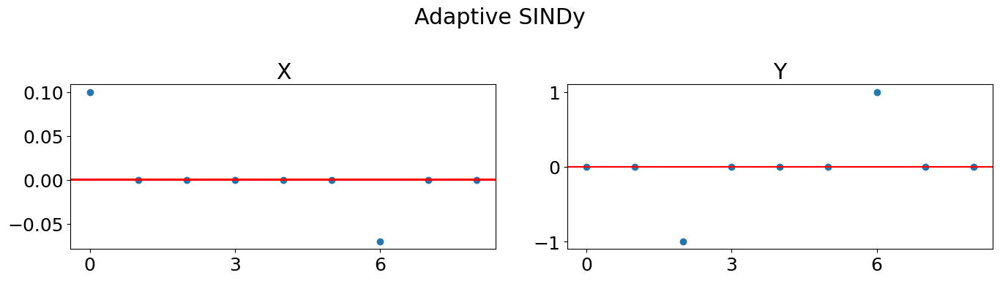

In [10]:
threshold = 0.0005
#****************************************************************************#
loc = plticker.MultipleLocator(base=3) # this locator puts ticks at regular intervals
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize =(14, 4))
fig.suptitle('Adaptive SINDy')

ax[0].plot(COEFF_ADT [:, 0].detach().cpu().numpy(), 'o')
ax[0].set_title('X')
ax[0].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[0].axhline(y = -threshold, color = 'r', linestyle = '-')
ax[0].xaxis.set_major_locator(loc)

ax[1].plot(COEFF_ADT [:, 1].detach().cpu().numpy(), 'o')
ax[1].set_title('Y')
ax[1].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[1].axhline(y = -threshold, color = 'r', linestyle = '-')
ax[1].xaxis.set_major_locator(loc)

fig.subplots_adjust(top=0.8)
fig.tight_layout()
plt.show()


In [11]:
print(COEFF_ADT[:, 0])
print(COEFF_ADT[:, 1])
print(XEXP_ADT [:, 0])
print(XEXP_ADT [:, 1])

tensor([ 0.1000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0700,  0.0000,
         0.0000], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0000,  0.0000, -1.0000,  0.0000,  0.0000,  0.0000,  1.0000,  0.0000,
         0.0000], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([-5.3330,  1.0150], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([-4.9771,  1.0250], device='cuda:0', grad_fn=<SelectBackward0>)


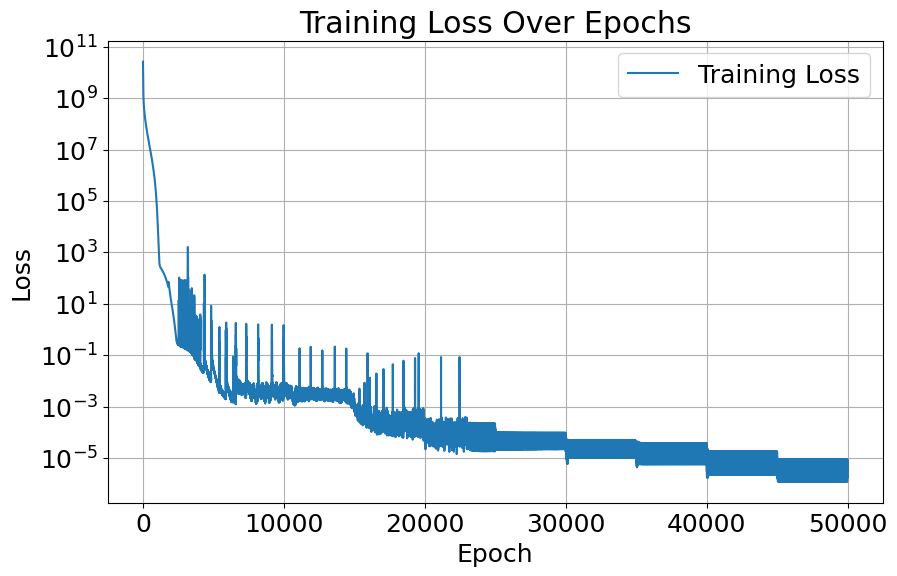

In [12]:
plt.figure(figsize=(10, 6))
plt.plot(Loss_data.numpy(), label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.yscale('log')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()